#**<font color = "FF9900">Mô Tả Bài Toán</font>**
---



Nguồn dữ liệu: https://fraud-detection-handbook.github.io/fraud-detection-handbook/Foreword.html

Dữ liệu thô: https://github.com/Fraud-Detection-Handbook/simulated-data-raw

Chuyển đổi dữ liệu thô: https://github.com/Fraud-Detection-Handbook/simulated-data-transformed




# <font color = "FF6666">Connect Drive</font>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# đường dẫn thư mục sẽ làm việc
WorkingPath ="/content/drive/MyDrive/TAI_LIEU_CUA_THAM/ThucTap_VinSmartFuture/Fraud-Detection-Handbook/"
%cd $WorkingPath

%pwd

/content/drive/MyDrive/TAI_LIEU_CUA_THAM/ThucTap_VinSmartFuture/Fraud-Detection-Handbook


'/content/drive/MyDrive/TAI_LIEU_CUA_THAM/ThucTap_VinSmartFuture/Fraud-Detection-Handbook'

# <font color = "FF6666">Import Libraries</font>

In [ ]:
# Import necessary python libraries
import os
import random
import pandas as pd
import numpy as np

import torch

import matplotlib.pyplot as plt

# <font color = "FF6666">Dataset</font>

In [ ]:
# Load shared functions
#!curl -O https://raw.githubusercontent.com/Fraud-Detection-Handbook/fraud-detection-handbook/main/Chapter_References/shared_functions.py
%run shared_functions.py

In [ ]:
# tải dữ liệu sau khi đã được tiền xử lý
DIR_INPUT='2_Fraud-detection-handbook_simulated-data-transformed/data/'

BEGIN_DATE = "2018-04-01"
END_DATE = "2018-09-30"

print("Load  files")
%time transactions_df=read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))

transactions_df.head(3)

Load  files
CPU times: user 1.31 s, sys: 1.06 s, total: 2.37 s
Wall time: 10.7 s
1754155 transactions loaded, containing 14681 fraudulent transactions


,TRANSACTION_ID,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_SECONDS,TX_TIME_DAYS,TX_FRAUD,TX_FRAUD_SCENARIO,TX_DURING_WEEKEND,...,CUSTOMER_ID_NB_TX_7DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW,CUSTOMER_ID_NB_TX_30DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW,TERMINAL_ID_NB_TX_1DAY_WINDOW,TERMINAL_ID_RISK_1DAY_WINDOW,TERMINAL_ID_NB_TX_7DAY_WINDOW,TERMINAL_ID_RISK_7DAY_WINDOW,TERMINAL_ID_NB_TX_30DAY_WINDOW,TERMINAL_ID_RISK_30DAY_WINDOW
0,0,2018-04-01 00:00:31,596,3156,57.16,31,0,0,0,1,...,1.0,57.16,1.0,57.16,0.0,0.0,0.0,0.0,0.0,0.0
1,1,2018-04-01 00:02:10,4961,3412,81.51,130,0,0,0,1,...,1.0,81.51,1.0,81.51,0.0,0.0,0.0,0.0,0.0,0.0
2,2,2018-04-01 00:07:56,2,1365,146.00,476,0,0,0,1,...,1.0,146.00,1.0,146.00,0.0,0.0,0.0,0.0,0.0,0.0


# <font color = "FF6666">1. Chia tập dữ liệu để bắt đầu train</font>

Chúng ta sẽ sử dụng các giao dịch từ ngày 2018-07-25 đến ngày 2018-07-31 cho tập train,

và từ ngày 2018-08-08 đến ngày 2018-08-14 cho tập test.

In [ ]:
# Load data from the 2018-07-25 to the 2018-08-14

DIR_INPUT='2_Fraud-detection-handbook_simulated-data-transformed/data/'

BEGIN_DATE = "2018-07-25"
END_DATE = "2018-08-14"

print("Load  files")
%time transactions_df=read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))

Load  files
CPU times: user 128 ms, sys: 31.2 ms, total: 159 ms
Wall time: 275 ms
201295 transactions loaded, containing 1792 fraudulent transactions


In [ ]:
# Compute the number of transactions per day, fraudulent transactions per day and fraudulent cards per day

def get_tx_stats(transactions_df, start_date_df="2018-04-01"):

    #Number of transactions per day
    nb_tx_per_day=transactions_df.groupby(['TX_TIME_DAYS'])['CUSTOMER_ID'].count()
    #Number of fraudulent transactions per day
    nb_fraudulent_transactions_per_day=transactions_df.groupby(['TX_TIME_DAYS'])['TX_FRAUD'].sum()
    #Number of compromised cards per day
    nb_compromised_cards_per_day=transactions_df[transactions_df['TX_FRAUD']==1].groupby(['TX_TIME_DAYS']).CUSTOMER_ID.nunique()

    tx_stats=pd.DataFrame({"nb_tx_per_day":nb_tx_per_day,
                           "nb_fraudulent_transactions_per_day":nb_fraudulent_transactions_per_day,
                           "nb_compromised_cards_per_day":nb_compromised_cards_per_day})

    tx_stats=tx_stats.reset_index()

    start_date = datetime.datetime.strptime(start_date_df, "%Y-%m-%d")
    tx_date=start_date+tx_stats['TX_TIME_DAYS'].apply(datetime.timedelta)

    tx_stats['tx_date']=tx_date

    return tx_stats

tx_stats=get_tx_stats(transactions_df, start_date_df="2018-04-01")

In [ ]:
%%capture

# Plot the number of transactions per day, fraudulent transactions per day and fraudulent cards per day

def get_template_tx_stats(ax ,fs,
                          start_date_training,
                          title='',
                          delta_train=7,
                          delta_delay=7,
                          delta_test=7,
                          ylim=300):

    ax.set_title(title, fontsize=fs*1.5)
    ax.set_ylim([0, ylim])

    ax.set_xlabel('Date', fontsize=fs)
    ax.set_ylabel('Number', fontsize=fs)

    plt.yticks(fontsize=fs*0.7)
    plt.xticks(fontsize=fs*0.7)

    ax.axvline(start_date_training+datetime.timedelta(days=delta_train), 0,ylim, color="black")
    ax.axvline(start_date_test, 0, ylim, color="black")

    ax.text(start_date_training+datetime.timedelta(days=2), ylim-20,'Training period', fontsize=fs)
    ax.text(start_date_training+datetime.timedelta(days=delta_train+2), ylim-20,'Delay period', fontsize=fs)
    ax.text(start_date_training+datetime.timedelta(days=delta_train+delta_delay+2), ylim-20,'Test period', fontsize=fs)


cmap = plt.get_cmap('jet')
colors={'nb_tx_per_day':cmap(0),
        'nb_fraudulent_transactions_per_day':cmap(200),
        'nb_compromised_cards_per_day':cmap(250)}

fraud_and_transactions_stats_fig, ax = plt.subplots(1, 1, figsize=(15,8))

# Training period
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train = delta_delay = delta_test = 7

end_date_training = start_date_training+datetime.timedelta(days=delta_train-1)

# Test period
start_date_test = start_date_training+datetime.timedelta(days=delta_train+delta_delay)
end_date_test = start_date_training+datetime.timedelta(days=delta_train+delta_delay+delta_test-1)

get_template_tx_stats(ax, fs=20,
                      start_date_training=start_date_training,
                      title='Total transactions, and number of fraudulent transactions \n and number of compromised cards per day',
                      delta_train=delta_train,
                      delta_delay=delta_delay,
                      delta_test=delta_test
                     )

ax.plot(tx_stats['tx_date'], tx_stats['nb_tx_per_day']/50, 'b', color=colors['nb_tx_per_day'], label = '# transactions per day (/50)')
ax.plot(tx_stats['tx_date'], tx_stats['nb_fraudulent_transactions_per_day'], 'b', color=colors['nb_fraudulent_transactions_per_day'], label = '# fraudulent txs per day')
ax.plot(tx_stats['tx_date'], tx_stats['nb_compromised_cards_per_day'], 'b', color=colors['nb_compromised_cards_per_day'], label = '# compromised cards per day')

ax.legend(loc = 'upper left',bbox_to_anchor=(1.05, 1),fontsize=20)

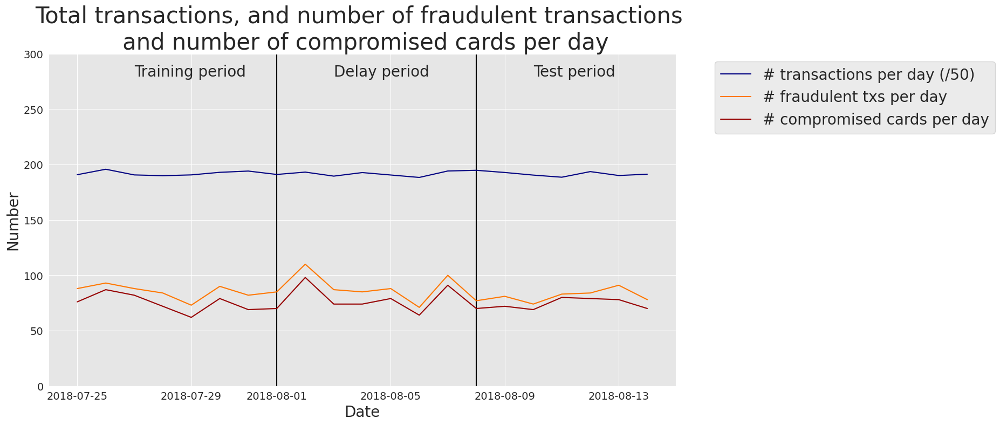

In [ ]:
fraud_and_transactions_stats_fig

In [ ]:
def get_train_test_set(transactions_df,
                       start_date_training,
                       delta_train=7,delta_delay=7,delta_test=7):

    # Get the training set data
    train_df = transactions_df[(transactions_df.TX_DATETIME>=start_date_training) &
                               (transactions_df.TX_DATETIME<start_date_training+datetime.timedelta(days=delta_train))]

    # Get the test set data
    test_df = []

    # Note: Cards known to be compromised after the delay period are removed from the test set
    # That is, for each test day, all frauds known at (test_day-delay_period) are removed

    # First, get known defrauded customers from the training set
    known_defrauded_customers = set(train_df[train_df.TX_FRAUD==1].CUSTOMER_ID)

    # Get the relative starting day of training set (easier than TX_DATETIME to collect test data)
    start_tx_time_days_training = train_df.TX_TIME_DAYS.min()

    # Then, for each day of the test set
    for day in range(delta_test):

        # Get test data for that day
        test_df_day = transactions_df[transactions_df.TX_TIME_DAYS==start_tx_time_days_training+
                                                                    delta_train+delta_delay+
                                                                    day]

        # Compromised cards from that test day, minus the delay period, are added to the pool of known defrauded customers
        test_df_day_delay_period = transactions_df[transactions_df.TX_TIME_DAYS==start_tx_time_days_training+
                                                                                delta_train+
                                                                                day-1]

        new_defrauded_customers = set(test_df_day_delay_period[test_df_day_delay_period.TX_FRAUD==1].CUSTOMER_ID)
        known_defrauded_customers = known_defrauded_customers.union(new_defrauded_customers)

        test_df_day = test_df_day[~test_df_day.CUSTOMER_ID.isin(known_defrauded_customers)]

        test_df.append(test_df_day)

    test_df = pd.concat(test_df)

    # Sort data sets by ascending order of transaction ID
    train_df=train_df.sort_values('TRANSACTION_ID')
    test_df=test_df.sort_values('TRANSACTION_ID')

    return (train_df, test_df)

In [ ]:
(train_df, test_df)=get_train_test_set(transactions_df,start_date_training,
                                       delta_train=7,delta_delay=7,delta_test=7)

Tập train gồm có 67240 giao dịch, trong đó có 598 giao dịch là gian lận.

In [ ]:
train_df.shape

(67240, 23)

In [ ]:
train_df[train_df.TX_FRAUD==1].shape

(598, 23)

Tập test gồm có 58264 giao dịch, trong đó có 385 giao dịch là gian lận.

In [ ]:
test_df.shape

(58264, 23)

In [ ]:
test_df[test_df.TX_FRAUD==1].shape

(385, 23)

Tức là, tỷ lệ giao dịch gian lận là 0,007.

In [ ]:
385/58264

0.00660785390635727

# <font color = "FF6666">2. Model training : Decision tree</font>

In [ ]:
output_feature="TX_FRAUD"

input_features=['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']

In [ ]:
def fit_model_and_get_predictions(classifier, train_df, test_df,
                                  input_features, output_feature="TX_FRAUD",scale=True):

    # By default, scales input data
    if scale:
        (train_df, test_df)=scaleData(train_df,test_df,input_features)

    # We first train the classifier using the `fit` method, and pass as arguments the input and output features
    start_time=time.time()
    classifier.fit(train_df[input_features], train_df[output_feature])
    training_execution_time=time.time()-start_time

    # We then get the predictions on the training and test data using the `predict_proba` method
    # The predictions are returned as a numpy array, that provides the probability of fraud for each transaction
    start_time=time.time()
    predictions_test=classifier.predict_proba(test_df[input_features])[:,1]
    prediction_execution_time=time.time()-start_time

    predictions_train=classifier.predict_proba(train_df[input_features])[:,1]

    # The result is returned as a dictionary containing the fitted models,
    # and the predictions on the training and test sets
    model_and_predictions_dictionary = {'classifier': classifier,
                                        'predictions_test': predictions_test,
                                        'predictions_train': predictions_train,
                                        'training_execution_time': training_execution_time,
                                        'prediction_execution_time': prediction_execution_time
                                       }

    return model_and_predictions_dictionary

In [ ]:
# We first create a decision tree object. We will limit its depth to 2 for interpretability,
# and set the random state to zero for reproducibility
classifier = sklearn.tree.DecisionTreeClassifier(max_depth = 2, random_state=0)

model_and_predictions_dictionary = fit_model_and_get_predictions(classifier, train_df, test_df,
                                                                 input_features, output_feature,
                                                                 scale=False)

In [ ]:
test_df['TX_FRAUD_PREDICTED']=model_and_predictions_dictionary['predictions_test']
test_df.head()

,TRANSACTION_ID,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_SECONDS,TX_TIME_DAYS,TX_FRAUD,TX_FRAUD_SCENARIO,TX_DURING_WEEKEND,...,CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW,CUSTOMER_ID_NB_TX_30DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW,TERMINAL_ID_NB_TX_1DAY_WINDOW,TERMINAL_ID_RISK_1DAY_WINDOW,TERMINAL_ID_NB_TX_7DAY_WINDOW,TERMINAL_ID_RISK_7DAY_WINDOW,TERMINAL_ID_NB_TX_30DAY_WINDOW,TERMINAL_ID_RISK_30DAY_WINDOW,TX_FRAUD_PREDICTED
134215,1236698,2018-08-08 00:01:14,2765,2747,42.32,11145674,129,0,0,0,...,67.468529,120.0,64.611750,2.0,0.0,9.0,0.0,31.0,0.000000,0.003536
134216,1236699,2018-08-08 00:02:33,714,2073,108.19,11145753,129,0,0,0,...,79.955455,124.0,85.365645,2.0,0.0,10.0,0.0,23.0,0.000000,0.003536
134218,1236701,2018-08-08 00:08:40,4982,1258,26.13,11146120,129,0,0,0,...,56.269167,61.0,49.095902,1.0,0.0,10.0,0.0,26.0,0.076923,0.003536
134219,1236702,2018-08-08 00:08:41,704,8501,65.81,11146121,129,0,0,0,...,62.643333,11.0,63.287273,1.0,0.0,6.0,0.0,23.0,0.000000,0.003536
134220,1236703,2018-08-08 00:10:34,3085,4208,55.22,11146234,129,0,0,0,...,71.993846,72.0,59.899306,1.0,0.0,5.0,0.0,21.0,0.523810,0.003536


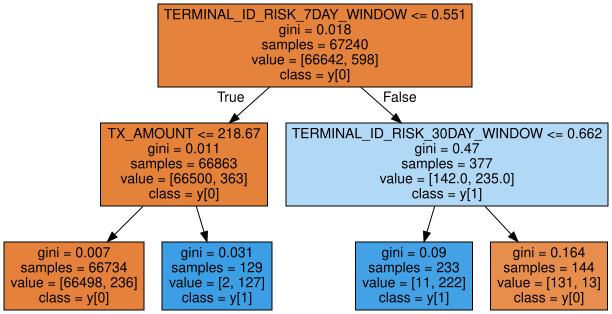

In [ ]:
display(graphviz.Source(sklearn.tree.export_graphviz(classifier,feature_names=input_features,class_names=True, filled=True)))

# <font color = "FF6666">3. Đánh giá hiệu suất</font>

In [ ]:
def card_precision_top_k_day(df_day,top_k):

    # This takes the max of the predictions AND the max of label TX_FRAUD for each CUSTOMER_ID,
    # and sorts by decreasing order of fraudulent prediction
    df_day = df_day.groupby('CUSTOMER_ID').max().sort_values(by="predictions", ascending=False).reset_index(drop=False)

    # Get the top k most suspicious cards
    df_day_top_k=df_day.head(top_k)
    list_detected_compromised_cards=list(df_day_top_k[df_day_top_k.TX_FRAUD==1].CUSTOMER_ID)

    # Compute precision top k
    card_precision_top_k = len(list_detected_compromised_cards) / top_k

    return list_detected_compromised_cards, card_precision_top_k

def card_precision_top_k(predictions_df, top_k, remove_detected_compromised_cards=True):

    # Sort days by increasing order
    list_days=list(predictions_df['TX_TIME_DAYS'].unique())
    list_days.sort()

    # At first, the list of detected compromised cards is empty
    list_detected_compromised_cards = []

    card_precision_top_k_per_day_list = []
    nb_compromised_cards_per_day = []

    # For each day, compute precision top k
    for day in list_days:

        df_day = predictions_df[predictions_df['TX_TIME_DAYS']==day]
        df_day = df_day[['predictions', 'CUSTOMER_ID', 'TX_FRAUD']]

        # Let us remove detected compromised cards from the set of daily transactions
        df_day = df_day[df_day.CUSTOMER_ID.isin(list_detected_compromised_cards)==False]

        nb_compromised_cards_per_day.append(len(df_day[df_day.TX_FRAUD==1].CUSTOMER_ID.unique()))

        detected_compromised_cards, card_precision_top_k = card_precision_top_k_day(df_day,top_k)

        card_precision_top_k_per_day_list.append(card_precision_top_k)

        # Let us update the list of detected compromised cards
        if remove_detected_compromised_cards:
            list_detected_compromised_cards.extend(detected_compromised_cards)

    # Compute the mean
    mean_card_precision_top_k = np.array(card_precision_top_k_per_day_list).mean()

    # Returns precision top k per day as a list, and resulting mean
    return nb_compromised_cards_per_day,card_precision_top_k_per_day_list,mean_card_precision_top_k

def performance_assessment(predictions_df, output_feature='TX_FRAUD',
                           prediction_feature='predictions', top_k_list=[100],
                           rounded=True):

    AUC_ROC = metrics.roc_auc_score(predictions_df[output_feature], predictions_df[prediction_feature])
    AP = metrics.average_precision_score(predictions_df[output_feature], predictions_df[prediction_feature])

    performances = pd.DataFrame([[AUC_ROC, AP]],
                           columns=['AUC ROC','Average precision'])

    for top_k in top_k_list:

        _, _, mean_card_precision_top_k = card_precision_top_k(predictions_df, top_k)
        performances['Card Precision@'+str(top_k)]=mean_card_precision_top_k

    if rounded:
        performances = performances.round(3)

    return performances

In [ ]:
predictions_df=test_df
predictions_df['predictions']=model_and_predictions_dictionary['predictions_test']

performance_assessment(predictions_df, top_k_list=[100])

,AUC ROC,Average precision,Card Precision@100
0,0.763,0.496,0.241


Chỉ số dễ hiểu nhất là Card Precision@100, cho biết mỗi ngày, 24% số thẻ có điểm gian lận cao nhất thực sự bị xâm phạm.

có nghĩa là trung bình, bộ phân loại này cho phép phát hiện chính xác 24 thẻ bị xâm phạm mỗi ngày trong số 100 thẻ đáng ngờ nhất được xác định bởi mô hình dự đoán.

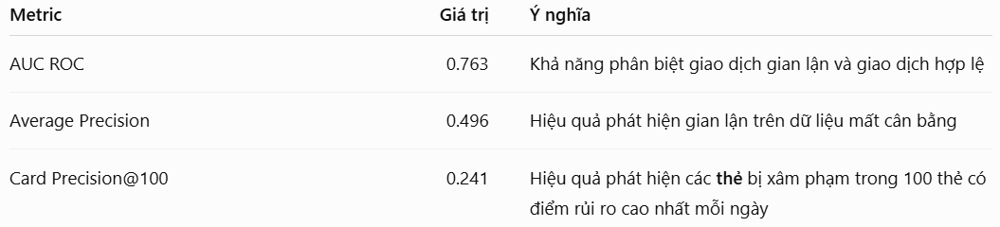

In [ ]:
predictions_df['predictions']=0.5

performance_assessment(predictions_df, top_k_list=[100])

,AUC ROC,Average precision,Card Precision@100
0,0.5,0.007,0.016


# <font color = "FF6666">4. Hiệu suất sử dụng các mô hình dự đoán tiêu chuẩn</font>

In [ ]:
classifiers_dictionary={'Logistic regression':sklearn.linear_model.LogisticRegression(random_state=0),
                        'Decision tree with depth of two':sklearn.tree.DecisionTreeClassifier(max_depth=2,random_state=0),
                        'Decision tree - unlimited depth':sklearn.tree.DecisionTreeClassifier(random_state=0),
                        'Random forest':sklearn.ensemble.RandomForestClassifier(random_state=0,n_jobs=-1),
                        'XGBoost':xgboost.XGBClassifier(random_state=0,n_jobs=-1),
                       }

fitted_models_and_predictions_dictionary={}

for classifier_name in classifiers_dictionary:

    model_and_predictions = fit_model_and_get_predictions(classifiers_dictionary[classifier_name], train_df, test_df,
                                                                                  input_features=input_features,
                                                                                output_feature=output_feature)
    fitted_models_and_predictions_dictionary[classifier_name]=model_and_predictions

In [ ]:
def performance_assessment_model_collection(fitted_models_and_predictions_dictionary,
                                            transactions_df,
                                            type_set='test',
                                            top_k_list=[100]):

    performances=pd.DataFrame()

    for classifier_name, model_and_predictions in fitted_models_and_predictions_dictionary.items():

        predictions_df=transactions_df

        predictions_df['predictions']=model_and_predictions['predictions_'+type_set]

        performances_model=performance_assessment(predictions_df, output_feature='TX_FRAUD',
                                                   prediction_feature='predictions', top_k_list=top_k_list)
        performances_model.index=[classifier_name]

        performances=pd.concat([performances, performances_model])

    return performances

In [ ]:
# performances on test set
df_performances=performance_assessment_model_collection(fitted_models_and_predictions_dictionary, test_df,
                                                        type_set='test',
                                                        top_k_list=[100])
df_performances

,AUC ROC,Average precision,Card Precision@100
Logistic regression,0.870,0.605,0.291
Decision tree with depth of two,0.763,0.496,0.241
Decision tree - unlimited depth,0.788,0.309,0.241
Random forest,0.867,0.658,0.287
XGBoost,0.851,0.572,0.257


In [ ]:
# performances on training set
df_performances=performance_assessment_model_collection(fitted_models_and_predictions_dictionary, train_df,
                                                        type_set='train',
                                                        top_k_list=[100])
df_performances

,AUC ROC,Average precision,Card Precision@100
Logistic regression,0.892,0.663,0.419
Decision tree with depth of two,0.802,0.586,0.393
Decision tree - unlimited depth,1.000,1.000,0.576
Random forest,1.000,1.000,0.576
XGBoost,1.000,0.991,0.574


Các mô hình ít nhạy cảm nhất với hiện tượng quá khớp là mô hình hồi quy logistic và cây quyết định với độ sâu 2.

In [ ]:
def execution_times_model_collection(fitted_models_and_predictions_dictionary):

    execution_times=pd.DataFrame()

    for classifier_name, model_and_predictions in fitted_models_and_predictions_dictionary.items():

        execution_times_model=pd.DataFrame()
        execution_times_model['Training execution time']=[model_and_predictions['training_execution_time']]
        execution_times_model['Prediction execution time']=[model_and_predictions['prediction_execution_time']]
        execution_times_model.index=[classifier_name]

        execution_times=pd.concat([execution_times, execution_times_model])

    return execution_times

In [ ]:
# Execution times
df_execution_times=execution_times_model_collection(fitted_models_and_predictions_dictionary)
df_execution_times

,Training execution time,Prediction execution time
Logistic regression,0.425041,0.015513
Decision tree with depth of two,0.174285,0.008993
Decision tree - unlimited depth,1.622683,0.014817
Random forest,17.506505,0.504596
XGBoost,0.831816,0.122518


# <font color = "FF6666">5. Các matric đánh giá hiệu suất</font>

Các chỉ số phổ biến nhất là the recall, the specificity, the precision, the F1 score, the AUC ROC, và the Average Precision.

### <font color = "green">5.1 Threshold-based metrics</font>



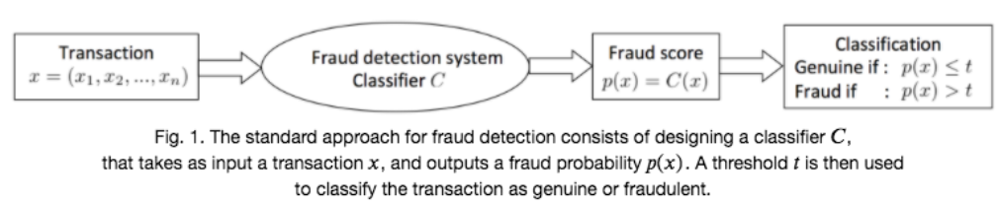

nguồn : https://fraud-detection-handbook.github.io/fraud-detection-handbook/Chapter_4_PerformanceMetrics/ThresholdBased.html

In [ ]:
!pip install pretty-confusion-matrix

In [ ]:
from pretty_confusion_matrix import pp_matrix_from_data

In [ ]:
# Getting classes from a vector of fraud probabilities and a threshold
def get_class_from_fraud_probability(fraud_probabilities, threshold=0.5):

    predicted_classes = [0 if fraud_probability<threshold else 1
                         for fraud_probability in fraud_probabilities]

    return predicted_classes

In [ ]:
# Implementation of the mean misclassification error
def compute_MME(true_labels,predicted_classes):

    N = len(true_labels)

    MME = np.sum(np.array(true_labels)!=np.array(predicted_classes))/N

    return MME

Chỉ số MME thường là một chỉ báo tốt về hiệu suất của bộ phân loại đối với các tập dữ liệu cân bằng.

Đối với các vấn đề nhạy cảm về chi phí như phát hiện gian lận, MME có một số hạn chế.

In [ ]:
# 2 fraudulent and 8 genuine transactions
true_labels = [1,1,0,0,0,0,0,0,0,0]

# Probability of fraud for each transaction
fraud_probabilities = [0.9,0.35,0.45,0.4,0.2,0.2,0.2,0.1,0.1,0]

Threshold = 1
MME = 0.2000


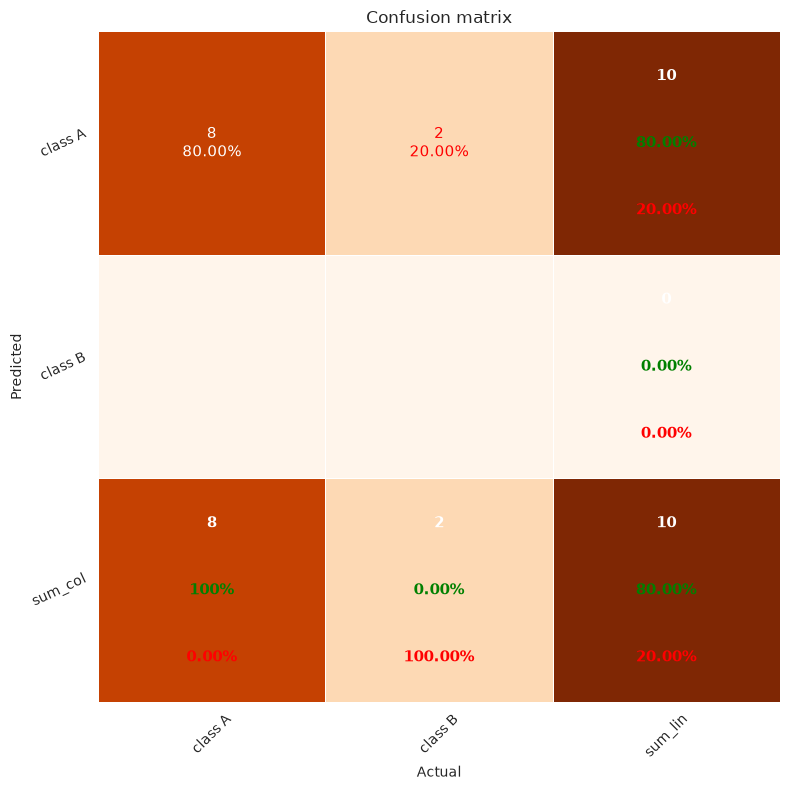

Threshold = 0.5
MME = 0.1000


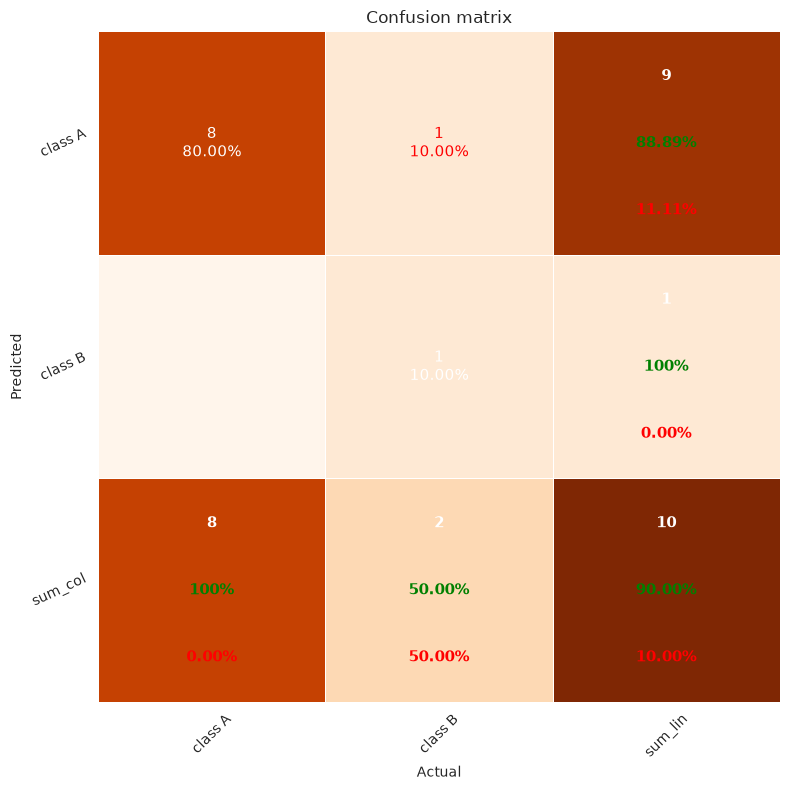

Threshold = 0.3
MME = 0.2000


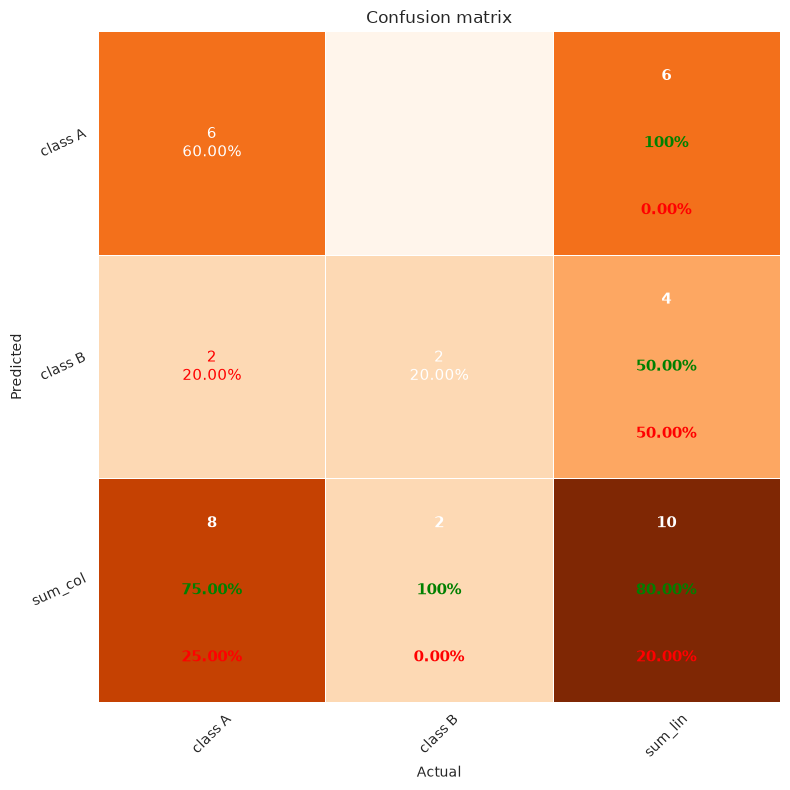

In [ ]:
thresholds = [1, 0.5, 0.3]

for threshold in thresholds:

    predicted_classes = get_class_from_fraud_probability(
        fraud_probabilities,
        threshold=threshold
    )

    mme = compute_MME(true_labels, predicted_classes)

    print("=" * 50)
    print(f"Threshold = {threshold}")
    print(f"MME = {mme:.4f}")

    pp_matrix_from_data(true_labels, predicted_classes)

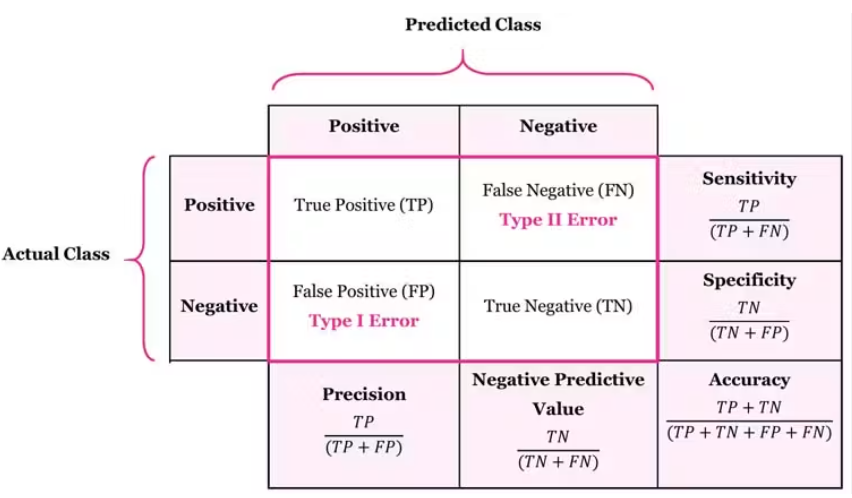


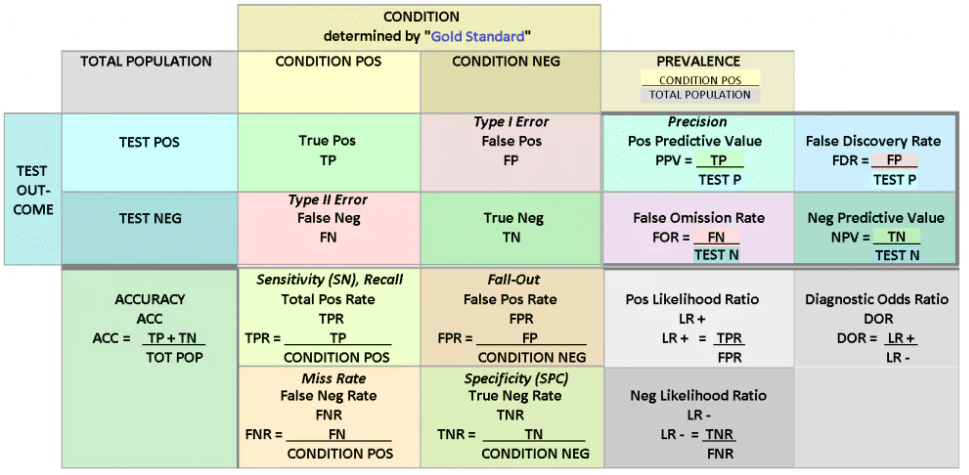

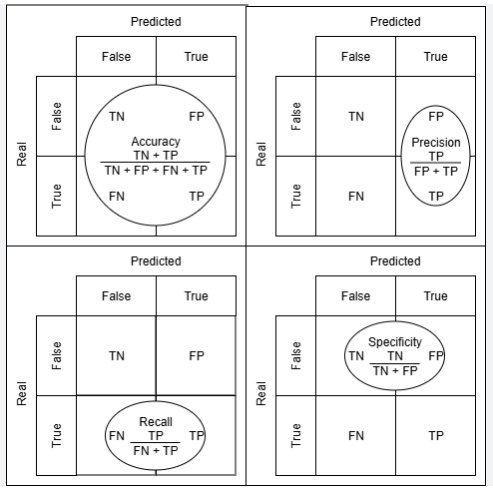

In [ ]:
def threshold_based_metrics(fraud_probabilities, true_label, thresholds_list):

    results = []

    for threshold in thresholds_list:

        predicted_classes = get_class_from_fraud_probability(fraud_probabilities, threshold=threshold)

        (TN, FP, FN, TP) = metrics.confusion_matrix(true_label, predicted_classes).ravel()

        MME = (FP+FN)/(TN+FP+FN+TP)

        TPR = TP/(TP+FN)
        TNR = TN/(TN+FP)

        FPR = FP/(TN+FP)
        FNR = FN/(TP+FN)

        BER = 1/2*(FPR+FNR)

        Gmean = np.sqrt(TPR*TNR)

        precision = 0
        FDR = 0
        F1_score=0

        if TP+FP>0:
            precision = TP/(TP+FP)
            FDR=FP/(TP+FP)

        NPV = 0
        FOR = 0

        if TN+FN>0:
            NPV = TN/(TN+FN)
            FOR = FN/(TN+FN)


        if precision+TPR>0:
            F1_score = 2*(precision*TPR)/(precision+TPR)

        results.append([threshold, MME, TPR, TNR, FPR, FNR, BER, Gmean, precision, NPV, FDR, FOR, F1_score])

    results_df = pd.DataFrame(results,columns=['Threshold' ,'MME', 'TPR', 'TNR', 'FPR', 'FNR', 'BER', 'G-mean', 'Precision', 'NPV', 'FDR', 'FOR', 'F1 Score'])

    return results_df

In [ ]:
unique_thresholds = list(set(fraud_probabilities))
unique_thresholds.sort(reverse=True)
unique_thresholds

[0.9, 0.45, 0.4, 0.35, 0.2, 0.1, 0]

In [ ]:
results_df = threshold_based_metrics(fraud_probabilities, true_labels, unique_thresholds)

In [ ]:
results_df

,Threshold,MME,TPR,TNR,FPR,FNR,BER,G-mean,Precision,NPV,FDR,FOR,F1 Score
0,0.90,0.1,0.5,1.000,0.000,0.5,0.2500,0.707107,1.000000,0.888889,0.000000,0.111111,0.666667
1,0.45,0.2,0.5,0.875,0.125,0.5,0.3125,0.661438,0.500000,0.875000,0.500000,0.125000,0.500000
2,0.40,0.3,0.5,0.750,0.250,0.5,0.3750,0.612372,0.333333,0.857143,0.666667,0.142857,0.400000
3,0.35,0.2,1.0,0.750,0.250,0.0,0.1250,0.866025,0.500000,1.000000,0.500000,0.000000,0.666667
4,0.20,0.5,1.0,0.375,0.625,0.0,0.3125,0.612372,0.285714,1.000000,0.714286,0.000000,0.444444
5,0.10,0.7,1.0,0.125,0.875,0.0,0.4375,0.353553,0.222222,1.000000,0.777778,0.000000,0.363636
6,0.00,0.8,1.0,0.000,1.000,0.0,0.5000,0.000000,0.200000,0.000000,0.800000,0.000000,0.333333


### <font color = "green">5.2 Threshold-free metrics</font>



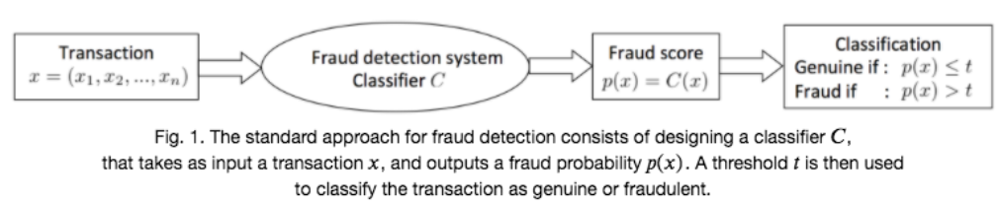

In [ ]:
# Initialization: Load shared functions and simulated data

# Load shared functions
!curl -O https://raw.githubusercontent.com/Fraud-Detection-Handbook/fraud-detection-handbook/main/Chapter_References/shared_functions.py
%run shared_functions.py

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 63257  100 63257    0     0   270k      0 --:--:-- --:--:-- --:--:--  272k


<Figure size 640x480 with 0 Axes>

In [ ]:
# 2 fraudulent and 8 genuine transactions
true_labels = [1,1,0,0,0,0,0,0,0,0]

# Probability of fraud for each transaction
fraud_probabilities = [0.9,0.35,0.45,0.4,0.2,0.2,0.2,0.1,0.1,0]

Một ngưỡng cao hơn 1 (được đặt là 1.1) cũng được thêm vào cho trường hợp tất cả các giao dịch đều được dự đoán là hợp lệ.

In [ ]:
unique_thresholds = [1.1]+list(set(fraud_probabilities))
unique_thresholds.sort(reverse=True)
unique_thresholds

[1.1, 0.9, 0.45, 0.4, 0.35, 0.2, 0.1, 0]

In [ ]:
performance_metrics=threshold_based_metrics(fraud_probabilities, true_labels, unique_thresholds)
performance_metrics[['Threshold','TPR','FPR']]

,Threshold,TPR,FPR
0,1.10,0.0,0.000
1,0.90,0.5,0.000
2,0.45,0.5,0.125
3,0.40,0.5,0.250
4,0.35,1.0,0.250
5,0.20,1.0,0.625
6,0.10,1.0,0.875
7,0.00,1.0,1.000


Đúng như dự đoán, ngưỡng càng thấp thì tỷ lệ phát hiện giao dịch đúng (TPR) càng cao (càng phát hiện nhiều giao dịch gian lận), nhưng tỷ lệ phát hiện giao dịch sai (FPR) cũng càng cao (càng nhiều giao dịch hợp lệ bị phân loại là gian lận).

In [ ]:
FPR_list, TPR_list, threshold = sklearn.metrics.roc_curve(true_labels, fraud_probabilities, drop_intermediate=False)
FPR_list, TPR_list, threshold

(array([0.   , 0.   , 0.125, 0.25 , 0.25 , 0.625, 0.875, 1.   ]),
 array([0. , 0.5, 0.5, 0.5, 1. , 1. , 1. , 1. ]),
 array([ inf, 0.9 , 0.45, 0.4 , 0.35, 0.2 , 0.1 , 0.  ]))

In [ ]:
%%capture
def get_template_roc_curve(ax, title,fs,random=True):

    ax.set_title(title, fontsize=fs)
    ax.set_xlim([-0.01, 1.01])
    ax.set_ylim([-0.01, 1.01])

    ax.set_xlabel('False Positive Rate', fontsize=fs)
    ax.set_ylabel('True Positive Rate', fontsize=fs)

    if random:
        ax.plot([0, 1], [0, 1],'r--',label="AUC ROC Random = 0.5")

ROC_AUC = metrics.auc(FPR_list, TPR_list)

roc_curve, ax = plt.subplots(figsize=(5,5))
get_template_roc_curve(ax, "Receiver Operating Characteristic (ROC) Curve",fs=15)
ax.plot(FPR_list, TPR_list, 'b', color='blue', label = 'AUC ROC Classifier = {0:0.3f}'.format(ROC_AUC))
ax.legend(loc = 'lower right')

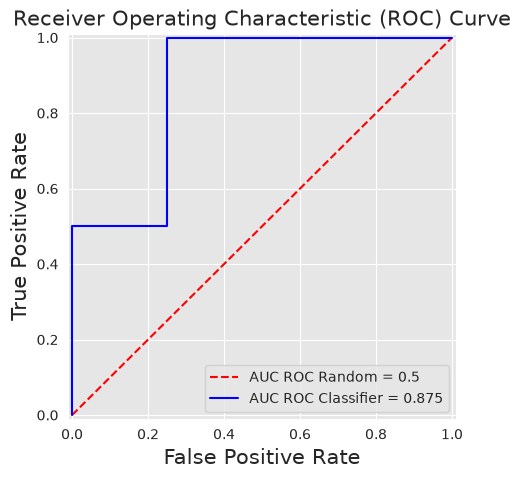

In [ ]:
roc_curve

In [ ]:
output_feature="TX_FRAUD"

input_features=['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']

classifiers_dictionary={'Logistic regression':sklearn.linear_model.LogisticRegression(random_state=0),
                        'Decision tree with depth of two':sklearn.tree.DecisionTreeClassifier(max_depth=2,random_state=0),
                        'Decision tree - unlimited depth':sklearn.tree.DecisionTreeClassifier(random_state=0),
                        'Random forest':sklearn.ensemble.RandomForestClassifier(random_state=0,n_jobs=-1),
                        'XGBoost':xgboost.XGBClassifier(random_state=0,n_jobs=-1),
                       }

fitted_models_and_predictions_dictionary={}

for classifier_name in classifiers_dictionary:

    start_time=time.time()
    model_and_predictions = fit_model_and_get_predictions(classifiers_dictionary[classifier_name], train_df, test_df,
                                                          input_features=input_features,
                                                          output_feature=output_feature)

    print("Time to fit the "+classifier_name+" model: "+str(round(time.time()-start_time,2)))

    fitted_models_and_predictions_dictionary[classifier_name]=model_and_predictions


Time to fit the Logistic regression model: 0.43
Time to fit the Decision tree with depth of two model: 0.42
Time to fit the Decision tree - unlimited depth model: 2.46
Time to fit the Random forest model: 23.13
Time to fit the XGBoost model: 3.85


In [ ]:
%%capture
roc_curve, ax = plt.subplots(1, 1, figsize=(5,5))

cmap = plt.get_cmap('jet')
colors={'Logistic regression':cmap(0), 'Decision tree with depth of two':cmap(200),
        'Decision tree - unlimited depth':cmap(250),
        'Random forest':cmap(70), 'XGBoost':cmap(40)}

get_template_roc_curve(ax,title='Receiver Operating Characteristic Curve\nTest data',fs=15)

for classifier_name in classifiers_dictionary:

    model_and_predictions=fitted_models_and_predictions_dictionary[classifier_name]

    FPR_list, TPR_list, threshold = metrics.roc_curve(test_df[output_feature], model_and_predictions['predictions_test'])
    ROC_AUC = metrics.auc(FPR_list, TPR_list)

    ax.plot(FPR_list, TPR_list, 'b', color=colors[classifier_name], label = 'AUC ROC {0}= {1:0.3f}'.format(classifier_name,ROC_AUC))
    ax.legend(loc = 'upper left',bbox_to_anchor=(1.05, 1))

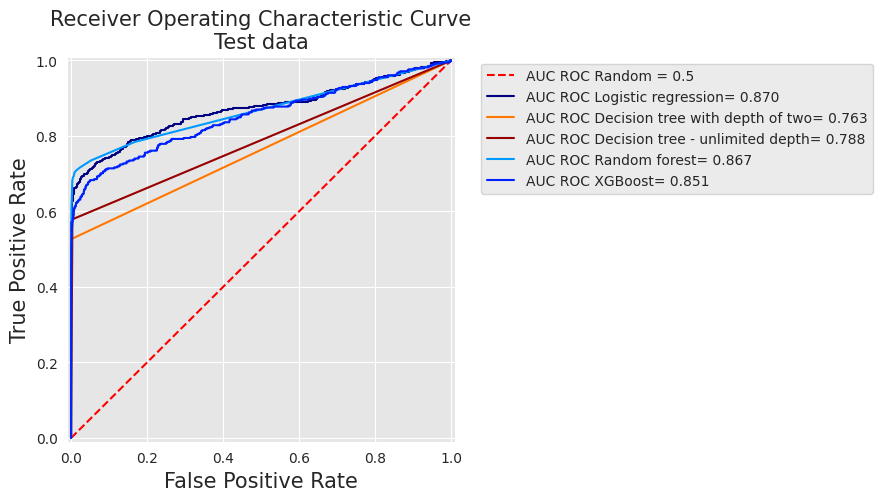

In [ ]:
roc_curve

In [ ]:
test_df[test_df.TX_FRAUD==0].shape

(57879, 23)

In [ ]:
test_df[test_df.TX_FRAUD==1].shape

(385, 23)

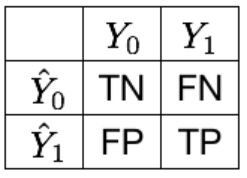

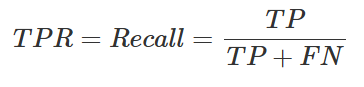

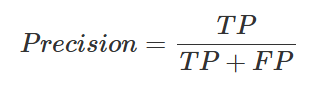

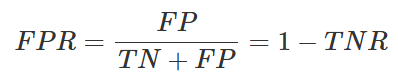

In [ ]:
# 2 fraudulent and 8 genuine transactions
true_labels = [1,1,0,0,0,0,0,0,0,0]

# Probability of fraud for each transaction
fraud_probabilities = [0.9,0.35,0.45,0.4,0.2,0.2,0.2,0.1,0.1,0]

unique_thresholds = [1.1]+list(set(fraud_probabilities))
unique_thresholds.sort(reverse=True)

performance_metrics=threshold_based_metrics(fraud_probabilities, true_labels, unique_thresholds)
performance_metrics[['Threshold','Precision','TPR']]

,Threshold,Precision,TPR
0,1.10,1.000000,0.0
1,0.90,1.000000,0.5
2,0.45,0.500000,0.5
3,0.40,0.333333,0.5
4,0.35,0.500000,1.0
5,0.20,0.285714,1.0
6,0.10,0.222222,1.0
7,0.00,0.200000,1.0


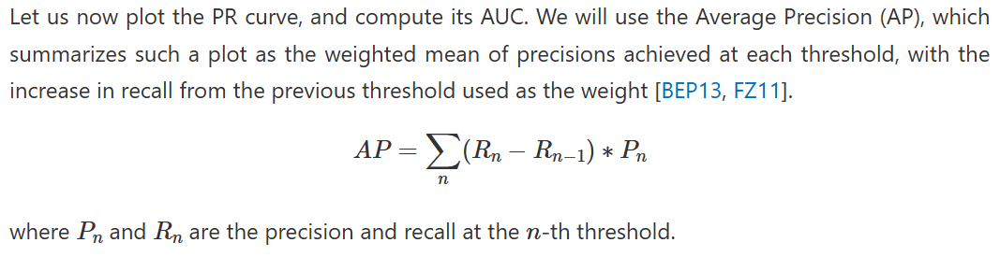

In [ ]:
def compute_AP(precision, recall):

    AP = 0

    n_thresholds = len(precision)

    for i in range(1, n_thresholds):

        if recall[i]-recall[i-1]>=0:

            AP = AP+(recall[i]-recall[i-1])*precision[i]

    return AP

In [ ]:
%%capture
def get_template_pr_curve(ax, title,fs, baseline=0.5):
    ax.set_title(title, fontsize=fs)
    ax.set_xlim([-0.01, 1.01])
    ax.set_ylim([-0.01, 1.01])

    ax.set_xlabel('Recall (True Positive Rate)', fontsize=fs)
    ax.set_ylabel('Precision', fontsize=fs)

    ax.plot([0, 1], [baseline, baseline],'r--',label='AP Random = {0:0.3f}'.format(baseline))

precision = performance_metrics.Precision.values
recall = performance_metrics.TPR.values

pr_curve, ax = plt.subplots(figsize=(5,5))
get_template_pr_curve(ax, "Precision Recall (PR) Curve",fs=15,baseline=sum(true_labels)/len(true_labels))
AP2 = metrics.average_precision_score(true_labels, fraud_probabilities)
AP = compute_AP(precision, recall)
ax.step(recall, precision, 'b', color='blue', label = 'AP Classifier = {0:0.3f}'.format(AP))
ax.legend(loc = 'lower right')

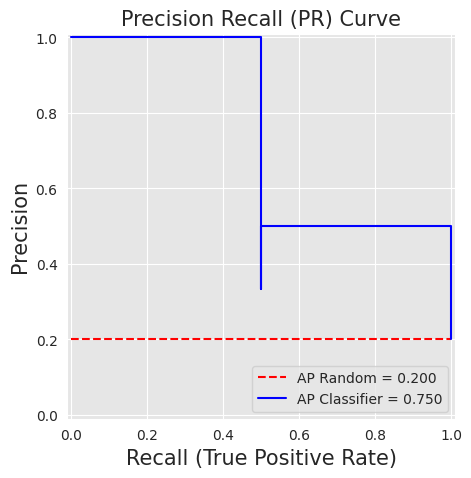

In [ ]:
pr_curve

In [ ]:
%%capture
pr_curve, ax = plt.subplots(1, 1, figsize=(6,6))
cmap = plt.get_cmap('jet')
colors={'Logistic regression':cmap(0), 'Decision tree with depth of two':cmap(200),
        'Decision tree - unlimited depth':cmap(250),
        'Random forest':cmap(70), 'XGBoost':cmap(40)}

get_template_pr_curve(ax, "Precision Recall (PR) Curve\nTest data",fs=15,baseline=sum(test_df[output_feature])/len(test_df[output_feature]))

for classifier_name in classifiers_dictionary:

    model_and_predictions=fitted_models_and_predictions_dictionary[classifier_name]

    precision, recall, threshold = metrics.precision_recall_curve(test_df[output_feature], model_and_predictions['predictions_test'])
    precision=precision[::-1]
    recall=recall[::-1]

    AP = metrics.average_precision_score(test_df[output_feature], model_and_predictions['predictions_test'])

    ax.step(recall, precision, 'b', color=colors[classifier_name], label = 'AP {0}= {1:0.3f}'.format(classifier_name,AP))
    ax.legend(loc = 'upper left',bbox_to_anchor=(1.05, 1))


plt.subplots_adjust(wspace=0.5, hspace=0.8)

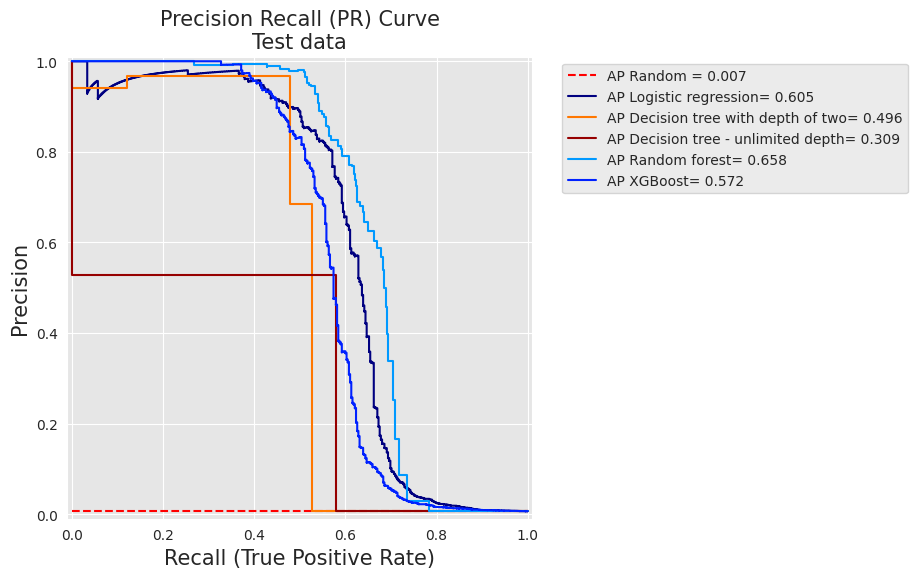

In [ ]:
pr_curve

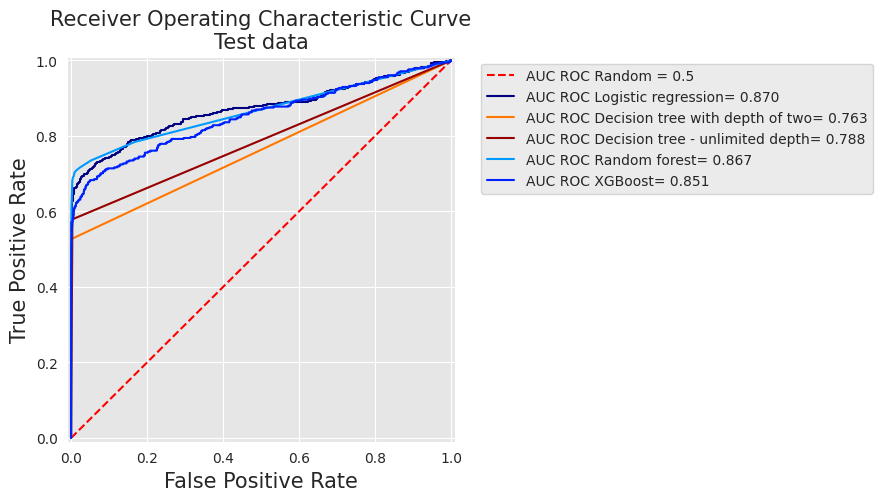

In [ ]:
roc_curve

### <font color = "green">5.3 Precision top-k metrics</font>



In [ ]:
output_feature="TX_FRAUD"

input_features=['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']

classifier = sklearn.tree.DecisionTreeClassifier(max_depth = 2, random_state=0)

model_and_predictions_dictionary = fit_model_and_get_predictions(classifier, train_df, test_df,
                                                                 input_features, output_feature)

In [ ]:
assert len(model_and_predictions_dictionary['predictions_test'])==len(test_df)

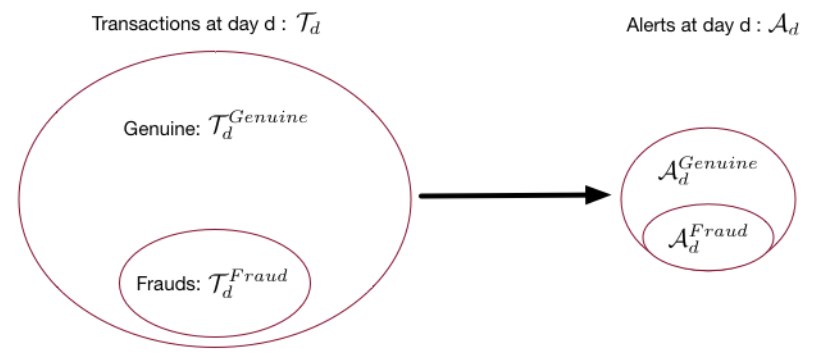

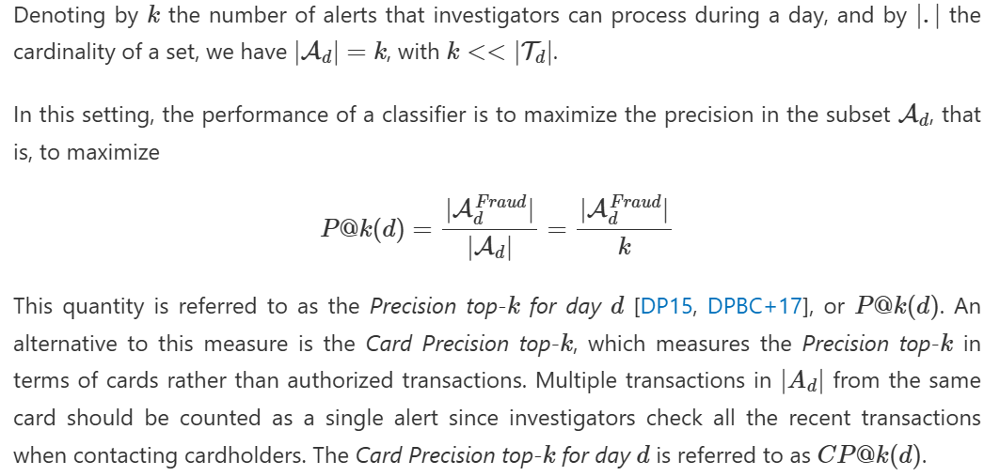

In [ ]:
predictions_df=test_df
predictions_df['predictions']=model_and_predictions_dictionary['predictions_test']
predictions_df[['TRANSACTION_ID','TX_DATETIME','CUSTOMER_ID','TERMINAL_ID','TX_AMOUNT','TX_TIME_DAYS','TX_FRAUD','predictions']].head()

,TRANSACTION_ID,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_DAYS,TX_FRAUD,predictions
134215,1236698,2018-08-08 00:01:14,2765,2747,-0.266899,129,0,0.003536
134216,1236699,2018-08-08 00:02:33,714,2073,1.295440,129,0,0.003536
134218,1236701,2018-08-08 00:08:40,4982,1258,-0.650902,129,0,0.003536
134219,1236702,2018-08-08 00:08:41,704,8501,0.290249,129,0,0.003536
134220,1236703,2018-08-08 00:10:34,3085,4208,0.039070,129,0,0.003536


In [ ]:
def precision_top_k_day(df_day, top_k=100):

    # Order transactions by decreasing probabilities of frauds
    df_day = df_day.sort_values(by="predictions", ascending=False).reset_index(drop=False)

    # Get the top k most suspicious transactions
    df_day_top_k=df_day.head(top_k)
    list_detected_fraudulent_transactions=list(df_day_top_k[df_day_top_k.TX_FRAUD==1].TRANSACTION_ID)

    # Compute precision top k
    precision_top_k = len(list_detected_fraudulent_transactions) / top_k

    return list_detected_fraudulent_transactions, precision_top_k


day=129

df_day = predictions_df[predictions_df['TX_TIME_DAYS']==day]
df_day = df_day[['TRANSACTION_ID','CUSTOMER_ID', 'TX_FRAUD', 'predictions']]

_, precision_top_k= precision_top_k_day(df_day=df_day, top_k=100)
precision_top_k

0.26

In [ ]:
df_day.TX_FRAUD.sum()

np.int64(55)

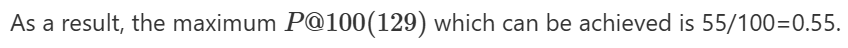

In [ ]:
def precision_top_k(predictions_df, top_k=100):

    # Sort days by increasing order
    list_days=list(predictions_df['TX_TIME_DAYS'].unique())
    list_days.sort()

    precision_top_k_per_day_list = []
    nb_fraudulent_transactions_per_day = []

    # For each day, compute precision top k
    for day in list_days:

        df_day = predictions_df[predictions_df['TX_TIME_DAYS']==day]
        df_day = df_day[['TRANSACTION_ID', 'CUSTOMER_ID', 'TX_FRAUD', 'predictions']]

        nb_fraudulent_transactions_per_day.append(len(df_day[df_day.TX_FRAUD==1]))

        _, _precision_top_k = precision_top_k_day(df_day, top_k=top_k)

        precision_top_k_per_day_list.append(_precision_top_k)

    # Compute the mean
    mean_precision_top_k = np.round(np.array(precision_top_k_per_day_list).mean(),3)

    # Returns number of fraudulent transactions per day,
    # precision top k per day, and resulting mean
    return nb_fraudulent_transactions_per_day,precision_top_k_per_day_list,mean_precision_top_k

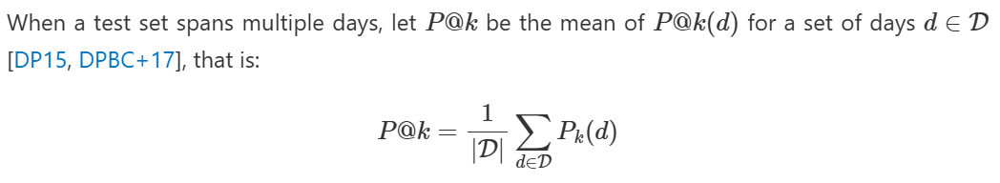

In [ ]:
nb_fraudulent_transactions_per_day_remaining,\
precision_top_k_per_day_list,\
mean_precision_top_k = precision_top_k(predictions_df=predictions_df, top_k=100)

print("Number of remaining fraudulent transactions: "+str(nb_fraudulent_transactions_per_day_remaining))
print("Precision top-k: "+str(precision_top_k_per_day_list))
print("Average Precision top-k: "+str(mean_precision_top_k))

Number of remaining fraudulent transactions: [55, 60, 56, 56, 59, 58, 41]
Precision top-k: [0.26, 0.35, 0.26, 0.33, 0.3, 0.35, 0.19]
Average Precision top-k: 0.291


In [ ]:
# Compute the number of transactions per day,
#fraudulent transactions per day and fraudulent cards per day
tx_stats=get_tx_stats(transactions_df, start_date_df="2018-04-01")

# Add the remaining number of fraudulent transactions for the last 7 days (test period)
tx_stats.loc[14:20,'nb_fraudulent_transactions_per_day_remaining']=list(nb_fraudulent_transactions_per_day_remaining)
# Add precision top k for the last 7 days (test period)
tx_stats.loc[14:20,'precision_top_k_per_day']=precision_top_k_per_day_list

In [ ]:
%%capture

# Plot the number of transactions per day, fraudulent transactions per day and fraudulent cards per day

cmap = plt.get_cmap('jet')
colors={'precision_top_k_per_day':cmap(0),
        'nb_fraudulent_transactions_per_day':cmap(200),
        'nb_fraudulent_transactions_per_day_remaining':cmap(250),
       }

fraud_and_transactions_stats_fig, ax = plt.subplots(1, 1, figsize=(15,8))

# Training period
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train = delta_delay = delta_test = 7

end_date_training = start_date_training+datetime.timedelta(days=delta_train-1)

# Test period
start_date_test = start_date_training+datetime.timedelta(days=delta_train+delta_delay)
end_date_test = start_date_training+datetime.timedelta(days=delta_train+delta_delay+delta_test-1)

get_template_tx_stats(ax, fs=20,
                      start_date_training=start_date_training,
                      title='Number of fraudulent transactions per day \n and number of detected fraudulent transactions',
                      delta_train=delta_train,
                      delta_delay=delta_delay,
                      delta_test=delta_test,
                      ylim=150
                     )

ax.plot(tx_stats['tx_date'], tx_stats['nb_fraudulent_transactions_per_day'], 'b', color=colors['nb_fraudulent_transactions_per_day'], label = '# fraudulent txs per day - Original')
ax.plot(tx_stats['tx_date'], tx_stats['nb_fraudulent_transactions_per_day_remaining'], 'b', color=colors['nb_fraudulent_transactions_per_day_remaining'], label = '# fraudulent txs per day - Remaining')
ax.plot(tx_stats['tx_date'], tx_stats['precision_top_k_per_day']*100, 'b', color=colors['precision_top_k_per_day'], label = '# detected fraudulent txs per day')
ax.legend(loc = 'upper left',bbox_to_anchor=(1.05, 1),fontsize=20)


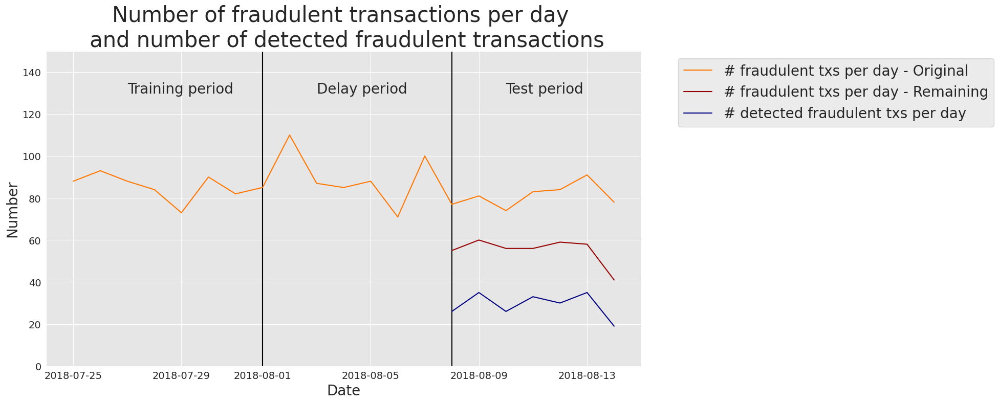

In [ ]:
fraud_and_transactions_stats_fig

In [ ]:
def card_precision_top_k_day(df_day, top_k):

    # This takes the max of the predictions AND the max of label TX_FRAUD for each CUSTOMER_ID,
    # and sorts by decreasing order of fraudulent prediction
    df_day = df_day.groupby('CUSTOMER_ID').max().sort_values(by="predictions", ascending=False).reset_index(drop=False)

    # Get the top k most suspicious cards
    df_day_top_k=df_day.head(top_k)
    list_detected_compromised_cards=list(df_day_top_k[df_day_top_k.TX_FRAUD==1].CUSTOMER_ID)

    # Compute precision top k
    card_precision_top_k = len(list_detected_compromised_cards) / top_k

    return list_detected_compromised_cards, card_precision_top_k

day=129

df_day = predictions_df[predictions_df['TX_TIME_DAYS']==day]
df_day = df_day[['predictions', 'CUSTOMER_ID', 'TX_FRAUD']]

_,card_precision_top_k= card_precision_top_k_day(df_day=df_day, top_k=100)
card_precision_top_k

0.25

In [ ]:
df_day.groupby('CUSTOMER_ID').max().TX_FRAUD.sum()

np.int64(50)

In [ ]:
def card_precision_top_k(predictions_df, top_k):

    # Sort days by increasing order
    list_days=list(predictions_df['TX_TIME_DAYS'].unique())
    list_days.sort()

    card_precision_top_k_per_day_list = []
    nb_compromised_cards_per_day = []

    # For each day, compute precision top k
    for day in list_days:

        df_day = predictions_df[predictions_df['TX_TIME_DAYS']==day]
        df_day = df_day[['predictions', 'CUSTOMER_ID', 'TX_FRAUD']]

        nb_compromised_cards_per_day.append(len(df_day[df_day.TX_FRAUD==1].CUSTOMER_ID.unique()))

        _, card_precision_top_k = card_precision_top_k_day(df_day,top_k)

        card_precision_top_k_per_day_list.append(card_precision_top_k)

    # Compute the mean
    mean_card_precision_top_k = np.array(card_precision_top_k_per_day_list).mean()

    # Returns precision top k per day as a list, and resulting mean
    return nb_compromised_cards_per_day,card_precision_top_k_per_day_list,mean_card_precision_top_k

In [ ]:
nb_compromised_cards_per_day_remaining\
,card_precision_top_k_per_day_list\
,mean_card_precision_top_k=card_precision_top_k(predictions_df=predictions_df, top_k=100)

print("Number of remaining compromised cards: "+str(nb_compromised_cards_per_day_remaining))
print("Precision top-k: "+str(card_precision_top_k_per_day_list))
print("Average Precision top-k: "+str(mean_card_precision_top_k))

Number of remaining compromised cards: [50, 54, 51, 54, 55, 54, 38]
Precision top-k: [0.25, 0.35, 0.27, 0.32, 0.3, 0.33, 0.19]
Average Precision top-k: 0.2871428571428572


In [ ]:
# Compute the number of transactions per day,
# fraudulent transactions per day and fraudulent cards per day
tx_stats=get_tx_stats(transactions_df, start_date_df="2018-04-01")

# Add the remaining number of compromised cards for the last 7 days (test period)
tx_stats.loc[14:20,'nb_compromised_cards_per_day_remaining']=list(nb_compromised_cards_per_day_remaining)

# Add the card precision top k for the last 7 days (test period)
tx_stats.loc[14:20,'card_precision_top_k_per_day']=card_precision_top_k_per_day_list

In [ ]:
%%capture

# Plot the number of transactions per day, fraudulent transactions per day and fraudulent cards per day

cmap = plt.get_cmap('jet')
colors={'card_precision_top_k_per_day':cmap(0),
        'nb_compromised_cards_per_day':cmap(200),
        'nb_compromised_cards_per_day_remaining':cmap(250),
       }

fraud_and_transactions_stats_fig, ax = plt.subplots(1, 1, figsize=(15,8))

# Training period
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train = delta_delay = delta_test = 7

end_date_training = start_date_training+datetime.timedelta(days=delta_train-1)

# Test period
start_date_test = start_date_training+datetime.timedelta(days=delta_train+delta_delay)
end_date_test = start_date_training+datetime.timedelta(days=delta_train+delta_delay+delta_test-1)

get_template_tx_stats(ax, fs=20,
                      start_date_training=start_date_training,
                      title='Number of fraudulent transactions per day \n and number of detected fraudulent transactions',
                      delta_train=delta_train,
                      delta_delay=delta_delay,
                      delta_test=delta_test,
                      ylim=150
                     )

ax.plot(tx_stats['tx_date'], tx_stats['nb_compromised_cards_per_day'], 'b', color=colors['nb_compromised_cards_per_day'], label = '# fraudulent txs per day - Original')
ax.plot(tx_stats['tx_date'], tx_stats['nb_compromised_cards_per_day_remaining'], 'b', color=colors['nb_compromised_cards_per_day_remaining'], label = '# compromised cards per day - Remaining')
ax.plot(tx_stats['tx_date'], tx_stats['card_precision_top_k_per_day']*100, 'b', color=colors['card_precision_top_k_per_day'], label = '# detected compromised cards per day')
ax.legend(loc = 'upper left', bbox_to_anchor=(1.05, 1), fontsize=20)


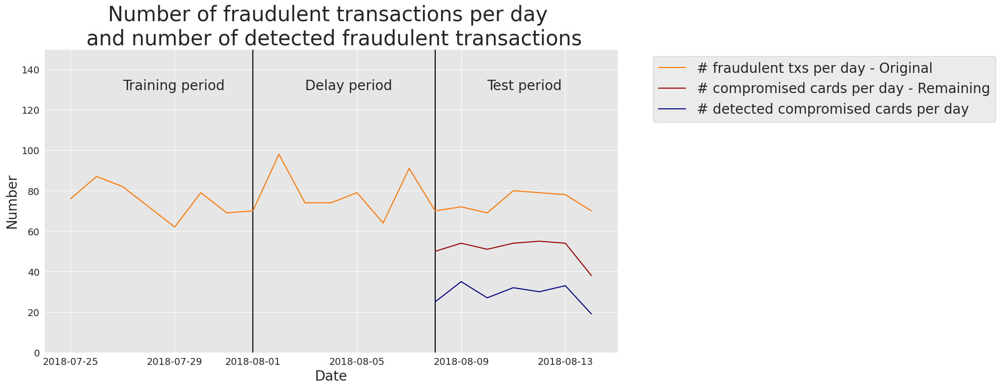

In [ ]:
fraud_and_transactions_stats_fig

In [ ]:
def card_precision_top_k(predictions_df, top_k, remove_detected_compromised_cards=True):

    # Sort days by increasing order
    list_days=list(predictions_df['TX_TIME_DAYS'].unique())
    list_days.sort()

    # At first, the list of detected compromised cards is empty
    list_detected_compromised_cards = []

    card_precision_top_k_per_day_list = []
    nb_compromised_cards_per_day = []

    # For each day, compute precision top k
    for day in list_days:

        df_day = predictions_df[predictions_df['TX_TIME_DAYS']==day]
        df_day = df_day[['predictions', 'CUSTOMER_ID', 'TX_FRAUD']]

        # Let us remove detected compromised cards from the set of daily transactions
        df_day = df_day[df_day.CUSTOMER_ID.isin(list_detected_compromised_cards)==False]

        nb_compromised_cards_per_day.append(len(df_day[df_day.TX_FRAUD==1].CUSTOMER_ID.unique()))

        detected_compromised_cards, card_precision_top_k = card_precision_top_k_day(df_day,top_k)

        card_precision_top_k_per_day_list.append(card_precision_top_k)

        # Let us update the list of detected compromised cards
        if remove_detected_compromised_cards:
            list_detected_compromised_cards.extend(detected_compromised_cards)

    # Compute the mean
    mean_card_precision_top_k = np.array(card_precision_top_k_per_day_list).mean()

    # Returns precision top k per day as a list, and resulting mean
    return nb_compromised_cards_per_day,card_precision_top_k_per_day_list,mean_card_precision_top_k

In [ ]:
nb_compromised_cards_per_day_remaining\
,card_precision_top_k_per_day_list\
,mean_card_precision_top_k=card_precision_top_k(predictions_df=predictions_df, top_k=100)

print("Number of remaining compromised cards: "+str(nb_compromised_cards_per_day_remaining))
print("Precision top-k: "+str(card_precision_top_k_per_day_list))
print("Average Precision top-k: "+str(mean_card_precision_top_k))

Number of remaining compromised cards: [50, 50, 49, 47, 46, 44, 31]
Precision top-k: [0.25, 0.32, 0.26, 0.25, 0.23, 0.26, 0.12]
Average Precision top-k: 0.2414285714285714


In [ ]:
# Compute the number of transactions per day,
#fraudulent transactions per day and fraudulent cards per day
tx_stats=get_tx_stats(transactions_df, start_date_df="2018-04-01")

# Add the remaining number of compromised cards for the last 7 days (test period)
tx_stats.loc[14:20,'nb_compromised_cards_per_day_remaining']=list(nb_compromised_cards_per_day_remaining)

# Add the card precision top k for the last 7 days (test period)
tx_stats.loc[14:20,'card_precision_top_k_per_day']=card_precision_top_k_per_day_list

In [ ]:
%%capture

# Plot the number of transactions per day, fraudulent transactions per day and fraudulent cards per day

cmap = plt.get_cmap('jet')
colors={'card_precision_top_k_per_day':cmap(0),
        'nb_compromised_cards_per_day':cmap(200),
        'nb_compromised_cards_per_day_remaining':cmap(250),
       }

fraud_and_transactions_stats_fig, ax = plt.subplots(1, 1, figsize=(15,8))

# Training period
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train = delta_delay = delta_test = 7

end_date_training = start_date_training+datetime.timedelta(days=delta_train-1)

# Test period
start_date_test = start_date_training+datetime.timedelta(days=delta_train+delta_delay)
end_date_test = start_date_training+datetime.timedelta(days=delta_train+delta_delay+delta_test-1)

get_template_tx_stats(ax, fs=20,
                      start_date_training=start_date_training,
                      title='Number of fraudulent transactions per day \n and number of detected fraudulent transactions',
                      delta_train=delta_train,
                      delta_delay=delta_delay,
                      delta_test=delta_test,
                      ylim=150
                     )

ax.plot(tx_stats['tx_date'], tx_stats['nb_compromised_cards_per_day'], 'b', color=colors['nb_compromised_cards_per_day'], label = '# compromised cards per day - Original')
ax.plot(tx_stats['tx_date'], tx_stats['nb_compromised_cards_per_day_remaining'], 'b', color=colors['nb_compromised_cards_per_day_remaining'], label = '# compromised cards per day - Remaining')
ax.plot(tx_stats['tx_date'], tx_stats['card_precision_top_k_per_day']*100, 'b', color=colors['card_precision_top_k_per_day'], label = '# detected compromised compromised cards per day')

ax.legend(loc = 'upper left',bbox_to_anchor=(1.05, 1),fontsize=20)

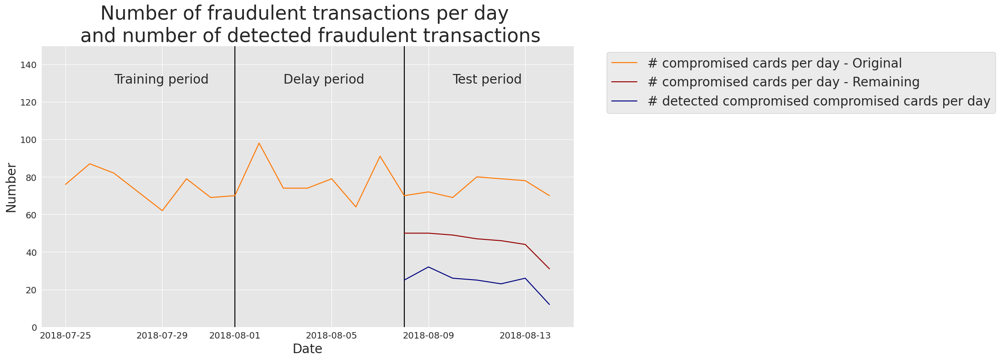

In [ ]:
fraud_and_transactions_stats_fig

# <font color = "FF6666">6. Validation strategies</font>

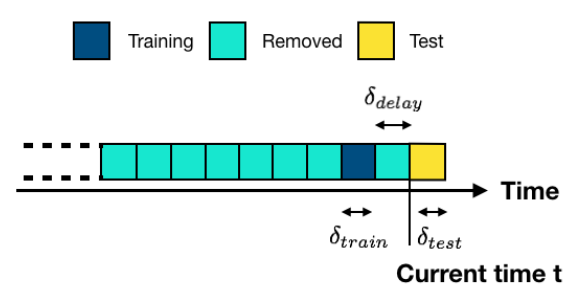

In [ ]:
output_feature="TX_FRAUD"

input_features=['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']

In [ ]:
# Set the starting day for the training period, and the deltas
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train=7
delta_delay=7
delta_test=7

In [ ]:
def get_performances_train_test_sets(transactions_df, classifier,
                                     input_features, output_feature,
                                     start_date_training,
                                     delta_train=7, delta_delay=7, delta_test=7,
                                     top_k_list=[100],
                                     type_test="Test", parameter_summary=""):

    # Get the training and test sets
    (train_df, test_df)=get_train_test_set(transactions_df,start_date_training,
                                           delta_train=delta_train,
                                           delta_delay=delta_delay,
                                           delta_test=delta_test)

    # Fit model
    start_time=time.time()
    model_and_predictions_dictionary = fit_model_and_get_predictions(classifier, train_df, test_df,
                                                                     input_features, output_feature)
    execution_time=time.time()-start_time

    # Compute fraud detection performances
    test_df['predictions']=model_and_predictions_dictionary['predictions_test']
    performances_df_test=performance_assessment(test_df, top_k_list=top_k_list)
    performances_df_test.columns=performances_df_test.columns.values+' '+type_test

    train_df['predictions']=model_and_predictions_dictionary['predictions_train']
    performances_df_train=performance_assessment(train_df, top_k_list=top_k_list)
    performances_df_train.columns=performances_df_train.columns.values+' Train'

    performances_df=pd.concat([performances_df_test,performances_df_train],axis=1)

    performances_df['Execution time']=execution_time
    performances_df['Parameters summary']=parameter_summary

    return performances_df

In [ ]:
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=2, random_state=0)

performances_df=get_performances_train_test_sets(transactions_df, classifier,
                                                 input_features, output_feature,
                                                 start_date_training=start_date_training,
                                                 delta_train=delta_train,
                                                 delta_delay=delta_delay,
                                                 delta_test=delta_test,
                                                 parameter_summary=2
                                                )

In [ ]:
performances_df

,AUC ROC Test,Average precision Test,Card Precision@100 Test,AUC ROC Train,Average precision Train,Card Precision@100 Train,Execution time,Parameters summary
0,0.763,0.496,0.241,0.802,0.586,0.393,0.211413,2


In [ ]:
list_params = [2,3,4,5,6,7,8,9,10,20,50]

performances_df=pd.DataFrame()

for max_depth in list_params:

    classifier = sklearn.tree.DecisionTreeClassifier(max_depth = max_depth, random_state=0)

    performances_df=pd.concat([performances_df,
                               get_performances_train_test_sets(transactions_df, classifier,
                                         input_features, output_feature,
                                         start_date_training=start_date_training,
                                         delta_train=delta_train,
                                         delta_delay=delta_delay,
                                         delta_test=delta_test,
                                         parameter_summary=max_depth)
    ], ignore_index=True)

performances_df.reset_index(inplace=True,drop=True)

In [ ]:
performances_df

,AUC ROC Test,Average precision Test,Card Precision@100 Test,AUC ROC Train,Average precision Train,Card Precision@100 Train,Execution time,Parameters summary
0,0.763,0.496,0.241,0.802,0.586,0.393,0.218813,2
1,0.795,0.562,0.267,0.815,0.615,0.409,0.271277,3
2,0.802,0.570,0.270,0.829,0.635,0.411,0.335094,4
3,0.814,0.581,0.280,0.835,0.649,0.419,0.407108,5
4,0.817,0.588,0.280,0.842,0.662,0.420,0.492589,6
5,0.793,0.542,0.257,0.876,0.679,0.426,0.546365,7
6,0.786,0.546,0.257,0.884,0.717,0.434,0.652560,8
7,0.756,0.499,0.246,0.896,0.737,0.440,0.954388,9
8,0.750,0.484,0.243,0.901,0.756,0.440,1.040300,10
9,0.739,0.392,0.243,0.974,0.907,0.507,1.974532,20


In [ ]:
# Get the performance plot for a single performance metric
def get_performance_plot(performances_df,
                         ax,
                         performance_metric,
                         expe_type_list=['Test','Train'],
                         expe_type_color_list=['#008000','#2F4D7E'],
                         parameter_name="Tree maximum depth",
                         summary_performances=None):

    # expe_type_list is the list of type of experiments, typically containing 'Test', 'Train', or 'Valid'
    # For all types of experiments
    for i in range(len(expe_type_list)):

        # Column in performances_df for which to retrieve the data
        performance_metric_expe_type=performance_metric+' '+expe_type_list[i]

        # Plot data on graph
        ax.plot(performances_df['Parameters summary'], performances_df[performance_metric_expe_type],
                color=expe_type_color_list[i], label = expe_type_list[i])

        # If performances_df contains confidence intervals, add them to the graph
        if performance_metric_expe_type+' Std' in performances_df.columns:

            conf_min = performances_df[performance_metric_expe_type]\
                        -2*performances_df[performance_metric_expe_type+' Std']
            conf_max = performances_df[performance_metric_expe_type]\
                        +2*performances_df[performance_metric_expe_type+' Std']

            ax.fill_between(performances_df['Parameters summary'], conf_min, conf_max, color=expe_type_color_list[i], alpha=.1)

    # If summary_performances table is present, adds vertical dashed bar for best estimated parameter
    if summary_performances is not None:
        best_estimated_parameter=summary_performances[performance_metric][['Best estimated parameters ($k^*$)']].values[0]
        best_estimated_performance=float(summary_performances[performance_metric][['Validation performance']].values[0].split("+/-")[0])
        ymin, ymax = ax.get_ylim()
        ax.vlines(best_estimated_parameter, ymin, best_estimated_performance,
                  linestyles="dashed")

    # Set title, and x and y axes labels
    ax.set_title(performance_metric+'\n', fontsize=14)
    ax.set(xlabel = parameter_name, ylabel=performance_metric)

# Get the performance plots for a set of performance metric
def get_performances_plots(performances_df,
                           performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                           expe_type_list=['Test','Train'], expe_type_color_list=['#008000','#2F4D7E'],
                           parameter_name="Tree maximum depth",
                           summary_performances=None):

    # Create as many graphs as there are performance metrics to display
    n_performance_metrics = len(performance_metrics_list)
    fig, ax = plt.subplots(1, n_performance_metrics, figsize=(5*n_performance_metrics,4))

    # Plot performance metric for each metric in performance_metrics_list
    for i in range(n_performance_metrics):

        get_performance_plot(performances_df, ax[i], performance_metric=performance_metrics_list[i],
                             expe_type_list=expe_type_list,
                             expe_type_color_list=expe_type_color_list,
                             parameter_name=parameter_name,
                             summary_performances=summary_performances)

    ax[n_performance_metrics-1].legend(loc='upper left',
                                       labels=expe_type_list,
                                       bbox_to_anchor=(1.05, 1),
                                       title="Type set")

    plt.subplots_adjust(wspace=0.5,
                        hspace=0.8)

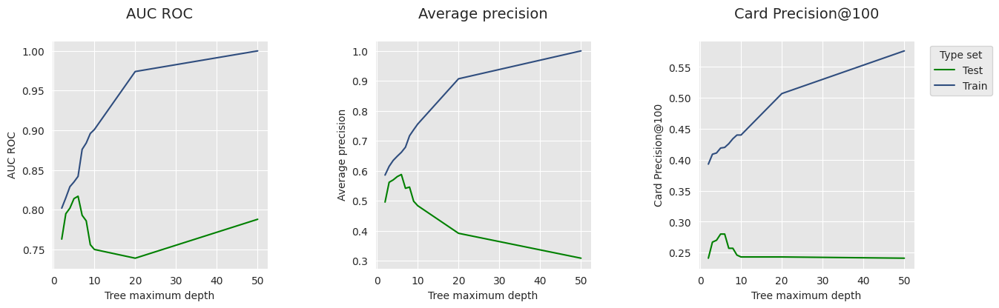

In [ ]:
get_performances_plots(performances_df,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Train'],expe_type_color_list=['#008000','#2F4D7E'])

### <font color = "green">6.1 Hold-out validation</font>



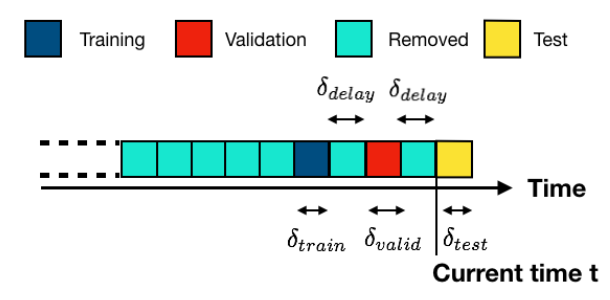

In [ ]:
DIR_INPUT='2_Fraud-detection-handbook_simulated-data-transformed/data/'

BEGIN_DATE = "2018-06-11"
END_DATE = "2018-09-14"

print("Load  files")
%time transactions_df=read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))

output_feature="TX_FRAUD"

input_features=['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']

Load  files
CPU times: user 455 ms, sys: 252 ms, total: 707 ms
Wall time: 1.35 s
919767 transactions loaded, containing 8195 fraudulent transactions


In [ ]:
# Set the starting day for the training period, and the deltas
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train=7
delta_delay=7
delta_test=7

In [ ]:
classifier = sklearn.tree.DecisionTreeClassifier(max_depth = 2, random_state=0)

delta_valid = delta_test

start_date_training_with_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))

performances_df_validation=get_performances_train_test_sets(transactions_df, classifier,
                                                            input_features, output_feature,
                                                            start_date_training=start_date_training_with_valid,
                                                            delta_train=delta_train,
                                                            delta_delay=delta_delay,
                                                            delta_test=delta_test,
                                                            type_test='Validation', parameter_summary='2')

In [ ]:
performances_df_validation

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train,Execution time,Parameters summary
0,0.775,0.524,0.244,0.791,0.577,0.4,0.215265,2


In [ ]:
performances_df[:1]

,AUC ROC Test,Average precision Test,Card Precision@100 Test,AUC ROC Train,Average precision Train,Card Precision@100 Train,Execution time,Parameters summary
0,0.763,0.496,0.241,0.802,0.586,0.393,0.218813,2


In [ ]:
list_params = [2,3,4,5,6,7,8,9,10,20,50]

performances_df_validation=pd.DataFrame()

for max_depth in list_params:

    classifier = sklearn.tree.DecisionTreeClassifier(max_depth = max_depth, random_state=0)

    performances_df_validation=pd.concat([performances_df_validation,
                                          get_performances_train_test_sets(transactions_df, classifier,
                                                                           input_features, output_feature,
                                                                           start_date_training=start_date_training_with_valid,
                                                                           delta_train=delta_train,
                                                                           delta_delay=delta_delay,
                                                                           delta_test=delta_test,
                                                                           type_test='Validation', parameter_summary=max_depth)
    ])

performances_df_validation.reset_index(inplace=True,drop=True)

In [ ]:
performances_df_validation

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train,Execution time,Parameters summary,AUC ROC Test,Average precision Test,Card Precision@100 Test
0,0.775,0.524,0.244,0.791,0.577,0.400,0.201997,2,0.763,0.496,0.241
1,0.778,0.538,0.247,0.803,0.604,0.411,0.283811,3,0.795,0.562,0.267
2,0.784,0.535,0.249,0.815,0.624,0.420,0.346960,4,0.802,0.570,0.270
3,0.791,0.533,0.257,0.824,0.642,0.430,0.416362,5,0.814,0.581,0.280
4,0.798,0.532,0.257,0.835,0.659,0.430,0.479315,6,0.817,0.588,0.280
5,0.804,0.537,0.256,0.848,0.671,0.437,0.561059,7,0.793,0.542,0.257
6,0.796,0.524,0.254,0.850,0.691,0.440,0.618828,8,0.786,0.546,0.257
7,0.781,0.473,0.249,0.852,0.699,0.440,0.685954,9,0.756,0.499,0.246
8,0.802,0.466,0.249,0.879,0.706,0.437,0.746797,10,0.750,0.484,0.243
9,0.775,0.445,0.260,0.967,0.849,0.484,1.952680,20,0.739,0.392,0.243


In [ ]:
performances_df_validation['AUC ROC Test']=performances_df['AUC ROC Test']
performances_df_validation['Average precision Test']=performances_df['Average precision Test']
performances_df_validation['Card Precision@100 Test']=performances_df['Card Precision@100 Test']

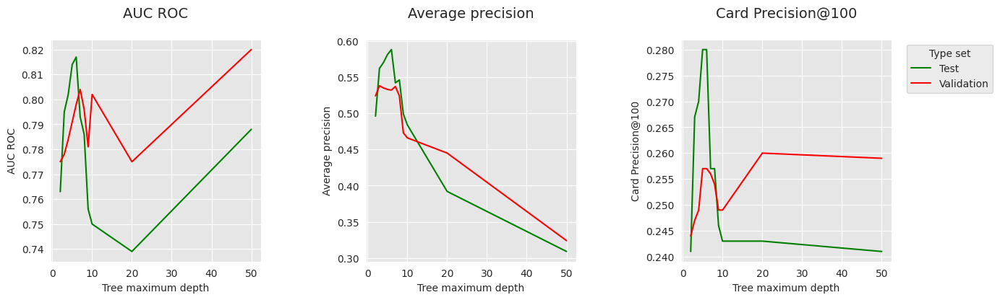

In [ ]:
get_performances_plots(performances_df_validation,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'],expe_type_color_list=['#008000','#FF0000'])

### <font color = "green">6.2 Repeated hold-out validation</font>



In [ ]:
def repeated_holdout_validation(transactions_df, classifier,
                                start_date_training,
                                delta_train=7, delta_delay=7, delta_test=7,
                                n_folds=4,
                                sampling_ratio=0.7,
                                top_k_list=[100],
                                type_test="Test", parameter_summary=""):

    performances_df_folds=pd.DataFrame()

    start_time=time.time()

    for fold in range(n_folds):

        # Get the training and test sets
        (train_df, test_df)=get_train_test_set(transactions_df,
                                               start_date_training,
                                               delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_test,
                                               sampling_ratio=sampling_ratio,
                                               random_state=fold)


        # Fit model
        model_and_predictions_dictionary = fit_model_and_get_predictions(classifier, train_df, test_df,
                                                                         input_features, output_feature)

        # Compute fraud detection performances
        test_df['predictions']=model_and_predictions_dictionary['predictions_test']
        performances_df_test=performance_assessment(test_df, top_k_list=top_k_list)
        performances_df_test.columns=performances_df_test.columns.values+' '+type_test

        train_df['predictions']=model_and_predictions_dictionary['predictions_train']
        performances_df_train=performance_assessment(train_df, top_k_list=top_k_list)
        performances_df_train.columns=performances_df_train.columns.values+' Train'

        performances_df_folds=pd.concat([performances_df_folds,
                                          pd.concat([performances_df_test, performances_df_train], axis=1)],
                                        ignore_index=True)

    execution_time=time.time()-start_time

    performances_df_folds_mean=performances_df_folds.mean()
    performances_df_folds_std=performances_df_folds.std(ddof=0)

    performances_df_folds_mean=pd.DataFrame(performances_df_folds_mean).transpose()
    performances_df_folds_std=pd.DataFrame(performances_df_folds_std).transpose()
    performances_df_folds_std.columns=performances_df_folds_std.columns.values+" Std"
    performances_df=pd.concat([performances_df_folds_mean,performances_df_folds_std],axis=1)

    performances_df['Execution time']=execution_time

    performances_df['Parameters summary']=parameter_summary

    return performances_df, performances_df_folds

In [ ]:
classifier = sklearn.tree.DecisionTreeClassifier(max_depth = 2, random_state=0)

performances_df_repeated_holdout_summary, \
performances_df_repeated_holdout_folds=repeated_holdout_validation(
    transactions_df, classifier,
    start_date_training=start_date_training_with_valid,
    delta_train=delta_train,
    delta_delay=delta_delay,
    delta_test=delta_test,
    n_folds=4,
    sampling_ratio=0.7,
    type_test="Validation", parameter_summary='2'
)

In [ ]:
performances_df_repeated_holdout_summary

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train,AUC ROC Validation Std,Average precision Validation Std,Card Precision@100 Validation Std,AUC ROC Train Std,Average precision Train Std,Card Precision@100 Train Std,Execution time,Parameters summary
0,0.776,0.51875,0.24525,0.79475,0.57575,0.29975,0.001225,0.006495,0.001299,0.003961,0.008871,0.010059,1.474381,2


In [ ]:
performances_df_repeated_holdout_folds

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train
0,0.778,0.514,0.247,0.797,0.569,0.313
1,0.776,0.511,0.246,0.798,0.572,0.306
2,0.775,0.523,0.244,0.788,0.571,0.290
3,0.775,0.527,0.244,0.796,0.591,0.290


In [ ]:
list_params = [2,3,4,5,6,7,8,9,10,20,50]

performances_df_repeated_holdout=pd.DataFrame()

start_time=time.time()

for max_depth in list_params:

    print("Computing performances for a decision tree with max_depth="+str(max_depth))

    classifier = sklearn.tree.DecisionTreeClassifier(max_depth = max_depth, random_state=0)

    performances_df_repeated_holdout=pd.concat([performances_df_repeated_holdout,
                                                repeated_holdout_validation(transactions_df, classifier,
                                                                            start_date_training=start_date_training_with_valid,
                                                                            delta_train=delta_train,
                                                                            delta_delay=delta_delay,
                                                                            delta_test=delta_test,
                                                                            n_folds=4,
                                                                            sampling_ratio=0.7,
                                                                            type_test="Validation", parameter_summary=max_depth
                                                                            )[0]
                                                ],
                                               ignore_index=True)

performances_df_repeated_holdout.reset_index(inplace=True,drop=True)

print("Total execution time: "+str(round(time.time()-start_time,2))+"s")

Computing performances for a decision tree with max_depth=2
Computing performances for a decision tree with max_depth=3
Computing performances for a decision tree with max_depth=4
Computing performances for a decision tree with max_depth=5
Computing performances for a decision tree with max_depth=6
Computing performances for a decision tree with max_depth=7
Computing performances for a decision tree with max_depth=8
Computing performances for a decision tree with max_depth=9
Computing performances for a decision tree with max_depth=10
Computing performances for a decision tree with max_depth=20
Computing performances for a decision tree with max_depth=50
Total execution time: 35.92s


In [ ]:
performances_df_repeated_holdout

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train,AUC ROC Validation Std,Average precision Validation Std,Card Precision@100 Validation Std,AUC ROC Train Std,Average precision Train Std,Card Precision@100 Train Std,Execution time,Parameters summary
0,0.77600,0.51875,0.24525,0.79475,0.57575,0.29975,0.001225,0.006495,0.001299,0.003961,0.008871,0.010059,1.699693,2
1,0.78200,0.53800,0.24875,0.80650,0.60525,0.30675,0.002449,0.003937,0.001090,0.002958,0.003832,0.007189,2.225267,3
2,0.78550,0.54100,0.25150,0.81425,0.62325,0.31125,0.006185,0.007649,0.005590,0.004969,0.006220,0.007496,2.234424,4
3,0.78200,0.52900,0.24925,0.82025,0.63625,0.31200,0.008515,0.014036,0.004815,0.007529,0.009575,0.008803,1.901784,5
4,0.78350,0.51725,0.25100,0.82875,0.64800,0.31750,0.007018,0.006300,0.005244,0.007395,0.008062,0.007159,2.142465,6
5,0.78450,0.51725,0.25125,0.83825,0.66375,0.32250,0.005025,0.015833,0.003491,0.002773,0.010779,0.005679,2.317559,7
6,0.78700,0.51150,0.25175,0.84625,0.67950,0.32450,0.009274,0.020267,0.002773,0.002861,0.003905,0.007089,3.491348,8
7,0.78400,0.50150,0.24900,0.85625,0.69000,0.32575,0.010700,0.024005,0.002449,0.011584,0.005244,0.005166,4.233886,9
8,0.79675,0.49800,0.24950,0.87400,0.70425,0.33000,0.015352,0.024321,0.003354,0.009192,0.007562,0.009925,3.037088,10
9,0.80125,0.45425,0.26325,0.97150,0.86500,0.37050,0.014289,0.030938,0.004493,0.008789,0.016837,0.011011,4.666688,20


In [ ]:
performances_df

,AUC ROC Test,Average precision Test,Card Precision@100 Test,AUC ROC Train,Average precision Train,Card Precision@100 Train,Execution time,Parameters summary
0,0.763,0.496,0.241,0.802,0.586,0.393,0.218813,2
1,0.795,0.562,0.267,0.815,0.615,0.409,0.271277,3
2,0.802,0.570,0.270,0.829,0.635,0.411,0.335094,4
3,0.814,0.581,0.280,0.835,0.649,0.419,0.407108,5
4,0.817,0.588,0.280,0.842,0.662,0.420,0.492589,6
5,0.793,0.542,0.257,0.876,0.679,0.426,0.546365,7
6,0.786,0.546,0.257,0.884,0.717,0.434,0.652560,8
7,0.756,0.499,0.246,0.896,0.737,0.440,0.954388,9
8,0.750,0.484,0.243,0.901,0.756,0.440,1.040300,10
9,0.739,0.392,0.243,0.974,0.907,0.507,1.974532,20


In [ ]:
performances_df_repeated_holdout['AUC ROC Test']=performances_df['AUC ROC Test']
performances_df_repeated_holdout['Average precision Test']=performances_df['Average precision Test']
performances_df_repeated_holdout['Card Precision@100 Test']=performances_df['Card Precision@100 Test']

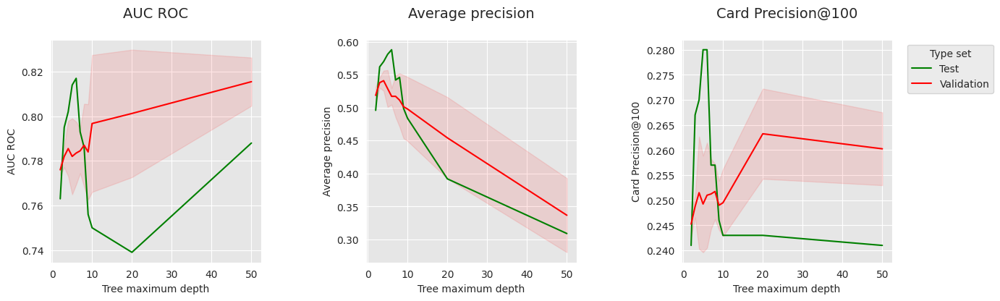

In [ ]:
get_performances_plots(
    performances_df_repeated_holdout,
    performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
    expe_type_list=['Test','Validation'],expe_type_color_list=['#008000','#FF0000']
)

### <font color = "green">6.3 Prequential validation</font>



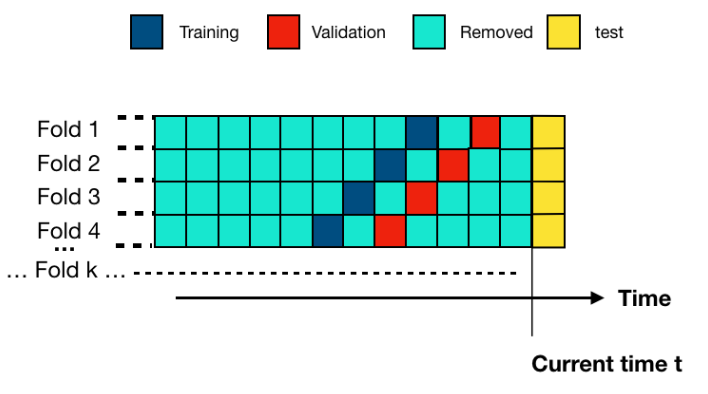

In [ ]:
def prequential_validation(transactions_df, classifier,
                           start_date_training,
                           delta_train=7,
                           delta_delay=7,
                           delta_assessment=7,
                           n_folds=4,
                           top_k_list=[100],
                           type_test="Test", parameter_summary=""):

    performances_df_folds=pd.DataFrame()

    start_time=time.time()

    for fold in range(n_folds):

        start_date_training_fold=start_date_training-datetime.timedelta(days=fold*delta_assessment)

        # Get the training and test sets
        (train_df, test_df)=get_train_test_set(transactions_df,
                                               start_date_training=start_date_training_fold,
                                               delta_train=delta_train,
                                               delta_delay=delta_delay,
                                               delta_test=delta_assessment)

        # Fit model
        model_and_predictions_dictionary = fit_model_and_get_predictions(classifier, train_df, test_df,
                                                                     input_features, output_feature)

        # Compute fraud detection performances
        test_df['predictions']=model_and_predictions_dictionary['predictions_test']
        performances_df_test=performance_assessment(test_df, top_k_list=top_k_list, rounded=False)
        performances_df_test.columns=performances_df_test.columns.values+' '+type_test

        train_df['predictions']=model_and_predictions_dictionary['predictions_train']
        performances_df_train=performance_assessment(train_df, top_k_list=top_k_list, rounded=False)
        performances_df_train.columns=performances_df_train.columns.values+' Train'

        performances_df_folds=pd.concat([performances_df_folds,
                                         pd.concat([performances_df_test,performances_df_train],axis=1)],
                                        ignore_index=True)

    execution_time=time.time()-start_time

    performances_df_folds_mean=performances_df_folds.mean()
    performances_df_folds_std=performances_df_folds.std(ddof=0)

    performances_df_folds_mean=pd.DataFrame(performances_df_folds_mean).transpose()
    performances_df_folds_std=pd.DataFrame(performances_df_folds_std).transpose()
    performances_df_folds_std.columns=performances_df_folds_std.columns.values+" Std"
    performances_df=pd.concat([performances_df_folds_mean,performances_df_folds_std],axis=1)

    performances_df['Execution time']=execution_time

    performances_df['Parameters summary']=parameter_summary

    return performances_df, performances_df_folds

In [ ]:
classifier = sklearn.tree.DecisionTreeClassifier(max_depth = 2, random_state=0)

performances_df_prequential_summary, performances_df_prequential_folds=prequential_validation(
    transactions_df, classifier,
    start_date_training=start_date_training_with_valid,
    delta_train=delta_train,
    delta_delay=delta_delay,
    delta_assessment=delta_valid,
    n_folds=4,
    type_test="Validation", parameter_summary='2'
)

In [ ]:
performances_df_prequential_summary

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train,AUC ROC Validation Std,Average precision Validation Std,Card Precision@100 Validation Std,AUC ROC Train Std,Average precision Train Std,Card Precision@100 Train Std,Execution time,Parameters summary
0,0.790786,0.549767,0.256071,0.804231,0.593561,0.402143,0.012035,0.022134,0.013147,0.013359,0.018224,0.037911,2.386061,2


In [ ]:
performances_df_prequential_folds

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train
0,0.775012,0.523548,0.244286,0.791004,0.576732,0.400000
1,0.808739,0.584663,0.242857,0.791234,0.576985,0.350000
2,0.791405,0.542531,0.262857,0.813726,0.599954,0.401429
3,0.787988,0.548326,0.274286,0.820960,0.620572,0.457143


In [ ]:
list_params = [2,3,4,5,6,7,8,9,10,20,50]

start_time=time.time()

performances_df_prequential=pd.DataFrame()

for max_depth in list_params:

    print("Computing performances for a decision tree with max_depth="+str(max_depth))

    classifier = sklearn.tree.DecisionTreeClassifier(max_depth = max_depth, random_state=0)

    performances_df_prequential=pd.concat([performances_df_prequential,
                                           prequential_validation(transactions_df, classifier,
                                                                  start_date_training=start_date_training_with_valid,
                                                                  delta_train=delta_train,
                                                                  delta_delay=delta_delay,
                                                                  delta_assessment=delta_test,
                                                                  n_folds=4,
                                                                  type_test="Validation", parameter_summary=max_depth)[0]],
                                          ignore_index=True)

performances_df_prequential.reset_index(inplace=True,drop=True)

print("Total execution time: "+str(round(time.time()-start_time,2))+"s")

Computing performances for a decision tree with max_depth=2
Computing performances for a decision tree with max_depth=3
Computing performances for a decision tree with max_depth=4
Computing performances for a decision tree with max_depth=5
Computing performances for a decision tree with max_depth=6
Computing performances for a decision tree with max_depth=7
Computing performances for a decision tree with max_depth=8
Computing performances for a decision tree with max_depth=9
Computing performances for a decision tree with max_depth=10
Computing performances for a decision tree with max_depth=20
Computing performances for a decision tree with max_depth=50
Total execution time: 46.19s


In [ ]:
performances_df_prequential

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train,AUC ROC Validation Std,Average precision Validation Std,Card Precision@100 Validation Std,AUC ROC Train Std,Average precision Train Std,Card Precision@100 Train Std,Execution time,Parameters summary
0,0.790786,0.549767,0.256071,0.804231,0.593561,0.402143,0.012035,0.022134,0.013147,0.013359,0.018224,0.037911,2.032538,2
1,0.802717,0.573414,0.266071,0.818140,0.623562,0.421786,0.017607,0.027186,0.014928,0.011437,0.016412,0.031886,2.654706,3
2,0.800690,0.554134,0.263929,0.825978,0.644766,0.426786,0.017878,0.038293,0.013753,0.009928,0.018337,0.033064,2.299153,4
3,0.804218,0.546094,0.267143,0.831289,0.657368,0.432143,0.016505,0.042197,0.013515,0.007867,0.016387,0.028935,2.425884,5
4,0.798603,0.537006,0.264643,0.839032,0.669597,0.432500,0.024225,0.037056,0.007652,0.002592,0.012448,0.028074,3.233936,6
5,0.795636,0.530609,0.263214,0.846446,0.681837,0.436786,0.023144,0.040323,0.007098,0.005559,0.008949,0.027374,3.521039,7
6,0.795142,0.516246,0.261071,0.859548,0.694885,0.442143,0.023081,0.033545,0.010564,0.008063,0.009498,0.029838,5.199998,8
7,0.785849,0.505189,0.261071,0.864869,0.717259,0.447143,0.026249,0.040393,0.009112,0.011527,0.015346,0.027124,3.692507,9
8,0.786784,0.493543,0.257143,0.887622,0.727672,0.449286,0.031165,0.048307,0.010252,0.011532,0.018154,0.029632,4.522850,10
9,0.780408,0.450980,0.264286,0.964275,0.862459,0.497500,0.022168,0.031413,0.008018,0.007512,0.014831,0.032125,8.634187,20


In [ ]:
performances_df_prequential['AUC ROC Test']=performances_df['AUC ROC Test']
performances_df_prequential['Average precision Test']=performances_df['Average precision Test']
performances_df_prequential['Card Precision@100 Test']=performances_df['Card Precision@100 Test']

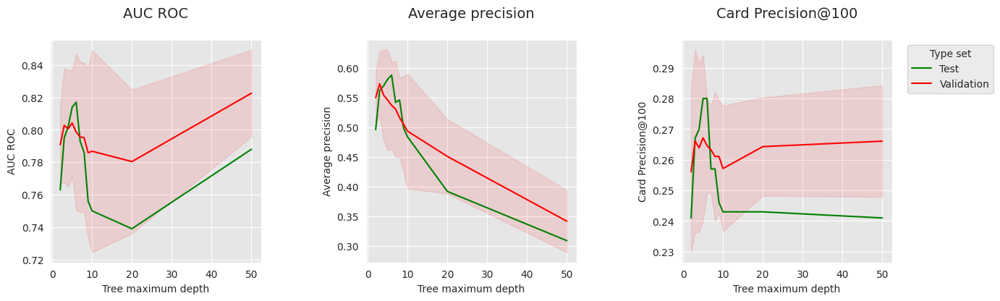

In [ ]:
get_performances_plots(performances_df_prequential,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'])

In [ ]:
list_params = [2,3,4,5,6,7,8,9,10,20,50]

start_time=time.time()

n_folds=4

performances_df_prequential_test=pd.DataFrame()

for max_depth in list_params:

    classifier = sklearn.tree.DecisionTreeClassifier(max_depth = max_depth, random_state=0)

    performances_df_prequential_test=pd.concat([performances_df_prequential_test,
                                                prequential_validation(transactions_df, classifier,
                                                                       start_date_training=start_date_training+datetime.timedelta(days=delta_test*(n_folds-1)),
                                                                       delta_train=delta_train,
                                                                       delta_delay=delta_delay,
                                                                       delta_assessment=delta_test,
                                                                       n_folds=n_folds,
                                                                       type_test="Test", parameter_summary=max_depth)[0]],
                                               ignore_index=True)

performances_df_prequential_test.reset_index(inplace=True,drop=True)

print("Total execution time: "+str(round(time.time()-start_time,2))+"s")

Total execution time: 51.2s


In [ ]:
performances_df_prequential_test

,AUC ROC Test,Average precision Test,Card Precision@100 Test,AUC ROC Train,Average precision Train,Card Precision@100 Train,AUC ROC Test Std,Average precision Test Std,Card Precision@100 Test Std,AUC ROC Train Std,Average precision Train Std,Card Precision@100 Train Std,Execution time,Parameters summary
0,0.791909,0.541761,0.264643,0.807785,0.592120,0.394286,0.017769,0.031476,0.019907,0.011559,0.017914,0.003912,3.515846,2
1,0.809012,0.578885,0.281429,0.820076,0.623315,0.410357,0.009125,0.014434,0.015940,0.007795,0.015303,0.004884,1.899555,3
2,0.812555,0.601088,0.282857,0.829963,0.645225,0.412143,0.010319,0.020216,0.014880,0.006963,0.015748,0.005579,2.174343,4
3,0.810138,0.600306,0.284286,0.835835,0.658589,0.417500,0.008586,0.016797,0.004286,0.008285,0.015249,0.008770,2.464811,5
4,0.804437,0.585132,0.281429,0.847145,0.671259,0.420000,0.007974,0.005053,0.006624,0.007900,0.016706,0.007626,2.760990,6
5,0.782710,0.554860,0.269286,0.859658,0.692724,0.427500,0.012483,0.011771,0.008950,0.013379,0.012199,0.012095,4.910725,7
6,0.774783,0.544933,0.262857,0.865567,0.708766,0.429643,0.014568,0.003392,0.006468,0.015050,0.009896,0.012632,4.091035,8
7,0.761763,0.520208,0.258214,0.877844,0.721114,0.431786,0.012098,0.012309,0.010171,0.012280,0.014920,0.013827,4.471666,9
8,0.758138,0.504909,0.258214,0.881659,0.737896,0.435714,0.011140,0.013154,0.011356,0.012795,0.012402,0.012164,8.041480,10
9,0.754024,0.439422,0.260714,0.969552,0.878847,0.491786,0.009848,0.034828,0.014052,0.010886,0.026480,0.021745,8.038118,20


In [ ]:
performances_df_prequential['AUC ROC Test']=performances_df_prequential_test['AUC ROC Test']
performances_df_prequential['Average precision Test']=performances_df_prequential_test['Average precision Test']
performances_df_prequential['Card Precision@100 Test']=performances_df_prequential_test['Card Precision@100 Test']
performances_df_prequential['AUC ROC Test Std']=performances_df_prequential_test['AUC ROC Test Std']
performances_df_prequential['Average precision Test Std']=performances_df_prequential_test['Average precision Test Std']
performances_df_prequential['Card Precision@100 Test Std']=performances_df_prequential_test['Card Precision@100 Test Std']

In [ ]:
performances_df_prequential

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train,AUC ROC Validation Std,Average precision Validation Std,Card Precision@100 Validation Std,AUC ROC Train Std,Average precision Train Std,Card Precision@100 Train Std,Execution time,Parameters summary,AUC ROC Test,Average precision Test,Card Precision@100 Test,AUC ROC Test Std,Average precision Test Std,Card Precision@100 Test Std
0,0.790786,0.549767,0.256071,0.804231,0.593561,0.402143,0.012035,0.022134,0.013147,0.013359,0.018224,0.037911,2.032538,2,0.791909,0.541761,0.264643,0.017769,0.031476,0.019907
1,0.802717,0.573414,0.266071,0.818140,0.623562,0.421786,0.017607,0.027186,0.014928,0.011437,0.016412,0.031886,2.654706,3,0.809012,0.578885,0.281429,0.009125,0.014434,0.015940
2,0.800690,0.554134,0.263929,0.825978,0.644766,0.426786,0.017878,0.038293,0.013753,0.009928,0.018337,0.033064,2.299153,4,0.812555,0.601088,0.282857,0.010319,0.020216,0.014880
3,0.804218,0.546094,0.267143,0.831289,0.657368,0.432143,0.016505,0.042197,0.013515,0.007867,0.016387,0.028935,2.425884,5,0.810138,0.600306,0.284286,0.008586,0.016797,0.004286
4,0.798603,0.537006,0.264643,0.839032,0.669597,0.432500,0.024225,0.037056,0.007652,0.002592,0.012448,0.028074,3.233936,6,0.804437,0.585132,0.281429,0.007974,0.005053,0.006624
5,0.795636,0.530609,0.263214,0.846446,0.681837,0.436786,0.023144,0.040323,0.007098,0.005559,0.008949,0.027374,3.521039,7,0.782710,0.554860,0.269286,0.012483,0.011771,0.008950
6,0.795142,0.516246,0.261071,0.859548,0.694885,0.442143,0.023081,0.033545,0.010564,0.008063,0.009498,0.029838,5.199998,8,0.774783,0.544933,0.262857,0.014568,0.003392,0.006468
7,0.785849,0.505189,0.261071,0.864869,0.717259,0.447143,0.026249,0.040393,0.009112,0.011527,0.015346,0.027124,3.692507,9,0.761763,0.520208,0.258214,0.012098,0.012309,0.010171
8,0.786784,0.493543,0.257143,0.887622,0.727672,0.449286,0.031165,0.048307,0.010252,0.011532,0.018154,0.029632,4.522850,10,0.758138,0.504909,0.258214,0.011140,0.013154,0.011356
9,0.780408,0.450980,0.264286,0.964275,0.862459,0.497500,0.022168,0.031413,0.008018,0.007512,0.014831,0.032125,8.634187,20,0.754024,0.439422,0.260714,0.009848,0.034828,0.014052


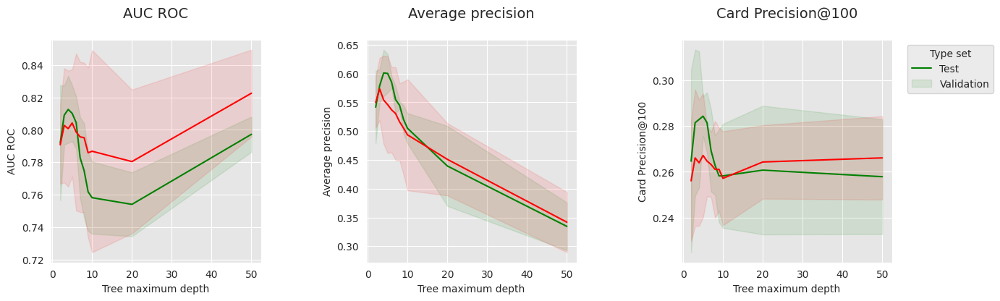

In [ ]:
get_performances_plots(performances_df_prequential,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'])

### <font color = "green">6.4 Tích hợp vào Scikit-learn</font>



In [ ]:
def prequentialSplit(transactions_df,
                     start_date_training,
                     n_folds=4,
                     delta_train=7,
                     delta_delay=7,
                     delta_assessment=7):

    prequential_split_indices=[]

    # For each fold
    for fold in range(n_folds):

        # Shift back start date for training by the fold index times the assessment period (delta_assessment)
        # (See Fig. 5)
        start_date_training_fold = start_date_training-datetime.timedelta(days=fold*delta_assessment)

        # Get the training and test (assessment) sets
        (train_df, test_df)=get_train_test_set(transactions_df,
                                               start_date_training=start_date_training_fold,
                                               delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_assessment)

        # Get the indices from the two sets, and add them to the list of prequential splits
        indices_train=list(train_df.index)
        indices_test=list(test_df.index)

        prequential_split_indices.append((indices_train,indices_test))

    return prequential_split_indices

In [ ]:
def card_precision_top_k_custom(y_true, y_pred, top_k, transactions_df):

    # Let us create a predictions_df DataFrame, that contains all transactions matching the indices of the current fold
    # (indices of the y_true vector)
    predictions_df=transactions_df.iloc[y_true.index.values].copy()
    predictions_df['predictions']=y_pred

    # Compute the CP@k using the function implemented in Chapter 4, Section 4.2
    nb_compromised_cards_per_day,card_precision_top_k_per_day_list,mean_card_precision_top_k=\
        card_precision_top_k(predictions_df, top_k)

    # Return the mean_card_precision_top_k
    return mean_card_precision_top_k

# Only keep columns that are needed as argument to the custom scoring function
# (in order to reduce the serialization time of transaction dataset)
transactions_df_scorer=transactions_df[['CUSTOMER_ID', 'TX_FRAUD','TX_TIME_DAYS']]

# Make scorer using card_precision_top_k_custom
card_precision_top_100 = sklearn.metrics.make_scorer(card_precision_top_k_custom,
                                                     response_method="predict_proba",
                                                     top_k=100,
                                                     transactions_df=transactions_df_scorer)

In [ ]:
# Estimator to use
classifier = sklearn.tree.DecisionTreeClassifier()

# Hyperparameters to test
parameters = {'clf__max_depth':[2,4], 'clf__random_state':[0]}

# Scoring functions. AUC ROC and Average Precision are readily available from sklearn
# with `auc_roc` and `average_precision`. Card Precision@100 was implemented with the make_scorer factory function.
scoring = {'roc_auc':'roc_auc',
           'average_precision': 'average_precision',
           'card_precision@100': card_precision_top_100
           }

# A pipeline is created to scale data before fitting a model
estimators = [('scaler', sklearn.preprocessing.StandardScaler()), ('clf', classifier)]
pipe = sklearn.pipeline.Pipeline(estimators)

# Indices for the prequential validation are obtained with the prequentialSplit function
prequential_split_indices = prequentialSplit(transactions_df,
                                             start_date_training_with_valid,
                                             n_folds=n_folds,
                                             delta_train=delta_train,
                                             delta_delay=delta_delay,
                                             delta_assessment=delta_valid)

# Let us instantiate the GridSearchCV
grid_search = sklearn.model_selection.GridSearchCV(pipe, param_grid=parameters, scoring=scoring, \
                                                   cv=prequential_split_indices, refit=False, n_jobs=-1,verbose=0)

# And select the input features, and output feature
X=transactions_df[input_features]
y=transactions_df[output_feature]

In [ ]:
%time grid_search.fit(X, y)

print("Finished CV fitting")

CPU times: user 127 ms, sys: 72 ms, total: 199 ms
Wall time: 2.19 s
Finished CV fitting


In [ ]:
grid_search.cv_results_

{'mean_fit_time': array([0.2202341 , 0.35023093]),
 'std_fit_time': array([0.08338458, 0.05195395]),
 'mean_score_time': array([0.09218091, 0.0595963 ]),
 'std_score_time': array([0.05790433, 0.00502216]),
 'param_clf__max_depth': masked_array(data=[2, 4],
              mask=[False, False],
        fill_value=999999),
 'param_clf__random_state': masked_array(data=[0, 0],
              mask=[False, False],
        fill_value=999999),
 'params': [{'clf__max_depth': 2, 'clf__random_state': 0},
  {'clf__max_depth': 4, 'clf__random_state': 0}],
 'split0_test_roc_auc': array([0.7750121 , 0.78393251]),
 'split1_test_roc_auc': array([0.80873906, 0.82871798]),
 'split2_test_roc_auc': array([0.79140481, 0.78643512]),
 'split3_test_roc_auc': array([0.78798838, 0.80367453]),
 'mean_test_roc_auc': array([0.79078609, 0.80069003]),
 'std_test_roc_auc': array([0.01203472, 0.01787799]),
 'rank_test_roc_auc': array([2, 1], dtype=int32),
 'split0_test_average_precision': array([0.5235482 , 0.53514015]),


In [ ]:
performances_df=pd.DataFrame()

expe_type="Validation"

performance_metrics_list_grid=['roc_auc', 'average_precision', 'card_precision@100']
performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100']


for i in range(len(performance_metrics_list_grid)):
    performances_df[performance_metrics_list[i]+' '+expe_type]=grid_search.cv_results_['mean_test_'+performance_metrics_list_grid[i]]
    performances_df[performance_metrics_list[i]+' '+expe_type+' Std']=grid_search.cv_results_['std_test_'+performance_metrics_list_grid[i]]

performances_df['Execution time']=grid_search.cv_results_['mean_fit_time']

performances_df['Parameters']=list(grid_search.cv_results_['params'])

In [ ]:
performances_df

,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Execution time,Parameters
0,0.790786,0.012035,0.549767,0.022134,0.256071,0.013147,0.220234,"{'clf__max_depth': 2, 'clf__random_state': 0}"
1,0.800690,0.017878,0.554134,0.038293,0.263929,0.013753,0.350231,"{'clf__max_depth': 4, 'clf__random_state': 0}"


In [ ]:
def prequential_grid_search(transactions_df,
                            classifier,
                            input_features, output_feature,
                            parameters, scoring,
                            start_date_training,
                            n_folds=4,
                            expe_type='Test',
                            delta_train=7,
                            delta_delay=7,
                            delta_assessment=7,
                            performance_metrics_list_grid=['roc_auc'],
                            performance_metrics_list=['AUC ROC'],
                            n_jobs=-1):

    estimators = [('scaler', sklearn.preprocessing.StandardScaler()), ('clf', classifier)]
    pipe = sklearn.pipeline.Pipeline(estimators)

    prequential_split_indices=prequentialSplit(transactions_df,
                                               start_date_training=start_date_training,
                                               n_folds=n_folds,
                                               delta_train=delta_train,
                                               delta_delay=delta_delay,
                                               delta_assessment=delta_assessment)

    grid_search = sklearn.model_selection.GridSearchCV(pipe, parameters, scoring=scoring, cv=prequential_split_indices, refit=False, n_jobs=n_jobs)

    X=transactions_df[input_features]
    y=transactions_df[output_feature]

    grid_search.fit(X, y)

    performances_df=pd.DataFrame()

    for i in range(len(performance_metrics_list_grid)):
        performances_df[performance_metrics_list[i]+' '+expe_type]=grid_search.cv_results_['mean_test_'+performance_metrics_list_grid[i]]
        performances_df[performance_metrics_list[i]+' '+expe_type+' Std']=grid_search.cv_results_['std_test_'+performance_metrics_list_grid[i]]

    performances_df['Parameters']=grid_search.cv_results_['params']
    performances_df['Execution time']=grid_search.cv_results_['mean_fit_time']

    return performances_df



In [ ]:
start_time=time.time()

classifier = sklearn.tree.DecisionTreeClassifier()

parameters = {'clf__max_depth':[2,3,4,5,6,7,8,9,10,20,50], 'clf__random_state':[0]}

scoring = {'roc_auc':'roc_auc',
           'average_precision': 'average_precision',
           'card_precision@100': card_precision_top_100,
           }

performances_df_validation=prequential_grid_search(
    transactions_df, classifier,
    input_features, output_feature,
    parameters, scoring,
    start_date_training=start_date_training_with_valid,
    n_folds=n_folds,
    expe_type='Validation',
    delta_train=delta_train,
    delta_delay=delta_delay,
    delta_assessment=delta_valid,
    performance_metrics_list_grid=performance_metrics_list_grid,
    performance_metrics_list=performance_metrics_list)

print("Validation: Total execution time: "+str(round(time.time()-start_time,2))+"s")

Validation: Total execution time: 30.68s


In [ ]:
start_time=time.time()

performances_df_test=prequential_grid_search(
    transactions_df, classifier,
    input_features, output_feature,
    parameters, scoring,
    start_date_training=start_date_training+datetime.timedelta(days=(n_folds-1)*delta_test),
    n_folds=n_folds,
    expe_type='Test',
    delta_train=delta_train,
    delta_delay=delta_delay,
    delta_assessment=delta_test,
    performance_metrics_list_grid=performance_metrics_list_grid,
    performance_metrics_list=performance_metrics_list)

print("Test: Total execution time: "+str(round(time.time()-start_time,2))+"s")

Test: Total execution time: 29.17s


In [ ]:
performances_df_validation.drop(columns=['Parameters','Execution time'], inplace=True)
performances_df=pd.concat([performances_df_test,performances_df_validation],axis=1)

In [ ]:
# Use the max_depth as the label for plotting
parameters_dict=dict(performances_df['Parameters'])
max_depth=[parameters_dict[i]['clf__max_depth'] for i in range(len(parameters_dict))]
performances_df['Parameters summary']=max_depth

In [ ]:
performances_df

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.791909,0.017769,0.541761,0.031476,0.264643,0.019907,"{'clf__max_depth': 2, 'clf__random_state': 0}",0.263380,0.790786,0.012035,0.549767,0.022134,0.256071,0.013147,2
1,0.809012,0.009125,0.578885,0.014434,0.281429,0.015940,"{'clf__max_depth': 3, 'clf__random_state': 0}",0.353980,0.802717,0.017607,0.573414,0.027186,0.266071,0.014928,3
2,0.812555,0.010319,0.601088,0.020216,0.282857,0.014880,"{'clf__max_depth': 4, 'clf__random_state': 0}",0.456137,0.800690,0.017878,0.554134,0.038293,0.263929,0.013753,4
3,0.810138,0.008586,0.600306,0.016797,0.284286,0.004286,"{'clf__max_depth': 5, 'clf__random_state': 0}",0.552944,0.804218,0.016505,0.546094,0.042197,0.267143,0.013515,5
4,0.804437,0.007974,0.585132,0.005053,0.281429,0.006624,"{'clf__max_depth': 6, 'clf__random_state': 0}",0.951670,0.798603,0.024225,0.537006,0.037056,0.264643,0.007652,6
5,0.782710,0.012483,0.554860,0.011771,0.269286,0.008950,"{'clf__max_depth': 7, 'clf__random_state': 0}",1.398623,0.795636,0.023144,0.530609,0.040323,0.263214,0.007098,7
6,0.774783,0.014568,0.544933,0.003392,0.262857,0.006468,"{'clf__max_depth': 8, 'clf__random_state': 0}",1.065646,0.795142,0.023081,0.516246,0.033545,0.261071,0.010564,8
7,0.761763,0.012098,0.520208,0.012309,0.258214,0.010171,"{'clf__max_depth': 9, 'clf__random_state': 0}",0.949610,0.785849,0.026249,0.505189,0.040393,0.261071,0.009112,9
8,0.758138,0.011140,0.504909,0.013154,0.258214,0.011356,"{'clf__max_depth': 10, 'clf__random_state': 0}",1.074349,0.786784,0.031165,0.493543,0.048307,0.257143,0.010252,10
9,0.754024,0.009848,0.439422,0.034828,0.260714,0.014052,"{'clf__max_depth': 20, 'clf__random_state': 0}",1.962264,0.780408,0.022168,0.450980,0.031413,0.264286,0.008018,20


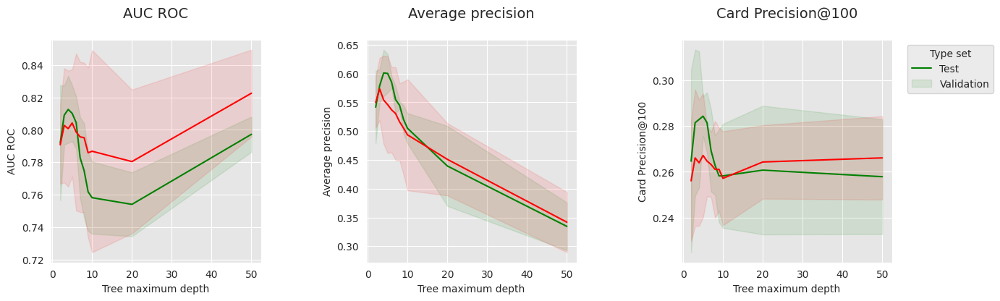

In [ ]:
get_performances_plots(performances_df,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'],expe_type_color_list=['#008000','#FF0000'])

# <font color = "FF6666">7. Model selection</font>

### <font color = "green">7.1 Model selection: Decision trees</font>



In [ ]:
# Load data from the 2018-06-11 to the 2018-09-14

DIR_INPUT = '2_Fraud-detection-handbook_simulated-data-transformed/data/'

BEGIN_DATE = "2018-06-11"
END_DATE = "2018-09-14"

print("Load  files")
%time transactions_df = read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))

output_feature = "TX_FRAUD"

input_features = ['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']

Load  files
CPU times: user 488 ms, sys: 375 ms, total: 862 ms
Wall time: 1.68 s
919767 transactions loaded, containing 8195 fraudulent transactions


In [ ]:
# Number of folds for the prequential validation
n_folds = 4

# Set the starting day for the training period, and the deltas
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train = delta_delay = delta_test = delta_valid = delta_assessment = 7

start_date_training_for_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))
start_date_training_for_test = start_date_training+datetime.timedelta(days=(n_folds-1)*delta_test)

In [ ]:
# Only keep columns that are needed as argument to the custom scoring function
# (in order to reduce the serialization time of transaction dataset)
transactions_df_scorer = transactions_df[['CUSTOMER_ID', 'TX_FRAUD','TX_TIME_DAYS']]

card_precision_top_100 = sklearn.metrics.make_scorer(card_precision_top_k_custom,
                                                     response_method="predict_proba",
                                                     top_k=100,
                                                     transactions_df=transactions_df_scorer)

performance_metrics_list_grid = ['roc_auc', 'average_precision', 'card_precision@100']
performance_metrics_list = ['AUC ROC', 'Average precision', 'Card Precision@100']

scoring = {'roc_auc':'roc_auc',
           'average_precision': 'average_precision',
           'card_precision@100': card_precision_top_100,
           }

In [ ]:
def model_selection_wrapper(transactions_df,
                            classifier,
                            input_features, output_feature,
                            parameters,
                            scoring,
                            start_date_training_for_valid,
                            start_date_training_for_test,
                            n_folds=4,
                            delta_train=7,
                            delta_delay=7,
                            delta_assessment=7,
                            performance_metrics_list_grid=['roc_auc'],
                            performance_metrics_list=['AUC ROC'],
                            n_jobs=-1):

    # Get performances on the validation set using prequential validation
    performances_df_validation=prequential_grid_search(transactions_df, classifier,
                            input_features, output_feature,
                            parameters, scoring,
                            start_date_training=start_date_training_for_valid,
                            n_folds=n_folds,
                            expe_type='Validation',
                            delta_train=delta_train,
                            delta_delay=delta_delay,
                            delta_assessment=delta_assessment,
                            performance_metrics_list_grid=performance_metrics_list_grid,
                            performance_metrics_list=performance_metrics_list,
                            n_jobs=n_jobs)

    # Get performances on the test set using prequential validation
    performances_df_test=prequential_grid_search(transactions_df, classifier,
                            input_features, output_feature,
                            parameters, scoring,
                            start_date_training=start_date_training_for_test,
                            n_folds=n_folds,
                            expe_type='Test',
                            delta_train=delta_train,
                            delta_delay=delta_delay,
                            delta_assessment=delta_assessment,
                            performance_metrics_list_grid=performance_metrics_list_grid,
                            performance_metrics_list=performance_metrics_list,
                            n_jobs=n_jobs)

    # Bind the two resulting DataFrames
    performances_df_validation.drop(columns=['Parameters','Execution time'], inplace=True)
    performances_df=pd.concat([performances_df_test,performances_df_validation],axis=1)

    # And return as a single DataFrame
    return performances_df

In [ ]:
# Define classifier
classifier = sklearn.tree.DecisionTreeClassifier()

# Set of parameters for which to assess model performances
parameters = {'clf__max_depth':[2,3,4,5,6,7,8,9,10,20,50], 'clf__random_state':[0]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper(transactions_df, classifier,
                                        input_features, output_feature,
                                        parameters, scoring,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train,
                                        delta_delay=delta_delay,
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=1)

execution_time_dt = time.time()-start_time

# Select parameter of interest (max_depth)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['clf__max_depth'] for i in range(len(parameters_dict))]

# Rename to performances_df_dt for model performance comparison at the end of this notebook
performances_df_dt=performances_df

In [ ]:
performances_df_dt

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.791909,0.017769,0.541761,0.031476,0.264643,0.019907,"{'clf__max_depth': 2, 'clf__random_state': 0}",0.174905,0.790786,0.012035,0.549767,0.022134,0.256071,0.013147,2
1,0.809012,0.009125,0.578885,0.014434,0.281429,0.015940,"{'clf__max_depth': 3, 'clf__random_state': 0}",0.269762,0.802717,0.017607,0.573414,0.027186,0.266071,0.014928,3
2,0.812555,0.010319,0.601088,0.020216,0.282857,0.014880,"{'clf__max_depth': 4, 'clf__random_state': 0}",0.426511,0.800690,0.017878,0.554134,0.038293,0.263929,0.013753,4
3,0.810138,0.008586,0.600306,0.016797,0.284286,0.004286,"{'clf__max_depth': 5, 'clf__random_state': 0}",0.532678,0.804218,0.016505,0.546094,0.042197,0.267143,0.013515,5
4,0.804437,0.007974,0.585132,0.005053,0.281429,0.006624,"{'clf__max_depth': 6, 'clf__random_state': 0}",0.451023,0.798603,0.024225,0.537006,0.037056,0.264643,0.007652,6
5,0.782710,0.012483,0.554860,0.011771,0.269286,0.008950,"{'clf__max_depth': 7, 'clf__random_state': 0}",0.517918,0.795636,0.023144,0.530609,0.040323,0.263214,0.007098,7
6,0.774783,0.014568,0.544933,0.003392,0.262857,0.006468,"{'clf__max_depth': 8, 'clf__random_state': 0}",0.592721,0.795142,0.023081,0.516246,0.033545,0.261071,0.010564,8
7,0.761763,0.012098,0.520208,0.012309,0.258214,0.010171,"{'clf__max_depth': 9, 'clf__random_state': 0}",0.673661,0.785849,0.026249,0.505189,0.040393,0.261071,0.009112,9
8,0.758138,0.011140,0.504909,0.013154,0.258214,0.011356,"{'clf__max_depth': 10, 'clf__random_state': 0}",1.010628,0.786784,0.031165,0.493543,0.048307,0.257143,0.010252,10
9,0.754024,0.009848,0.439422,0.034828,0.260714,0.014052,"{'clf__max_depth': 20, 'clf__random_state': 0}",1.420922,0.780408,0.022168,0.450980,0.031413,0.264286,0.008018,20


In [ ]:
def get_summary_performances(performances_df, parameter_column_name="Parameters summary"):

    # Three performance metrics
    metrics = ['AUC ROC','Average precision','Card Precision@100']
    performances_results=pd.DataFrame(columns=metrics)

    # Reset indices in case a subset of a performane DataFrame is provided as input
    performances_df.reset_index(drop=True,inplace=True)

    # Lists of parameters/performances that will be retrieved for the best estimated parameters
    best_estimated_parameters = []
    validation_performance = []
    test_performance = []

    # For each performance metric, get the validation and test performance for the best estimated parameter
    for metric in metrics:

        # Find the index which provides the best validation performance
        index_best_validation_performance = performances_df.index[np.argmax(performances_df[metric+' Validation'].values)]

        # Retrieve the corresponding parameters
        best_estimated_parameters.append(performances_df[parameter_column_name].iloc[index_best_validation_performance])

        # Add validation performance to the validation_performance list (mean+/-std)
        validation_performance.append(
                str(round(performances_df[metric+' Validation'].iloc[index_best_validation_performance],3))+
                '+/-'+
                str(round(performances_df[metric+' Validation'+' Std'].iloc[index_best_validation_performance],2))
        )

        # Add test performance to the test_performance list (mean+/-std)
        test_performance.append(
                str(round(performances_df[metric+' Test'].iloc[index_best_validation_performance],3))+
                '+/-'+
                str(round(performances_df[metric+' Test'+' Std'].iloc[index_best_validation_performance],2))
        )

    # Add results to the performances_results DataFrame
    performances_results.loc["Best estimated parameters"]=best_estimated_parameters
    performances_results.loc["Validation performance"]=validation_performance
    performances_results.loc["Test performance"]=test_performance

    # Lists of parameters/performances that will be retrieved for the optimal parameters
    optimal_test_performance = []
    optimal_parameters = []

    # For each performance metric, get the performance for the optimal parameter
    for metric in ['AUC ROC Test','Average precision Test','Card Precision@100 Test']:

        # Find the index which provides the optimal performance
        index_optimal_test_performance = performances_df.index[np.argmax(performances_df[metric].values)]

        # Retrieve the corresponding parameters
        optimal_parameters.append(performances_df[parameter_column_name].iloc[index_optimal_test_performance])

        # Add test performance to the test_performance list (mean+/-std)
        optimal_test_performance.append(
                str(round(performances_df[metric].iloc[index_optimal_test_performance],3))+
                '+/-'+
                str(round(performances_df[metric+' Std'].iloc[index_optimal_test_performance],2))
        )

    # Add results to the performances_results DataFrame
    performances_results.loc["Optimal parameters"]=optimal_parameters
    performances_results.loc["Optimal test performance"]=optimal_test_performance

    return performances_results

In [ ]:
summary_performances_dt=get_summary_performances(performances_df_dt, parameter_column_name="Parameters summary")
summary_performances_dt.rename(
    index={
        "Best estimated parameters": "Best estimated parameters ($k^*$)",
        "Optimal parameters": "Optimal parameters ($k_{opt}$)"
    },
    inplace=True)
summary_performances_dt

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters ($k^*$),50,3,5
Validation performance,0.823+/-0.01,0.573+/-0.03,0.267+/-0.01
Test performance,0.797+/-0.01,0.579+/-0.01,0.284+/-0.0
Optimal parameters ($k_{opt}$),4,4,5
Optimal test performance,0.813+/-0.01,0.601+/-0.02,0.284+/-0.0


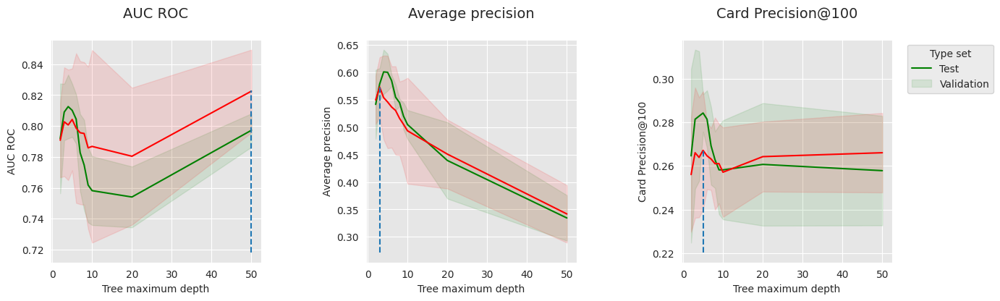

In [ ]:
get_performances_plots(performances_df_dt,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       summary_performances=summary_performances_dt)

### <font color = "green">7.2 Model selection: Exploration of other model classes</font>



### <font color = "grey">7.2.1 Logistic regression</font>



In [ ]:
classifier = sklearn.linear_model.LogisticRegression()

parameters = {'clf__C':[0.1,1,10,100], 'clf__random_state':[0]}

start_time=time.time()

performances_df=model_selection_wrapper(transactions_df, classifier,
                                        input_features, output_feature,
                                        parameters, scoring,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train,
                                        delta_delay=delta_delay,
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=1)

execution_time_lr = time.time()-start_time

parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['clf__C'] for i in range(len(parameters_dict))]

# Rename to performances_df_lr for model performance comparison at the end of this notebook
performances_df_lr=performances_df

In [ ]:
performances_df_lr

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.866900,0.014965,0.619700,0.016713,0.296786,0.007652,"{'clf__C': 0.1, 'clf__random_state': 0}",0.362675,0.865062,0.009589,0.608324,0.022946,0.278929,0.016300,0.1
1,0.867598,0.015451,0.622287,0.016762,0.297143,0.008806,"{'clf__C': 1, 'clf__random_state': 0}",0.328649,0.866696,0.009010,0.612230,0.023650,0.278571,0.016993,1.0
2,0.867652,0.015373,0.622852,0.016337,0.297143,0.008806,"{'clf__C': 10, 'clf__random_state': 0}",0.526078,0.866918,0.008907,0.612493,0.024075,0.278214,0.017854,10.0
3,0.867650,0.015371,0.622899,0.016321,0.297143,0.008806,"{'clf__C': 100, 'clf__random_state': 0}",0.642311,0.866947,0.008904,0.612478,0.024067,0.278571,0.017928,100.0


In [ ]:
summary_performances_lr=get_summary_performances(performances_df_lr, parameter_column_name="Parameters summary")
summary_performances_lr.rename(
    index={
        "Best estimated parameters": "Best estimated parameters ($k^*$)",
        "Optimal parameters": "Optimal parameters ($k_{opt}$)"
    },
    inplace=True)
summary_performances_lr

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters ($k^*$),100.0,10.0,0.1
Validation performance,0.867+/-0.01,0.612+/-0.02,0.279+/-0.02
Test performance,0.868+/-0.02,0.623+/-0.02,0.297+/-0.01
Optimal parameters ($k_{opt}$),10.0,100.0,1.0
Optimal test performance,0.868+/-0.02,0.623+/-0.02,0.297+/-0.01


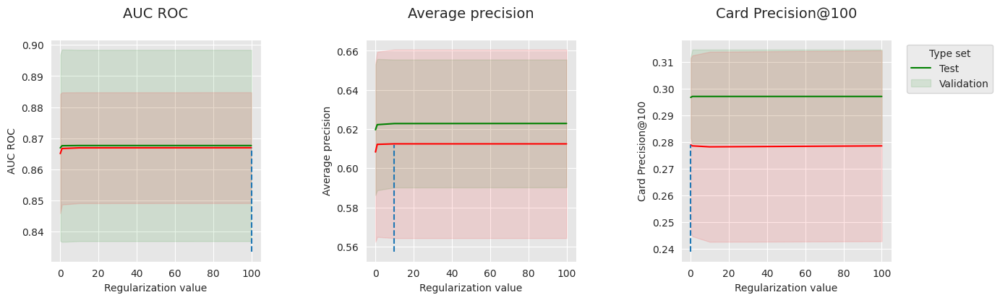

In [ ]:
get_performances_plots(performances_df_lr,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Regularization value",
                       summary_performances=summary_performances_lr)

### <font color = "grey">7.2.2 Random forest</font>



In [ ]:
classifier = sklearn.ensemble.RandomForestClassifier()

# Note: n_jobs set to one for getting true execution times
parameters = {'clf__max_depth':[5,10,20,50], 'clf__n_estimators':[25,50,100],
              'clf__random_state':[0],'clf__n_jobs':[1]}

start_time=time.time()

performances_df=model_selection_wrapper(transactions_df, classifier,
                                        input_features, output_feature,
                                        parameters, scoring,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train,
                                        delta_delay=delta_delay,
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=1)

execution_time_rf = time.time()-start_time

parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[str(parameters_dict[i]['clf__n_estimators'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__max_depth'])
                                   for i in range(len(parameters_dict))]

# Rename to performances_df_rf for model performance comparison at the end of this notebook
performances_df_rf=performances_df

In [ ]:
performances_df_rf

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.845287,0.003872,0.620712,0.022145,0.289286,0.010570,"{'clf__max_depth': 5, 'clf__n_estimators': 25,...",1.682301,0.834147,0.009100,0.610413,0.023740,0.274286,0.015551,25/5
1,0.850968,0.007508,0.620932,0.023824,0.290714,0.010996,"{'clf__max_depth': 5, 'clf__n_estimators': 50,...",3.350741,0.844140,0.007473,0.609801,0.027459,0.272857,0.015085,50/5
2,0.855230,0.007315,0.627034,0.021852,0.292500,0.010850,"{'clf__max_depth': 5, 'clf__n_estimators': 100...",6.559532,0.849065,0.011019,0.619450,0.026249,0.275000,0.016614,100/5
3,0.867271,0.006166,0.648583,0.012831,0.300714,0.010950,"{'clf__max_depth': 10, 'clf__n_estimators': 25...",3.128222,0.865000,0.002259,0.651858,0.020059,0.285357,0.012305,25/10
4,0.869225,0.007955,0.655050,0.014192,0.300000,0.012495,"{'clf__max_depth': 10, 'clf__n_estimators': 50...",6.092590,0.871323,0.004542,0.659386,0.021993,0.286786,0.015531,50/10
5,0.874949,0.011903,0.664613,0.014215,0.303214,0.013030,"{'clf__max_depth': 10, 'clf__n_estimators': 10...",11.749312,0.872388,0.005256,0.663481,0.024010,0.286429,0.017627,100/10
6,0.853581,0.014851,0.660131,0.013713,0.296429,0.012016,"{'clf__max_depth': 20, 'clf__n_estimators': 25...",4.975551,0.869824,0.005664,0.680407,0.016981,0.285357,0.014962,25/20
7,0.862653,0.016004,0.673352,0.011485,0.297143,0.013439,"{'clf__max_depth': 20, 'clf__n_estimators': 50...",10.198157,0.876311,0.006772,0.690434,0.019828,0.287143,0.016506,50/20
8,0.870378,0.016910,0.677675,0.011698,0.299286,0.013190,"{'clf__max_depth': 20, 'clf__n_estimators': 10...",19.776114,0.879728,0.006367,0.694063,0.020657,0.288571,0.016690,100/20
9,0.858527,0.008786,0.651899,0.009478,0.295357,0.010661,"{'clf__max_depth': 50, 'clf__n_estimators': 25...",5.186222,0.869956,0.003717,0.674013,0.021356,0.283214,0.015759,25/50


In [ ]:
summary_performances_rf=get_summary_performances(performances_df_rf, parameter_column_name="Parameters summary")
summary_performances_rf.rename(
    index={
        "Best estimated parameters": "Best estimated parameters ($k^*$)",
        "Optimal parameters": "Optimal parameters ($k_{opt}$)"
    },
    inplace=True)
summary_performances_rf

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters ($k^*$),100/20,100/20,100/20
Validation performance,0.88+/-0.01,0.694+/-0.02,0.289+/-0.02
Test performance,0.87+/-0.02,0.678+/-0.01,0.299+/-0.01
Optimal parameters ($k_{opt}$),100/10,100/20,100/10
Optimal test performance,0.875+/-0.01,0.678+/-0.01,0.303+/-0.01


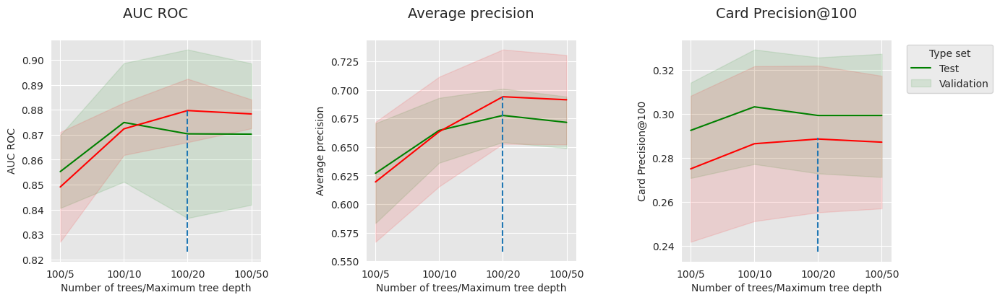

In [ ]:
performances_df_rf_fixed_number_of_trees=performances_df_rf[performances_df_rf["Parameters summary"].str.startswith("100")]

summary_performances_fixed_number_of_trees=get_summary_performances(performances_df_rf_fixed_number_of_trees, parameter_column_name="Parameters summary")

summary_performances_fixed_number_of_trees.rename(
    index={
        "Best estimated parameters": "Best estimated parameters ($k^*$)",
        "Optimal parameters": "Optimal parameters ($k_{opt}$)"
    },
    inplace=True)

get_performances_plots(performances_df_rf_fixed_number_of_trees,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Number of trees/Maximum tree depth",
                       summary_performances=summary_performances_fixed_number_of_trees)

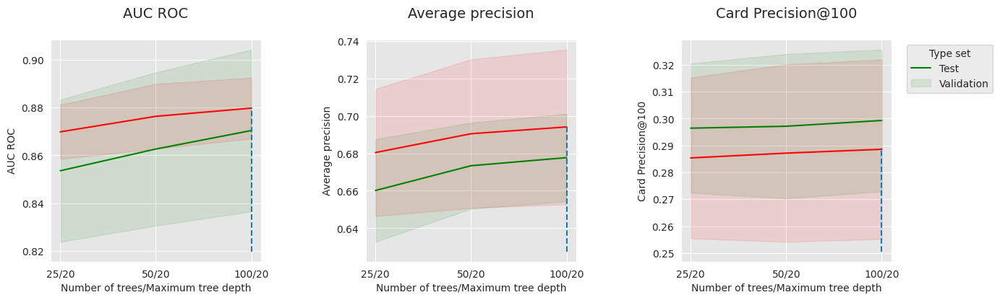

In [ ]:
performances_df_rf_fixed_max_tree_depth=performances_df_rf[performances_df_rf["Parameters summary"].str.endswith("20")]

summary_performances_fixed_max_tree_depth=get_summary_performances(performances_df_rf_fixed_max_tree_depth, parameter_column_name="Parameters summary")

summary_performances_fixed_max_tree_depth.rename(
    index={
        "Best estimated parameters": "Best estimated parameters ($k^*$)",
        "Optimal parameters": "Optimal parameters ($k_{opt}$)"
    },
    inplace=True)

get_performances_plots(performances_df_rf_fixed_max_tree_depth,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Number of trees/Maximum tree depth",
                       summary_performances=summary_performances_fixed_max_tree_depth)

In [ ]:
# Get the performance plot for a single performance metric
def get_execution_times_plot(performances_df,
                             title="",
                             parameter_name="Tree maximum depth"):

    fig, ax = plt.subplots(1,1, figsize=(5,4))

    # Plot data on graph
    ax.plot(performances_df['Parameters summary'], performances_df["Execution time"],
            color="black")

    # Set title, and x and y axes labels
    ax.set_title(title, fontsize=14)
    ax.set(xlabel = parameter_name, ylabel="Execution time (seconds)")

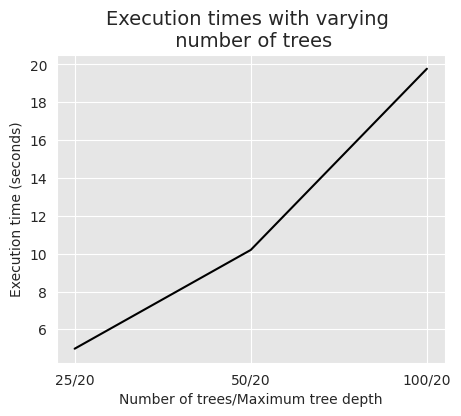

In [ ]:
get_execution_times_plot(performances_df_rf_fixed_max_tree_depth,
                         title="Execution times with varying \n number of trees",
                         parameter_name="Number of trees/Maximum tree depth")

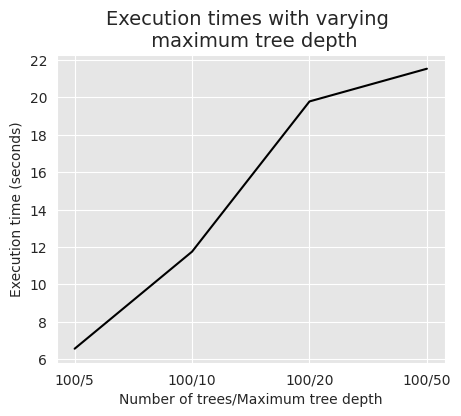

In [ ]:
get_execution_times_plot(performances_df_rf_fixed_number_of_trees,
                         title="Execution times with varying \n maximum tree depth",
                         parameter_name="Number of trees/Maximum tree depth")

In [ ]:
print("Total execution time for the model selection procedure: "+str(round(execution_time_rf,2))+"s")

Total execution time for the model selection procedure: 894.8s


### <font color = "grey">7.2.3 XGBoost</font>



In [ ]:
classifier = xgboost.XGBClassifier()

parameters = {'clf__max_depth':[3,6,9], 'clf__n_estimators':[25,50,100], 'clf__learning_rate':[0.1, 0.3],
              'clf__random_state':[0], 'clf__n_jobs':[1], 'clf__verbosity':[0]}

start_time=time.time()

performances_df=model_selection_wrapper(transactions_df, classifier,
                                        input_features, output_feature,
                                        parameters, scoring,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train,
                                        delta_delay=delta_delay,
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=1)

execution_time_boosting = time.time()-start_time

parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[str(parameters_dict[i]['clf__n_estimators'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__learning_rate'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__max_depth'])
                                   for i in range(len(parameters_dict))]

# Rename to performances_df_xgboost for model performance comparison at the end of this notebook
performances_df_xgboost=performances_df

In [ ]:
performances_df_xgboost

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.865747,0.013393,0.603391,0.001580,0.295357,0.009442,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",0.276896,0.870076,0.004534,0.620652,0.013612,0.288214,0.018137,25/0.1/3
1,0.866765,0.010823,0.621548,0.005457,0.299286,0.012310,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",0.530317,0.874951,0.006149,0.646991,0.015644,0.289286,0.018084,50/0.1/3
2,0.867436,0.010562,0.630424,0.008220,0.300714,0.009556,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",0.624345,0.877798,0.008024,0.656300,0.017871,0.288929,0.018389,100/0.1/3
3,0.873523,0.017313,0.631137,0.005132,0.303571,0.009503,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",0.297355,0.876419,0.005546,0.650119,0.016316,0.288571,0.017871,25/0.1/6
4,0.871378,0.010523,0.635422,0.004575,0.300714,0.009503,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",0.432680,0.881293,0.006127,0.658802,0.016846,0.287857,0.017656,50/0.1/6
5,0.869373,0.011886,0.632858,0.005036,0.295714,0.008391,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",0.675512,0.881387,0.006622,0.658214,0.018282,0.286786,0.018137,100/0.1/6
6,0.874499,0.013323,0.634286,0.007635,0.301071,0.009813,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",0.451285,0.876622,0.002784,0.655694,0.014072,0.285357,0.016975,25/0.1/9
7,0.870110,0.008476,0.634006,0.005291,0.296786,0.009968,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",0.767483,0.877254,0.002526,0.658619,0.015023,0.283929,0.015694,50/0.1/9
8,0.867297,0.010830,0.629619,0.006052,0.292857,0.008748,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",0.879815,0.879074,0.002018,0.654654,0.015867,0.280357,0.016300,100/0.1/9
9,0.851745,0.029608,0.591023,0.018455,0.287500,0.009813,"{'clf__learning_rate': 0.3, 'clf__max_depth': ...",0.239876,0.866106,0.004123,0.627758,0.017441,0.279643,0.012387,25/0.3/3


In [ ]:
summary_performances_xgboost=get_summary_performances(performances_df_xgboost, parameter_column_name="Parameters summary")
summary_performances_xgboost.rename(
    index={
        "Best estimated parameters": "Best estimated parameters ($k^*$)",
        "Optimal parameters": "Optimal parameters ($k_{opt}$)"
    },
    inplace=True)
summary_performances_xgboost

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters ($k^*$),100/0.1/6,50/0.1/6,50/0.1/3
Validation performance,0.881+/-0.01,0.659+/-0.02,0.289+/-0.02
Test performance,0.869+/-0.01,0.635+/-0.0,0.299+/-0.01
Optimal parameters ($k_{opt}$),25/0.1/9,50/0.1/6,25/0.1/6
Optimal test performance,0.874+/-0.01,0.635+/-0.0,0.304+/-0.01


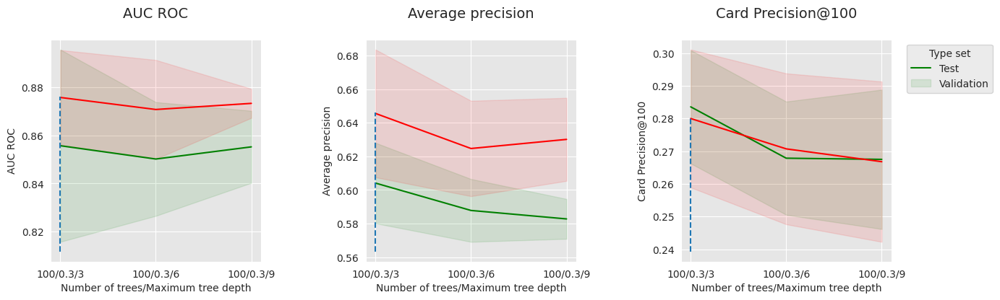

In [ ]:
performances_df_xgboost_fixed_number_of_trees=performances_df_xgboost[performances_df_xgboost["Parameters summary"].str.startswith("100/0.3")]

summary_performances_fixed_number_of_trees=get_summary_performances(performances_df_xgboost_fixed_number_of_trees, parameter_column_name="Parameters summary")

summary_performances_fixed_number_of_trees.rename(
    index={
        "Best estimated parameters": "Best estimated parameters ($k^*$)",
        "Optimal parameters": "Optimal parameters ($k_{opt}$)"
    },
    inplace=True)

get_performances_plots(performances_df_xgboost_fixed_number_of_trees,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Number of trees/Maximum tree depth",
                       summary_performances=summary_performances_fixed_number_of_trees)

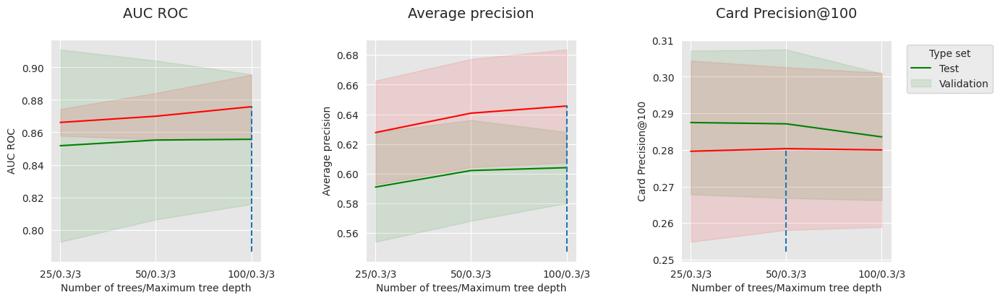

In [ ]:
performances_df_xgboost_fixed_max_tree_depth=performances_df_xgboost[performances_df_xgboost["Parameters summary"].str.endswith("0.3/3")]

summary_performances_fixed_max_tree_depth=get_summary_performances(performances_df_xgboost_fixed_max_tree_depth, parameter_column_name="Parameters summary")

summary_performances_fixed_max_tree_depth.rename(
    index={
        "Best estimated parameters": "Best estimated parameters ($k^*$)",
        "Optimal parameters": "Optimal parameters ($k_{opt}$)"
    },
    inplace=True)

get_performances_plots(performances_df_xgboost_fixed_max_tree_depth,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Number of trees/Maximum tree depth",
                       summary_performances=summary_performances_fixed_max_tree_depth)

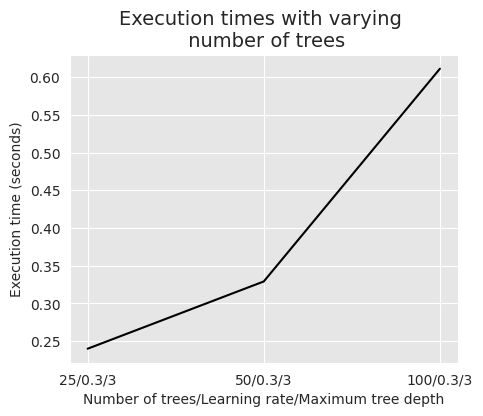

In [ ]:
get_execution_times_plot(performances_df_xgboost_fixed_max_tree_depth,
                         title="Execution times with varying \n number of trees",
                         parameter_name="Number of trees/Learning rate/Maximum tree depth")

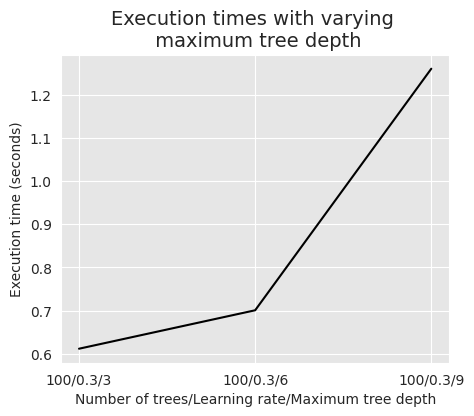

In [ ]:
get_execution_times_plot(performances_df_xgboost_fixed_number_of_trees,
                         title="Execution times with varying \n maximum tree depth",
                         parameter_name="Number of trees/Learning rate/Maximum tree depth")

In [ ]:
print("Total execution time for the model selection procedure: "+str(round(execution_time_boosting,2))+"s")

Total execution time for the model selection procedure: 130.23s


### <font color = "green">7.3 Comparison of model performances</font>



In [ ]:
performances_df_dictionary={
    "Decision Tree": performances_df_dt,
    "Logistic Regression": performances_df_lr,
    "Random Forest": performances_df_rf,
    "XGBoost": performances_df_xgboost
}

In [ ]:
def model_selection_performances(performances_df_dictionary,
                                 performance_metric='AUC ROC',
                                 model_classes=['Decision Tree',
                                                'Logistic Regression',
                                                'Random Forest',
                                                'XGBoost'],
                                 default_parameters_dictionary={
                                                "Decision Tree": 50,
                                                "Logistic Regression": 1,
                                                "Random Forest": "100/50",
                                                "XGBoost": "100/0.3/6"
                                            }):

    mean_performances_dictionary={
        "Default parameters": [],
        "Best validation parameters": [],
        "Optimal parameters": []
    }

    std_performances_dictionary={
        "Default parameters": [],
        "Best validation parameters": [],
        "Optimal parameters": []
    }

    # For each model class
    for model_class in model_classes:

        performances_df=performances_df_dictionary[model_class]

        # Get the performances for the default paramaters
        default_performances=performances_df[performances_df['Parameters summary']==default_parameters_dictionary[model_class]]
        default_performances=default_performances.round(decimals=3)

        mean_performances_dictionary["Default parameters"].append(default_performances[performance_metric+" Test"].values[0])
        std_performances_dictionary["Default parameters"].append(default_performances[performance_metric+" Test Std"].values[0])

        # Get the performances for the best estimated parameters
        performances_summary=get_summary_performances(performances_df, parameter_column_name="Parameters summary")
        mean_std_performances=performances_summary.loc[["Test performance"]][performance_metric].values[0]
        mean_std_performances=mean_std_performances.split("+/-")
        mean_performances_dictionary["Best validation parameters"].append(float(mean_std_performances[0]))
        std_performances_dictionary["Best validation parameters"].append(float(mean_std_performances[1]))

        # Get the performances for the boptimal parameters
        mean_std_performances=performances_summary.loc[["Optimal test performance"]][performance_metric].values[0]
        mean_std_performances=mean_std_performances.split("+/-")
        mean_performances_dictionary["Optimal parameters"].append(float(mean_std_performances[0]))
        std_performances_dictionary["Optimal parameters"].append(float(mean_std_performances[1]))

    # Return the mean performances and their standard deviations
    return (mean_performances_dictionary,std_performances_dictionary)

In [ ]:
model_selection_performances(performances_df_dictionary,
                             performance_metric='AUC ROC')

({'Default parameters': [np.float64(0.797),
   np.float64(0.868),
   np.float64(0.87),
   np.float64(0.85)],
  'Best validation parameters': [0.797, 0.868, 0.87, 0.869],
  'Optimal parameters': [0.813, 0.868, 0.875, 0.874]},
 {'Default parameters': [np.float64(0.005),
   np.float64(0.015),
   np.float64(0.014),
   np.float64(0.012)],
  'Best validation parameters': [0.01, 0.02, 0.02, 0.01],
  'Optimal parameters': [0.01, 0.02, 0.01, 0.01]})

In [ ]:
# Get the performance plot for a single performance metric
def get_model_selection_performance_plot(performances_df_dictionary,
                                         ax,
                                         performance_metric,
                                         ylim=[0,1],
                                         model_classes=['Decision Tree',
                                                        'Logistic Regression',
                                                        'Random Forest',
                                                        'XGBoost']):


    (mean_performances_dictionary,std_performances_dictionary) = \
        model_selection_performances(performances_df_dictionary=performances_df_dictionary,
                                     performance_metric=performance_metric)


    # width of the bars
    barWidth = 0.3
    # The x position of bars
    r1 = np.arange(len(model_classes))
    r2 = r1+barWidth
    r3 = r1+2*barWidth

    # Create Default parameters bars (Orange)
    ax.bar(r1, mean_performances_dictionary['Default parameters'],
           width = barWidth, color = '#CA8035', edgecolor = 'black',
           yerr=std_performances_dictionary['Default parameters'], capsize=7, label='Default parameters')

    # Create Best validation parameters bars (Red)
    ax.bar(r2, mean_performances_dictionary['Best validation parameters'],
           width = barWidth, color = '#008000', edgecolor = 'black',
           yerr=std_performances_dictionary['Best validation parameters'], capsize=7, label='Best validation parameters')

    # Create Optimal parameters bars (Green)
    ax.bar(r3, mean_performances_dictionary['Optimal parameters'],
           width = barWidth, color = '#2F4D7E', edgecolor = 'black',
           yerr=std_performances_dictionary['Optimal parameters'], capsize=7, label='Optimal parameters')


    # Set title, and x and y axes labels
    ax.set_ylim(ylim[0],ylim[1])
    ax.set_xticks(r2+barWidth/2)
    ax.set_xticklabels(model_classes, rotation = 45, ha="right", fontsize=12)
    ax.set_title(performance_metric+'\n', fontsize=18)
    ax.set_xlabel("Model class", fontsize=16)
    ax.set_ylabel(performance_metric, fontsize=15)

In [ ]:
def get_model_selection_performances_plots(performances_df_dictionary,
                                           performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                                           ylim_list=[[0.6,0.9],[0.2,0.8],[0.2,0.35]],
                                           model_classes=['Decision Tree',
                                                          'Logistic Regression',
                                                          'Random Forest',
                                                          'XGBoost']):

    # Create as many graphs as there are performance metrics to display
    n_performance_metrics = len(performance_metrics_list)
    fig, ax = plt.subplots(1, n_performance_metrics, figsize=(5*n_performance_metrics,4))

    parameter_types=['Default parameters','Best validation parameters','Optimal parameters']

    # Plot performance metric for each metric in performance_metrics_list
    for i in range(n_performance_metrics):

        get_model_selection_performance_plot(performances_df_dictionary,
                                             ax[i],
                                             performance_metrics_list[i],
                                             ylim=ylim_list[i],
                                             model_classes=model_classes
                                            )

    ax[n_performance_metrics-1].legend(loc='upper left',
                                       labels=parameter_types,
                                       bbox_to_anchor=(1.05, 1),
                                       title="Parameter type",
                                       prop={'size': 12},
                                       title_fontsize=12)

    plt.subplots_adjust(wspace=0.5,
                        hspace=0.8)

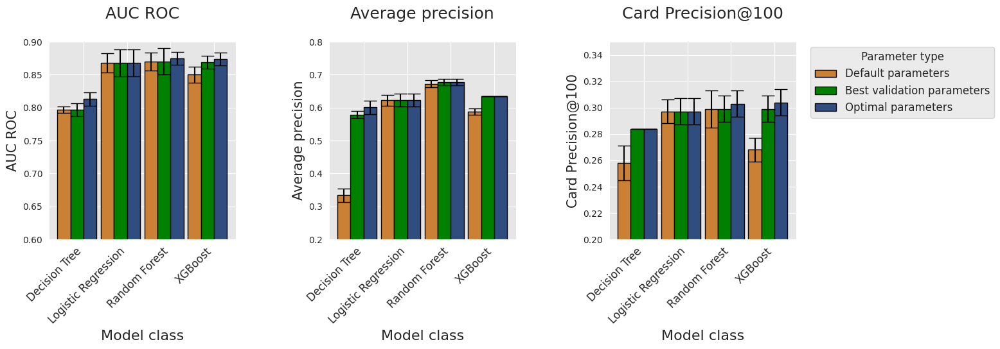

In [ ]:
get_model_selection_performances_plots(performances_df_dictionary,
                                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'])


In [ ]:
execution_times=[execution_time_dt,execution_time_lr,
                 execution_time_rf,execution_time_boosting]

In [ ]:
%%capture

fig_model_selection_execution_times_for_each_model_class, ax = plt.subplots(1, 1, figsize=(5,4))

model_classes=['Decision Tree','Logistic Regression','Random Forest','XGBoost']

# width of the bars
barWidth = 0.3
# The x position of bars
r1 = np.arange(len(model_classes))

# Create execution times bars
ax.bar(r1, execution_times[0:4],
        width = barWidth, color = 'black', edgecolor = 'black',
        capsize=7)

ax.set_xticks(r1+barWidth/2)
ax.set_xticklabels(model_classes, rotation = 45, ha="right", fontsize=12)
ax.set_title('Model selection execution times \n for different model classes', fontsize=18)
ax.set_xlabel("Model class", fontsize=16)
ax.set_ylabel("Execution times (s)", fontsize=15)

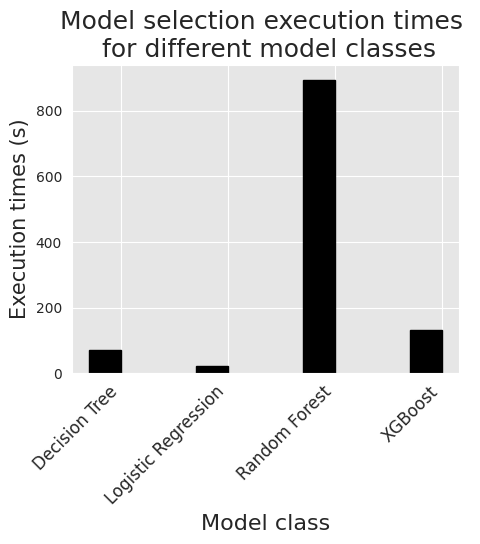

In [ ]:
fig_model_selection_execution_times_for_each_model_class

### <font color = "green">7.4 Random search</font>



In [ ]:
def prequential_parameters_search(transactions_df,
                            classifier,
                            input_features, output_feature,
                            parameters, scoring,
                            start_date_training,
                            n_folds=4,
                            expe_type='Test',
                            delta_train=7,
                            delta_delay=7,
                            delta_assessment=7,
                            performance_metrics_list_grid=['roc_auc'],
                            performance_metrics_list=['AUC ROC'],
                            type_search='grid',
                            n_iter=10,
                            random_state=0,
                            n_jobs=-1):

    estimators = [('scaler', sklearn.preprocessing.StandardScaler()), ('clf', classifier)]
    pipe = sklearn.pipeline.Pipeline(estimators)

    prequential_split_indices=prequentialSplit(transactions_df,
                                               start_date_training=start_date_training,
                                               n_folds=n_folds,
                                               delta_train=delta_train,
                                               delta_delay=delta_delay,
                                               delta_assessment=delta_assessment)

    parameters_search = None

    if type_search=="grid":

        parameters_search = sklearn.model_selection.GridSearchCV(pipe, parameters, scoring=scoring, cv=prequential_split_indices,
                                         refit=False, n_jobs=n_jobs)

    if type_search=="random":

        parameters_search = sklearn.model_selection.RandomizedSearchCV(pipe, parameters, scoring=scoring, cv=prequential_split_indices,
                                     refit=False, n_jobs=n_jobs,n_iter=n_iter,random_state=random_state)


    X=transactions_df[input_features]
    y=transactions_df[output_feature]

    parameters_search.fit(X, y)

    performances_df=pd.DataFrame()

    for i in range(len(performance_metrics_list_grid)):
        performances_df[performance_metrics_list[i]+' '+expe_type]=parameters_search.cv_results_['mean_test_'+performance_metrics_list_grid[i]]
        performances_df[performance_metrics_list[i]+' '+expe_type+' Std']=parameters_search.cv_results_['std_test_'+performance_metrics_list_grid[i]]

    performances_df['Parameters']=parameters_search.cv_results_['params']
    performances_df['Execution time']=parameters_search.cv_results_['mean_fit_time']

    return performances_df

In [ ]:
def model_selection_wrapper(transactions_df,
                            classifier,
                            input_features, output_feature,
                            parameters,
                            scoring,
                            start_date_training_for_valid,
                            start_date_training_for_test,
                            n_folds=4,
                            delta_train=7,
                            delta_delay=7,
                            delta_assessment=7,
                            performance_metrics_list_grid=['roc_auc'],
                            performance_metrics_list=['AUC ROC'],
                            type_search='grid',
                            n_iter=10,
                            random_state=0,
                            n_jobs=-1):

    # Get performances on the validation set using prequential validation
    performances_df_validation=prequential_parameters_search(transactions_df, classifier,
                            input_features, output_feature,
                            parameters, scoring,
                            start_date_training=start_date_training_for_valid,
                            n_folds=n_folds,
                            expe_type='Validation',
                            delta_train=delta_train,
                            delta_delay=delta_delay,
                            delta_assessment=delta_assessment,
                            performance_metrics_list_grid=performance_metrics_list_grid,
                            performance_metrics_list=performance_metrics_list,
                            type_search=type_search,
                            n_iter=n_iter,
                            random_state=random_state,
                            n_jobs=n_jobs)

    # Get performances on the test set using prequential validation
    performances_df_test=prequential_parameters_search(transactions_df, classifier,
                            input_features, output_feature,
                            parameters, scoring,
                            start_date_training=start_date_training_for_test,
                            n_folds=n_folds,
                            expe_type='Test',
                            delta_train=delta_train,
                            delta_delay=delta_delay,
                            delta_assessment=delta_assessment,
                            performance_metrics_list_grid=performance_metrics_list_grid,
                            performance_metrics_list=performance_metrics_list,
                            type_search=type_search,
                            n_iter=n_iter,
                            random_state=random_state,
                            n_jobs=n_jobs)

    # Bind the two resulting DataFrames
    performances_df_validation.drop(columns=['Parameters','Execution time'], inplace=True)
    performances_df=pd.concat([performances_df_test,performances_df_validation],axis=1)

    # And return as a single DataFrame
    return performances_df

In [ ]:
classifier = xgboost.XGBClassifier()

parameters = {'clf__max_depth':[3,6,9], 'clf__n_estimators':[25,50,100],'clf__learning_rate':[0.1,0.3],
              'clf__random_state':[0],'clf__n_jobs':[1],'clf__n_verbosity':[0]}

start_time=time.time()

performances_df=model_selection_wrapper(transactions_df, classifier,
                                        input_features, output_feature,
                                        parameters, scoring,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train,
                                        delta_delay=delta_delay,
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        type_search='random',
                                        n_iter=10,
                                        random_state=0,
                                        n_jobs=1)

execution_time_boosting_random = time.time()-start_time

parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[str(parameters_dict[i]['clf__n_estimators'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__learning_rate'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__max_depth'])
                                   for i in range(len(parameters_dict))]

# Rename to performances_df_xgboost_random for model performance comparison
performances_df_xgboost_random=performances_df

In [ ]:
performances_df_xgboost_random

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.866765,0.010823,0.621548,0.005457,0.299286,0.012310,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",0.325294,0.874951,0.006149,0.646991,0.015644,0.289286,0.018084,50/0.1/3
1,0.874499,0.013323,0.634286,0.007635,0.301071,0.009813,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",0.355552,0.876622,0.002784,0.655694,0.014072,0.285357,0.016975,25/0.1/9
2,0.867297,0.010830,0.629619,0.006052,0.292857,0.008748,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",1.270101,0.879074,0.002018,0.654654,0.015867,0.280357,0.016300,100/0.1/9
3,0.855226,0.024465,0.602173,0.016975,0.287143,0.010152,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",0.331532,0.869906,0.007125,0.640816,0.018232,0.280357,0.011129,50/0.3/3
4,0.850167,0.011825,0.587794,0.009358,0.267857,0.008660,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",0.689470,0.870762,0.010289,0.624702,0.014210,0.270714,0.011540,100/0.3/6
5,0.871378,0.010523,0.635422,0.004575,0.300714,0.009503,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",0.566360,0.881293,0.006127,0.658802,0.016846,0.287857,0.017656,50/0.1/6
6,0.867436,0.010562,0.630424,0.008220,0.300714,0.009556,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",0.666860,0.877798,0.008024,0.656300,0.017871,0.288929,0.018389,100/0.1/3
7,0.849413,0.010985,0.576871,0.011376,0.268571,0.010102,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",0.757845,0.871272,0.002798,0.628737,0.011429,0.267857,0.012797,50/0.3/9
8,0.855222,0.007492,0.582752,0.005939,0.267500,0.010661,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",0.906395,0.873305,0.003020,0.630132,0.012362,0.266786,0.012263,100/0.3/9
9,0.851745,0.029608,0.591023,0.018455,0.287500,0.009813,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",0.248664,0.866106,0.004123,0.627758,0.017441,0.279643,0.012387,25/0.3/3


In [ ]:
summary_performances_xgboost_random=get_summary_performances(performances_df_xgboost_random, parameter_column_name="Parameters summary")
summary_performances_xgboost_random.rename(
    index={
        "Best estimated parameters": "Best estimated parameters ($k^*$)",
        "Optimal parameters": "Optimal parameters ($k_{opt}$)"
    },
    inplace=True)
summary_performances_xgboost_random

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters ($k^*$),50/0.1/6,50/0.1/6,50/0.1/3
Validation performance,0.881+/-0.01,0.659+/-0.02,0.289+/-0.02
Test performance,0.871+/-0.01,0.635+/-0.0,0.299+/-0.01
Optimal parameters ($k_{opt}$),25/0.1/9,50/0.1/6,25/0.1/9
Optimal test performance,0.874+/-0.01,0.635+/-0.0,0.301+/-0.01


In [ ]:
# Performances with grid search
summary_performances_xgboost

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters ($k^*$),100/0.1/6,50/0.1/6,50/0.1/3
Validation performance,0.881+/-0.01,0.659+/-0.02,0.289+/-0.02
Test performance,0.869+/-0.01,0.635+/-0.0,0.299+/-0.01
Optimal parameters ($k_{opt}$),25/0.1/9,50/0.1/6,25/0.1/6
Optimal test performance,0.874+/-0.01,0.635+/-0.0,0.304+/-0.01


In [ ]:
print("Total execution time for XGBoost with grid search: "+str(round(execution_time_boosting,2))+"s")
print("Total execution time for XGBoost with random search: "+str(round(execution_time_boosting_random,2))+"s")

Total execution time for XGBoost with grid search: 130.23s
Total execution time for XGBoost with random search: 73.35s


### <font color = "green">7.5 Saving of results</font>



In [ ]:
performances_df_dictionary={
    "Decision Tree": performances_df_dt,
    "Logistic Regression": performances_df_lr,
    "Random Forest": performances_df_rf,
    "XGBoost": performances_df_xgboost,
    "XGBoost Random": performances_df_xgboost_random
}

execution_times=[execution_time_dt,
                 execution_time_lr,
                 execution_time_rf,
                 execution_time_boosting,
                 execution_time_boosting_random]

In [ ]:
filehandler = open('performances_model_selection.pkl', 'wb')
pickle.dump((performances_df_dictionary, execution_times), filehandler)
filehandler.close()

# <font color = "FF6666">8. Imbalanced learning</font>

### <font color = "green">8.1 Cost-sensitive learning</font>



In [ ]:
X, y = sklearn.datasets.make_classification(n_samples=5000, n_features=2, n_informative=2,
                                            n_redundant=0, n_repeated=0, n_classes=2,
                                            n_clusters_per_class=1,
                                            weights=[0.95, 0.05],
                                            class_sep=0.5, random_state=0)

dataset_df = pd.DataFrame({'X1':X[:,0],'X2':X[:,1], 'Y':y})

In [ ]:
%%capture
fig_distribution, ax = plt.subplots(1, 1, figsize=(5,5))

groups = dataset_df.groupby('Y')
for name, group in groups:
    ax.scatter(group.X1, group.X2, edgecolors='k', label=name,alpha=1,marker='o')

ax.legend(loc='upper left',
          bbox_to_anchor=(1.05, 1),
          title="Class")

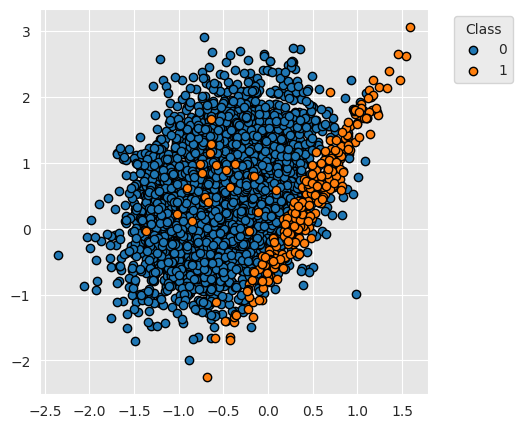

In [ ]:
fig_distribution

### <font color = "grey">8.1.1 Illustrative example_Decision tree</font>



In [ ]:
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5,class_weight={0:1,1:1},random_state=0)
cv = sklearn.model_selection.StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

In [ ]:
cv_results_ = sklearn.model_selection.cross_validate(classifier, X, y, cv=cv,
                                                     scoring=['roc_auc',
                                                              'average_precision',
                                                              'balanced_accuracy'],
                                                     return_estimator=True)

In [ ]:
results = round(pd.DataFrame(cv_results_),3)
results

,fit_time,score_time,estimator,test_roc_auc,test_average_precision,test_balanced_accuracy
0,0.089,0.149,"DecisionTreeClassifier(class_weight={0: 1, 1: ...",0.933,0.616,0.842
1,0.049,0.021,"DecisionTreeClassifier(class_weight={0: 1, 1: ...",0.871,0.493,0.739
2,0.065,0.065,"DecisionTreeClassifier(class_weight={0: 1, 1: ...",0.897,0.493,0.799
3,0.093,0.050,"DecisionTreeClassifier(class_weight={0: 1, 1: ...",0.928,0.591,0.812
4,0.099,0.047,"DecisionTreeClassifier(class_weight={0: 1, 1: ...",0.901,0.447,0.738


In [ ]:
results_numeric = results.select_dtypes(include='number')

results_mean = results_numeric.mean()
results_std = results_numeric.std()

pd.DataFrame([[str(round(results_mean[i],3))+'+/-'+str(round(results_std[i],3)) for i in range(len(results))]],
            columns=['Fit time (s)','Score time (s)','AUC ROC','Average Precision','Balanced accuracy'])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
0,0.079+/-0.021,0.066+/-0.049,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046


In [ ]:
def plot_decision_boundary_classifier(ax,
                                      classifier,
                                      train_df,
                                      input_features=['X1','X2'],
                                      output_feature='Y',
                                      title="",
                                      fs=14,
                                      plot_training_data=True):

    plot_colors = ["tab:blue","tab:orange"]

    x1_min, x1_max = train_df[input_features[0]].min() - 1, train_df[input_features[0]].max() + 1
    x2_min, x2_max = train_df[input_features[1]].min() - 1, train_df[input_features[1]].max() + 1

    plot_step=0.1
    xx, yy = np.meshgrid(np.arange(x1_min, x1_max, plot_step),
                         np.arange(x2_min, x2_max, plot_step))

    Z = classifier.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:,1]
    Z = Z.reshape(xx.shape)
    ax.contourf(xx, yy, Z, cmap=plt.cm.RdYlBu_r,alpha=0.3)

    if plot_training_data:
        # Plot the training points
        groups = train_df.groupby(output_feature)
        for name, group in groups:
            ax.scatter(group[input_features[0]], group[input_features[1]], edgecolors='black', label=name)

    ax.set_title(title, fontsize=fs)
    ax.set_xlabel(input_features[0], fontsize=fs)
    ax.set_ylabel(input_features[1], fontsize=fs)


In [ ]:
# Retrieve the decision tree from the first fold of the cross-validation
classifier_0 = cv_results_['estimator'][0]

In [ ]:
# Retrieve the indices used for the training and testing of the first fold of the cross-validation
(train_index, test_index) = next(cv.split(X, y))

# Recreate the train and test DafaFrames from these indices
train_df = pd.DataFrame({'X1':X[train_index,0], 'X2':X[train_index,1], 'Y':y[train_index]})
test_df = pd.DataFrame({'X1':X[test_index,0], 'X2':X[test_index,1], 'Y':y[test_index]})
input_features = ['X1','X2']
output_feature = 'Y'

In [ ]:
%%capture
fig_decision_boundary, ax = plt.subplots(1, 3, figsize=(5*3,5))

plot_decision_boundary_classifier(ax[0], classifier_0,
                                  train_df,
                                  title="Decision surface of the decision tree\n With training data",
                                  plot_training_data=True)

plot_decision_boundary_classifier(ax[1], classifier_0,
                                  train_df,
                                  title="Decision surface of the decision tree\n",
                                  plot_training_data=False)


plot_decision_boundary_classifier(ax[2], classifier_0,
                                  test_df,
                                  title="Decision surface of the decision tree\n With test data",
                                  plot_training_data=True)

ax[-1].legend(loc='upper left',
              bbox_to_anchor=(1.05, 1),
              title="Class")

sm = plt.cm.ScalarMappable(cmap=plt.cm.RdYlBu_r, norm=plt.Normalize(vmin=0, vmax=1))
cax = fig_decision_boundary.add_axes([0.93, 0.15, 0.02, 0.5])
fig_decision_boundary.colorbar(sm, cax=cax, alpha=0.3, boundaries=np.linspace(0, 1, 11))

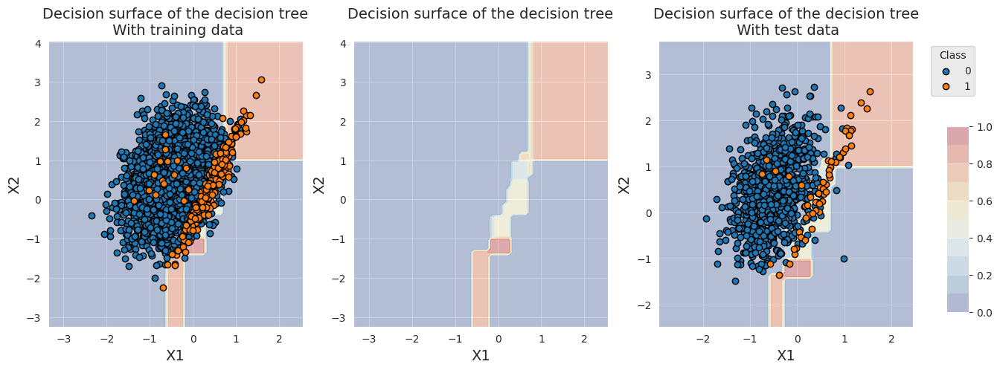

In [ ]:
fig_decision_boundary

In [ ]:
def kfold_cv_with_classifier(classifier,
                             X,
                             y,
                             n_splits=5,
                             strategy_name="Basline classifier"):

    cv = sklearn.model_selection.StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=0)

    cv_results_ = sklearn.model_selection.cross_validate(classifier,X,y,cv=cv,
                                                         scoring=['roc_auc',
                                                                  'average_precision',
                                                                  'balanced_accuracy'],
                                                         return_estimator=True)

    results = round(pd.DataFrame(cv_results_),3)

    results_numeric = results.select_dtypes(include='number')
    results_mean = results_numeric.mean()
    results_std = results_numeric.std()

    results_df = pd.DataFrame([[str(round(results_mean[i],3))+'+/-'+
                                str(round(results_std[i],3)) for i in range(len(results))]],
                              columns=['Fit time (s)','Score time (s)',
                                       'AUC ROC','Average Precision','Balanced accuracy'])
    results_df.rename(index={0:strategy_name}, inplace=True)

    classifier_0 = cv_results_['estimator'][0]

    (train_index, test_index) = next(cv.split(X, y))
    train_df = pd.DataFrame({'X1':X[train_index,0], 'X2':X[train_index,1], 'Y':y[train_index]})
    test_df = pd.DataFrame({'X1':X[test_index,0], 'X2':X[test_index,1], 'Y':y[test_index]})

    return (results_df, classifier_0, train_df, test_df)

In [ ]:
def plot_decision_boundary(classifier_0,
                           train_df,
                           test_df):

    fig_decision_boundary, ax = plt.subplots(1, 3, figsize=(5*3,5))

    plot_decision_boundary_classifier(ax[0], classifier_0,
                                  train_df,
                                  title="Decision surface of the decision tree\n With training data",
                                  plot_training_data=True)

    plot_decision_boundary_classifier(ax[1], classifier_0,
                                  train_df,
                                  title="Decision surface of the decision tree\n",
                                  plot_training_data=False)


    plot_decision_boundary_classifier(ax[2], classifier_0,
                                  test_df,
                                  title="Decision surface of the decision tree\n With test data",
                                  plot_training_data=True)

    ax[-1].legend(loc='upper left',
                  bbox_to_anchor=(1.05, 1),
                  title="Class")

    sm = plt.cm.ScalarMappable(cmap=plt.cm.RdYlBu_r, norm=plt.Normalize(vmin=0, vmax=1))
    cax = fig_decision_boundary.add_axes([0.93, 0.15, 0.02, 0.5])
    fig_decision_boundary.colorbar(sm, cax=cax, alpha=0.3, boundaries=np.linspace(0, 1, 11))

    return fig_decision_boundary

In [ ]:
%%capture
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5,class_weight={0:1,1:1},random_state=0)


(results_df_dt_baseline, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier,
                                                                                     X, y,
                                                                                     n_splits=5,
                                                                                     strategy_name="Decision tree - Baseline")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
results_df_dt_baseline

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.011+/-0.002,0.005+/-0.001,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046


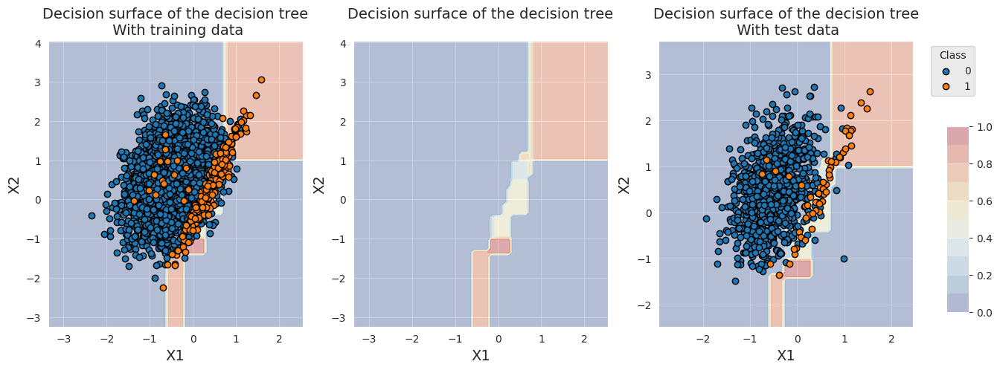

In [ ]:
fig_decision_boundary

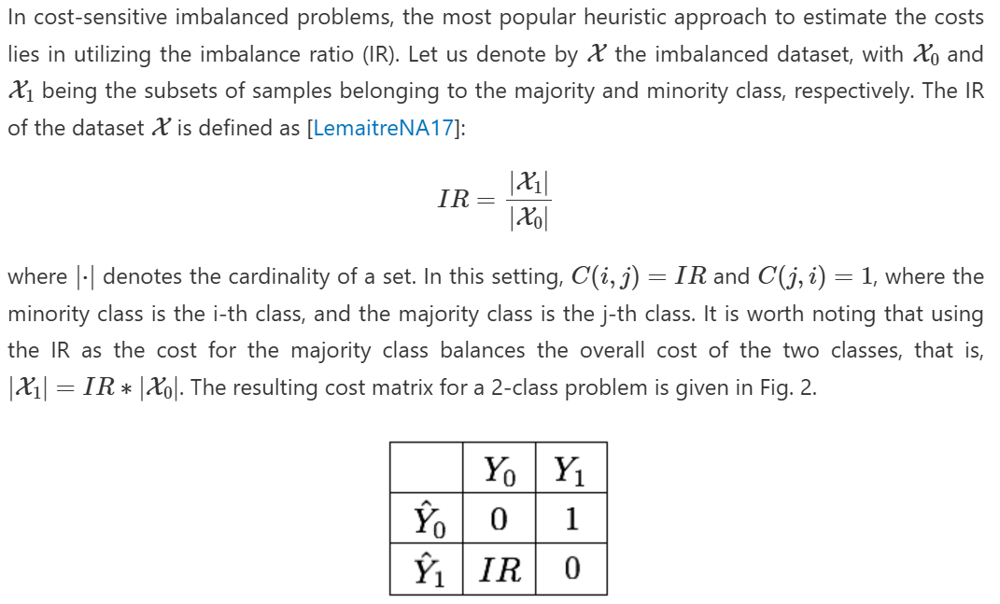

In [ ]:
IR=0.05/0.95

In [ ]:
class_weight={0:IR,1:1}

In [ ]:
%%capture
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5,class_weight=class_weight,random_state=0)

(results_df_dt_cost_sensitive, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier,
                                                                         X, y,
                                                                         n_splits=5,
                                                                         strategy_name="Decision tree - Cost-sensitive")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
pd.concat([results_df_dt_baseline,
           results_df_dt_cost_sensitive])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.011+/-0.002,0.005+/-0.001,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046
Decision tree - Cost-sensitive,0.018+/-0.005,0.012+/-0.007,0.887+/-0.034,0.471+/-0.059,0.898+/-0.021


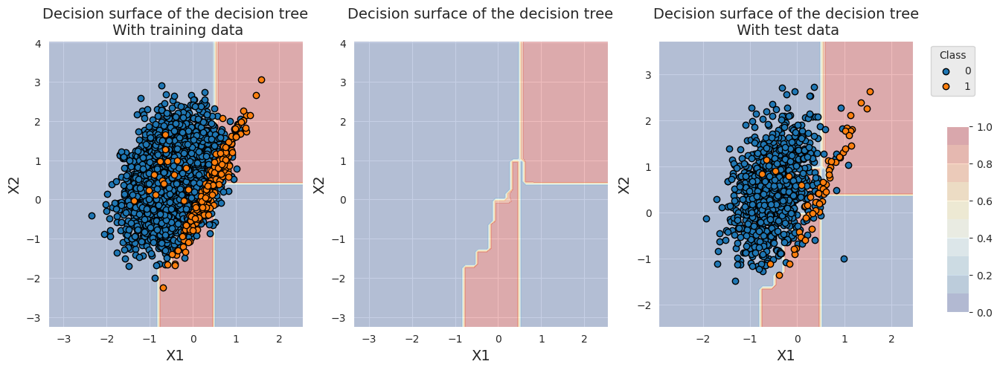

In [ ]:
fig_decision_boundary

### <font color = "grey">8.1.2 Illustrative example_Logistic regression</font>



In [ ]:
%%capture
classifier = sklearn.linear_model.LogisticRegression(C=1,class_weight={0:1,1:1},random_state=0)

(results_df_lr_baseline, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier,
                                                                          X, y,
                                                                          n_splits=5,
                                                                          strategy_name="Logistic regression - Baseline")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
results_df_lr_baseline

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Logistic regression - Baseline,0.029+/-0.014,0.016+/-0.007,0.937+/-0.012,0.535+/-0.065,0.641+/-0.048


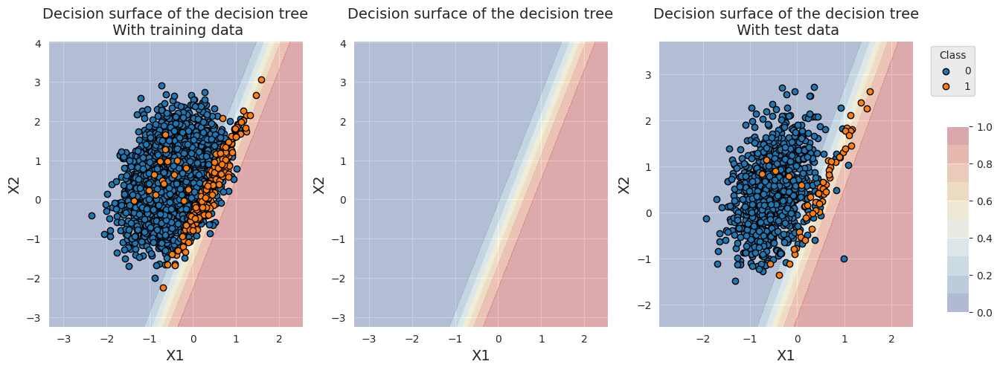

In [ ]:
fig_decision_boundary

In [ ]:
%%capture
classifier = sklearn.linear_model.LogisticRegression(C=1,class_weight={0:IR,1:1},random_state=0)

(results_df_lr_cost_sensitive, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier,
                                                                         X, y,
                                                                         n_splits=5,
                                                                         strategy_name="Logistic regression - Cost-sensitive")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
pd.concat([results_df_lr_baseline, results_df_lr_cost_sensitive])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Logistic regression - Baseline,0.029+/-0.014,0.016+/-0.007,0.937+/-0.012,0.535+/-0.065,0.641+/-0.048
Logistic regression - Cost-sensitive,0.108+/-0.023,0.049+/-0.016,0.937+/-0.012,0.536+/-0.064,0.899+/-0.01


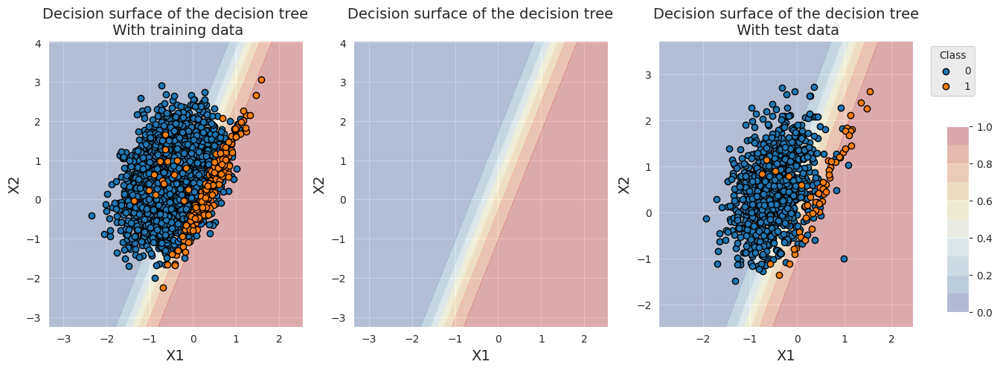

In [ ]:
fig_decision_boundary

In [ ]:
results_df = pd.concat([results_df_dt_baseline,
                        results_df_dt_cost_sensitive,
                        results_df_lr_baseline,
                        results_df_lr_cost_sensitive])
results_df

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.011+/-0.002,0.005+/-0.001,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046
Decision tree - Cost-sensitive,0.018+/-0.005,0.012+/-0.007,0.887+/-0.034,0.471+/-0.059,0.898+/-0.021
Logistic regression - Baseline,0.029+/-0.014,0.016+/-0.007,0.937+/-0.012,0.535+/-0.065,0.641+/-0.048
Logistic regression - Cost-sensitive,0.108+/-0.023,0.049+/-0.016,0.937+/-0.012,0.536+/-0.064,0.899+/-0.01


### <font color = "grey">8.1.3 Transaction data_Load data</font>



In [ ]:
# Load data from the 2018-07-11 to the 2018-09-14

DIR_INPUT = '2_Fraud-detection-handbook_simulated-data-transformed/data/'

BEGIN_DATE = "2018-06-11"
END_DATE = "2018-09-14"

print("Load  files")
%time transactions_df = read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))


# Number of folds for the prequential validation
n_folds = 4

# Set the starting day for the training period, and the deltas
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train = delta_delay = delta_test = delta_valid = delta_assessment = 7

start_date_training_for_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))
start_date_training_for_test = start_date_training+datetime.timedelta(days=(n_folds-1)*delta_test)

output_feature = "TX_FRAUD"

input_features = ['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']


# Only keep columns that are needed as argument to the custom scoring function
# (in order to reduce the serialization time of transaction dataset)
transactions_df_scorer = transactions_df[['CUSTOMER_ID', 'TX_FRAUD','TX_TIME_DAYS']]

card_precision_top_100 = sklearn.metrics.make_scorer(card_precision_top_k_custom,
                                                     response_method="predict_proba",
                                                     top_k=100,
                                                     transactions_df=transactions_df_scorer)

performance_metrics_list_grid = ['roc_auc', 'average_precision', 'card_precision@100']
performance_metrics_list = ['AUC ROC', 'Average precision', 'Card Precision@100']

scoring = {'roc_auc':'roc_auc',
           'average_precision': 'average_precision',
           'card_precision@100': card_precision_top_100,
           }

Load  files
CPU times: user 765 ms, sys: 676 ms, total: 1.44 s
Wall time: 6.24 s
919767 transactions loaded, containing 8195 fraudulent transactions


### <font color = "grey">8.1.4 Transaction data_Decision tree</font>



In [ ]:
# Define classifier
classifier = sklearn.tree.DecisionTreeClassifier()

# Set of parameters for which to assess model performances
parameters = {'clf__max_depth':[5], 'clf__random_state':[0],
              'clf__class_weight':[{0: w} for w in [0.01, 0.05, 0.1, 0.5, 1]]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df = model_selection_wrapper(transactions_df, classifier,
                                          input_features, output_feature,
                                          parameters, scoring,
                                          start_date_training_for_valid,
                                          start_date_training_for_test,
                                          n_folds=n_folds,
                                          delta_train=delta_train,
                                          delta_delay=delta_delay,
                                          delta_assessment=delta_assessment,
                                          performance_metrics_list_grid=performance_metrics_list_grid,
                                          performance_metrics_list=performance_metrics_list,
                                          n_jobs=1)

execution_time_dt = time.time()-start_time

In [ ]:
# Select parameter of interest (class_weight)
parameters_dict = dict(performances_df['Parameters'])
performances_df['Parameters summary'] = [parameters_dict[i]['clf__class_weight'][0] for i in range(len(parameters_dict))]

# Rename to performances_df_dt for model performance comparison at the end of this notebook
performances_df_dt = performances_df

In [ ]:
performances_df_dt

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.825500,0.009464,0.537440,0.033668,0.290000,0.011824,"{'clf__class_weight': {0: 0.01}, 'clf__max_dep...",0.462038,0.837454,0.014356,0.532971,0.025298,0.277500,0.011534,0.01
1,0.792912,0.029734,0.561153,0.046031,0.273571,0.018585,"{'clf__class_weight': {0: 0.05}, 'clf__max_dep...",0.574455,0.808208,0.022139,0.565643,0.027544,0.266071,0.014263,0.05
2,0.784486,0.031698,0.556320,0.031025,0.271786,0.020413,"{'clf__class_weight': {0: 0.1}, 'clf__max_dept...",0.688792,0.814153,0.023492,0.572792,0.029766,0.268929,0.016641,0.10
3,0.798043,0.020988,0.579394,0.016007,0.277857,0.003571,"{'clf__class_weight': {0: 0.5}, 'clf__max_dept...",0.542038,0.799682,0.013524,0.568408,0.018631,0.264643,0.013453,0.50
4,0.810138,0.008586,0.600306,0.016797,0.284286,0.004286,"{'clf__class_weight': {0: 1}, 'clf__max_depth'...",0.487302,0.804218,0.016505,0.546094,0.042197,0.267143,0.013515,1.00


In [ ]:
summary_performances_dt = get_summary_performances(performances_df_dt, parameter_column_name="Parameters summary")
summary_performances_dt

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.01,0.1,0.01
Validation performance,0.837+/-0.01,0.573+/-0.03,0.277+/-0.01
Test performance,0.825+/-0.01,0.556+/-0.03,0.29+/-0.01
Optimal parameter(s),0.01,1.0,0.01
Optimal test performance,0.825+/-0.01,0.6+/-0.02,0.29+/-0.01


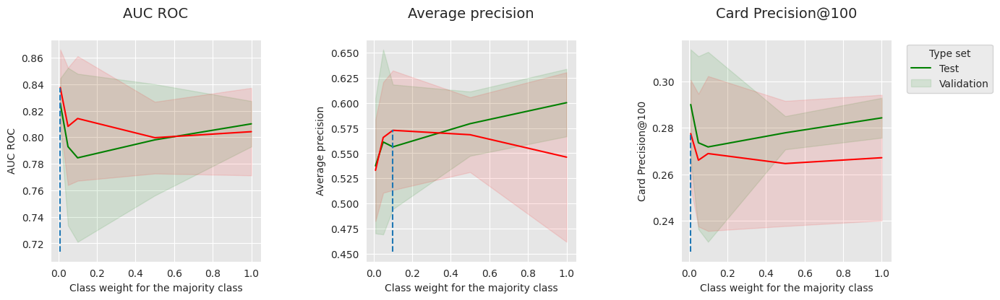

In [ ]:
get_performances_plots(performances_df_dt,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Class weight for the majority class",
                       summary_performances=summary_performances_dt)

### <font color = "grey">8.1.5 Transaction data_Logistic regression</font>



In [ ]:
# Define classifier
classifier = sklearn.linear_model.LogisticRegression()

# Set of parameters for which to assess model performances
parameters = {'clf__C':[1], 'clf__random_state':[0],
              'clf__class_weight':[{0: w} for w in [0.01, 0.05, 0.1, 0.5, 1]]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df = model_selection_wrapper(transactions_df, classifier,
                                          input_features, output_feature,
                                          parameters, scoring,
                                          start_date_training_for_valid,
                                          start_date_training_for_test,
                                          n_folds=n_folds,
                                          delta_train=delta_train,
                                          delta_delay=delta_delay,
                                          delta_assessment=delta_assessment,
                                          performance_metrics_list_grid=performance_metrics_list_grid,
                                          performance_metrics_list=performance_metrics_list,
                                          n_jobs=1)

execution_time_lr = time.time()-start_time

In [ ]:
# Select parameter of interest (class_weight)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['clf__class_weight'][0] for i in range(len(parameters_dict))]

# Rename to performances_df_dt for model performance comparison at the end of this notebook
performances_df_lr=performances_df

In [ ]:
performances_df_lr

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.871393,0.017115,0.571167,0.027914,0.293929,0.010120,"{'clf__C': 1, 'clf__class_weight': {0: 0.01}, ...",0.364327,0.871060,0.009956,0.497777,0.039766,0.276429,0.013190,0.01
1,0.870713,0.016338,0.604790,0.015863,0.296786,0.009813,"{'clf__C': 1, 'clf__class_weight': {0: 0.05}, ...",0.725556,0.870569,0.008782,0.550484,0.029530,0.278571,0.015085,0.05
2,0.870076,0.016027,0.613931,0.014775,0.296429,0.008950,"{'clf__C': 1, 'clf__class_weight': {0: 0.1}, '...",0.485174,0.869869,0.008731,0.579549,0.020083,0.277857,0.014516,0.10
3,0.868161,0.015546,0.621590,0.015900,0.297500,0.008770,"{'clf__C': 1, 'clf__class_weight': {0: 0.5}, '...",0.357315,0.867845,0.008974,0.609039,0.022849,0.277143,0.015286,0.50
4,0.867598,0.015451,0.622287,0.016762,0.297143,0.008806,"{'clf__C': 1, 'clf__class_weight': {0: 1}, 'cl...",0.376543,0.866696,0.009010,0.612230,0.023650,0.278571,0.016993,1.00


In [ ]:
summary_performances_lr = get_summary_performances(performances_df_lr, parameter_column_name="Parameters summary")
summary_performances_lr

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.01,1.0,0.05
Validation performance,0.871+/-0.01,0.612+/-0.02,0.279+/-0.02
Test performance,0.871+/-0.02,0.622+/-0.02,0.297+/-0.01
Optimal parameter(s),0.01,1.0,0.5
Optimal test performance,0.871+/-0.02,0.622+/-0.02,0.298+/-0.01


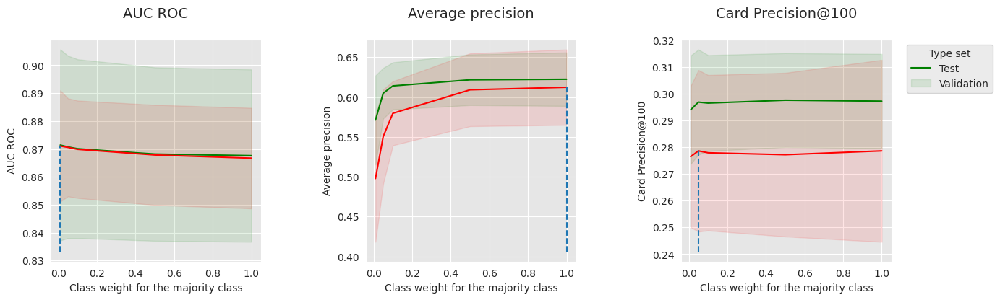

In [ ]:
get_performances_plots(performances_df_lr,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Class weight for the majority class",
                       summary_performances=summary_performances_lr)

### <font color = "grey">8.1.6 Saving of results</font>



In [ ]:
performances_df_dictionary = {
    "Decision Tree": performances_df_dt,
    "Logistic Regression": performances_df_lr
}

execution_times = [execution_time_dt,
                   execution_time_lr
                  ]

In [ ]:
filehandler = open('performances_cost_sensitive.pkl', 'wb')
pickle.dump((performances_df_dictionary, execution_times), filehandler)
filehandler.close()

### <font color = "green">8.2 Resampling strategies</font>



### <font color = "grey">8.2.1 Illustrative example_Oversampling</font>



In [ ]:
X, y = sklearn.datasets.make_classification(n_samples=5000, n_features=2, n_informative=2,
                                            n_redundant=0, n_repeated=0, n_classes=2,
                                            n_clusters_per_class=1,
                                            weights=[0.95, 0.05],
                                            class_sep=0.5, random_state=0)

dataset_df = pd.DataFrame({'X1':X[:,0],'X2':X[:,1], 'Y':y})

In [ ]:
%%capture
fig_distribution, ax = plt.subplots(1, 1, figsize=(5,5))

groups = dataset_df.groupby('Y')
for name, group in groups:
    ax.scatter(group.X1, group.X2, edgecolors='k', label=name,alpha=1,marker='o')

ax.legend(loc='upper left',
          bbox_to_anchor=(1.05, 1),
          title="Class")

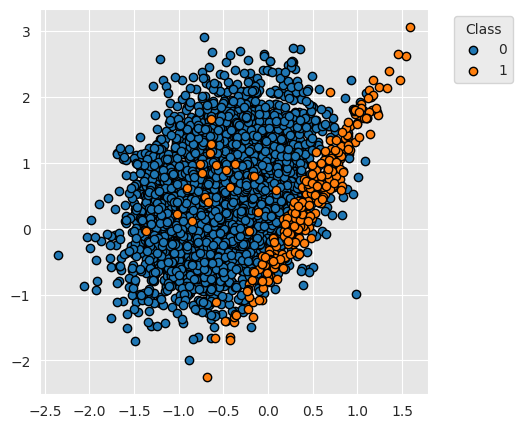

In [ ]:
fig_distribution

In [ ]:
%run shared_functions.py

<Figure size 640x480 with 0 Axes>

In [ ]:
%%capture
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)

(results_df_dt_baseline, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier,
                                                                                     X, y,
                                                                                     n_splits=5,
                                                                                     strategy_name="Decision tree - Baseline")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
results_df_dt_baseline

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.01+/-0.0,0.005+/-0.0,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046


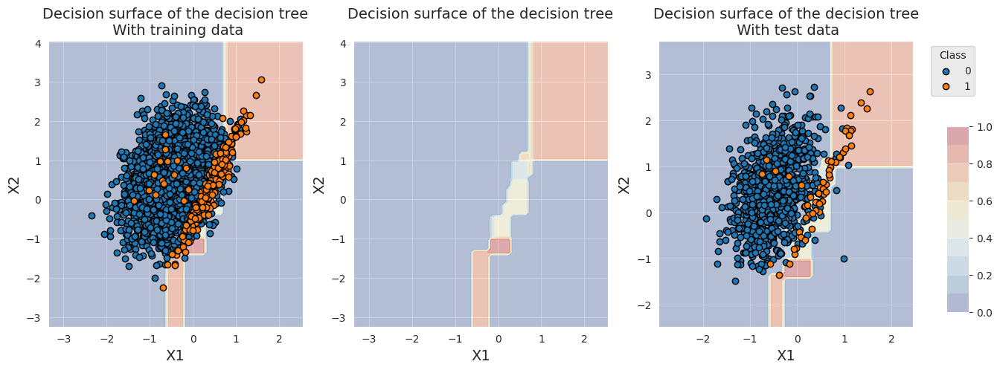

In [ ]:
fig_decision_boundary

##### <font color = "black">8.2.1.1 Illustrative example_Oversampling_Random oversampling</font>



In [ ]:
# random_state is set to 0 for reproducibility
ROS = imblearn.over_sampling.RandomOverSampler(sampling_strategy=1, random_state=0)

In [ ]:
cv = sklearn.model_selection.StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

# Retrieve the indices used for the training and testing of the first fold of the cross-validation
(train_index, test_index) = next(cv.split(X, y))

# Recreate the train and test DafaFrames from these indices
train_df = pd.DataFrame({'X1':X[train_index,0], 'X2':X[train_index,1], 'Y':y[train_index]})
test_df = pd.DataFrame({'X1':X[test_index,0], 'X2':X[test_index,1], 'Y':y[test_index]})
input_features = ['X1','X2']
output_feature = 'Y'

In [ ]:
train_df['Y'].value_counts()

,count
Y,
0,3784
1,216


In [ ]:
X_resampled, Y_resampled = ROS.fit_resample(train_df[['X1','X2']], train_df['Y'])
train_df_ROS = pd.DataFrame({'X1':X_resampled['X1'],'X2':X_resampled['X2'], 'Y':Y_resampled})

In [ ]:
train_df_ROS['Y'].value_counts()

,count
Y,
0,3784
1,3784


In [ ]:
def kfold_cv_with_sampler_and_classifier(classifier,
                                         sampler_list,
                                         X,
                                         y,
                                         n_splits=5,
                                         strategy_name="Baseline classifier"):

    # Create a pipeline with the list of samplers, and the estimator
    estimators = sampler_list.copy()
    estimators.extend([('clf', classifier)])

    pipe = imblearn.pipeline.Pipeline(estimators)

    cv = sklearn.model_selection.StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=0)

    cv_results_ = sklearn.model_selection.cross_validate(pipe,X,y,cv=cv,
                                                         scoring=['roc_auc',
                                                                  'average_precision',
                                                                  'balanced_accuracy'],
                                                         return_estimator=True)

    results = round(pd.DataFrame(cv_results_),3)

    results_numeric = results.select_dtypes(include='number')
    results_mean = results_numeric.mean()
    results_std = results_numeric.std()

    #results_mean = list(results.mean().values)
    #results_std = list(results.std().values)
    results_df = pd.DataFrame([[str(round(results_mean[i],3))+'+/-'+
                                str(round(results_std[i],3)) for i in range(len(results))]],
                              columns=['Fit time (s)','Score time (s)',
                                       'AUC ROC','Average Precision','Balanced accuracy'])
    results_df.rename(index={0:strategy_name}, inplace=True)

    classifier_0 = cv_results_['estimator'][0]

    (train_index, test_index) = next(cv.split(X, y))
    X_resampled, Y_resampled = X[train_index,:], y[train_index]
    for i in range(len(sampler_list)):
        X_resampled, Y_resampled = sampler_list[i][1].fit_resample(X_resampled, Y_resampled)

    test_df = pd.DataFrame({'X1':X[test_index,0],'X2':X[test_index,1], 'Y':y[test_index]})
    train_df = pd.DataFrame({'X1':X_resampled[:,0],'X2':X_resampled[:,1], 'Y':Y_resampled})

    return (results_df, classifier_0, train_df, test_df)

In [ ]:
%%capture

sampler_list = [('sampler',imblearn.over_sampling.RandomOverSampler(sampling_strategy=1, random_state=0))]
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)

(results_df_ROS, classifier_0, train_df, test_df) = kfold_cv_with_sampler_and_classifier(classifier,
                                                                                         sampler_list,
                                                                                         X, y,
                                                                                         n_splits=5,
                                                                                         strategy_name="Decision tree - ROS")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
train_df['Y'].value_counts()

,count
Y,
0,3784
1,3784


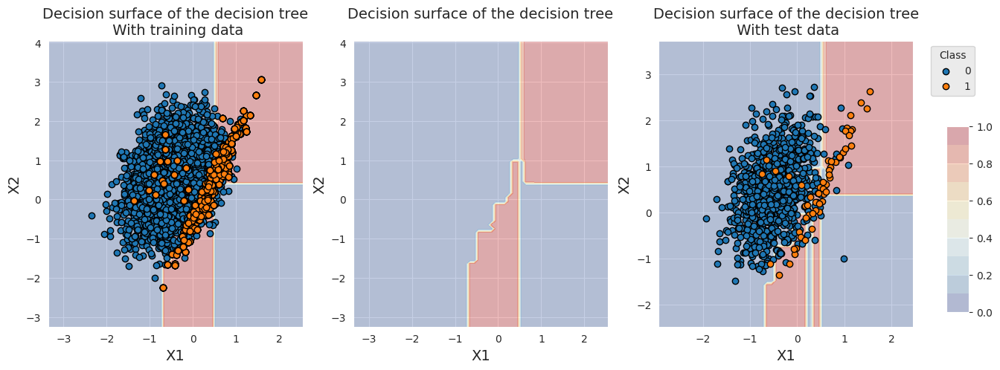

In [ ]:
fig_decision_boundary

In [ ]:
pd.concat([results_df_dt_baseline,
           results_df_ROS])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.01+/-0.0,0.005+/-0.0,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046
Decision tree - ROS,0.015+/-0.002,0.007+/-0.001,0.88+/-0.038,0.456+/-0.062,0.888+/-0.03


##### <font color = "black">8.2.1.2 Illustrative example_Oversampling_SMOTE</font>



In [ ]:
%%capture

sampler_list = [('sampler', imblearn.over_sampling.SMOTE(sampling_strategy=1, random_state=0))]
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)

(results_df_SMOTE, classifier_0, train_df, test_df) = kfold_cv_with_sampler_and_classifier(classifier,
                                                                                           sampler_list,
                                                                                           X, y,
                                                                                           n_splits=5,
                                                                                           strategy_name="Decision tree - SMOTE")


fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
train_df['Y'].value_counts()

,count
Y,
0,3784
1,3784


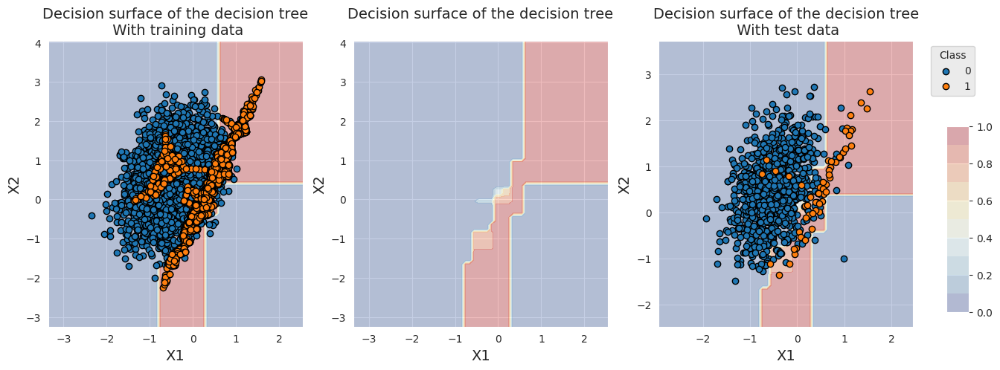

In [ ]:
fig_decision_boundary

In [ ]:
pd.concat([results_df_dt_baseline,
           results_df_ROS,
           results_df_SMOTE])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.01+/-0.0,0.005+/-0.0,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046
Decision tree - ROS,0.015+/-0.002,0.007+/-0.001,0.88+/-0.038,0.456+/-0.062,0.888+/-0.03
Decision tree - SMOTE,0.023+/-0.005,0.007+/-0.001,0.913+/-0.032,0.499+/-0.056,0.91+/-0.019


### <font color = "grey">8.2.2 Illustrative example_Undersampling</font>



##### <font color = "black">8.2.2.1 Illustrative example_Undersampling_Random undersampling</font>



In [ ]:
%%capture

sampler_list = [('sampler', imblearn.under_sampling.RandomUnderSampler(sampling_strategy=1, random_state=0))]

classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)

(results_df_RUS, classifier_0, train_df, test_df) = kfold_cv_with_sampler_and_classifier(classifier,
                                                                                         sampler_list,
                                                                                         X, y,
                                                                                         n_splits=5,
                                                                                         strategy_name="Decision tree - RUS")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
train_df['Y'].value_counts()

,count
Y,
0,216
1,216


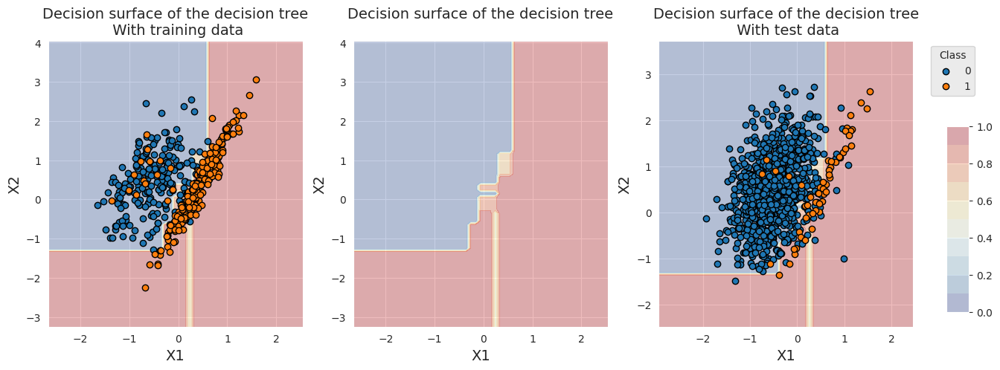

In [ ]:
fig_decision_boundary

In [ ]:
pd.concat([results_df_dt_baseline,
           results_df_ROS,
           results_df_SMOTE,
           results_df_RUS])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.01+/-0.0,0.005+/-0.0,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046
Decision tree - ROS,0.015+/-0.002,0.007+/-0.001,0.88+/-0.038,0.456+/-0.062,0.888+/-0.03
Decision tree - SMOTE,0.023+/-0.005,0.007+/-0.001,0.913+/-0.032,0.499+/-0.056,0.91+/-0.019
Decision tree - RUS,0.007+/-0.002,0.01+/-0.004,0.913+/-0.02,0.408+/-0.058,0.896+/-0.023


##### <font color = "black">8.2.2.2 Illustrative example_Undersampling_Edited Nearest Neighbor</font>



In [ ]:
%run shared_functions.py

<Figure size 640x480 with 0 Axes>

In [ ]:
%%capture

sampler_list = [('sampler', imblearn.under_sampling.EditedNearestNeighbours(sampling_strategy='majority',n_neighbors=3))]

classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)

(results_df_ENN, classifier_0, train_df, test_df) = kfold_cv_with_sampler_and_classifier(classifier,
                                                                                         sampler_list,
                                                                                         X, y,
                                                                                         n_splits=5,
                                                                                         strategy_name="Decision tree - ENN")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
train_df['Y'].value_counts()

,count
Y,
0,3572
1,216


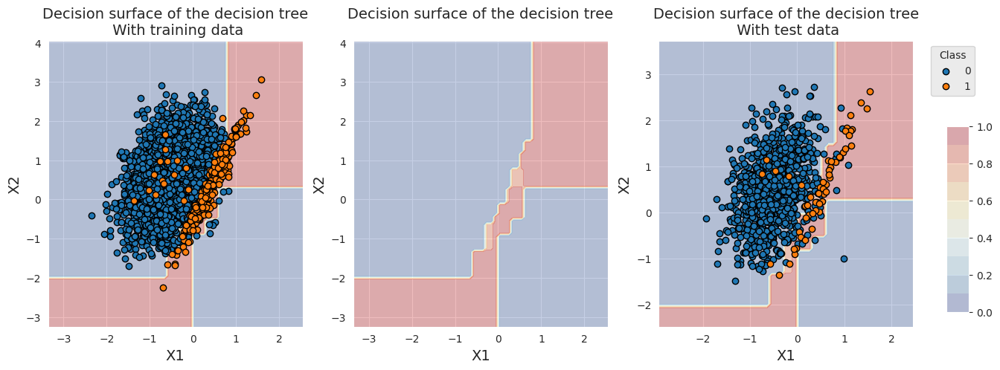

In [ ]:
fig_decision_boundary

In [ ]:
pd.concat([results_df_dt_baseline,
           results_df_ROS,
           results_df_SMOTE,
           results_df_RUS,
           results_df_ENN])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.01+/-0.0,0.005+/-0.0,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046
Decision tree - ROS,0.015+/-0.002,0.007+/-0.001,0.88+/-0.038,0.456+/-0.062,0.888+/-0.03
Decision tree - SMOTE,0.023+/-0.005,0.007+/-0.001,0.913+/-0.032,0.499+/-0.056,0.91+/-0.019
Decision tree - RUS,0.007+/-0.002,0.01+/-0.004,0.913+/-0.02,0.408+/-0.058,0.896+/-0.023
Decision tree - ENN,0.022+/-0.002,0.007+/-0.001,0.879+/-0.038,0.474+/-0.08,0.857+/-0.041


### <font color = "grey">8.2.3 Illustrative example_Combining over and undersampling</font>



In [ ]:
sampler_list = [('sampler1', imblearn.over_sampling.SMOTE(sampling_strategy=0.5,random_state=0)),
                ('sampler2', imblearn.under_sampling.RandomUnderSampler(sampling_strategy=1.0,random_state=0))
               ]

classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)

estimators = sampler_list.extend([('clf', classifier)])

pipe = imblearn.pipeline.Pipeline(estimators)

In [ ]:
%%capture
sampler_list = [('sampler1', imblearn.over_sampling.SMOTE(sampling_strategy=0.5,random_state=0)),
                ('sampler2', imblearn.under_sampling.RandomUnderSampler(sampling_strategy=1.0,random_state=0))
               ]

classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)

(results_df_combined, classifier_0, train_df, test_df) = kfold_cv_with_sampler_and_classifier(classifier,
                                                                                              sampler_list,
                                                                                              X, y,
                                                                                              n_splits=5,
                                                                                              strategy_name='Decision tree - Combined SMOTE and RUS')

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
train_df['Y'].value_counts()

,count
Y,
0,1892
1,1892


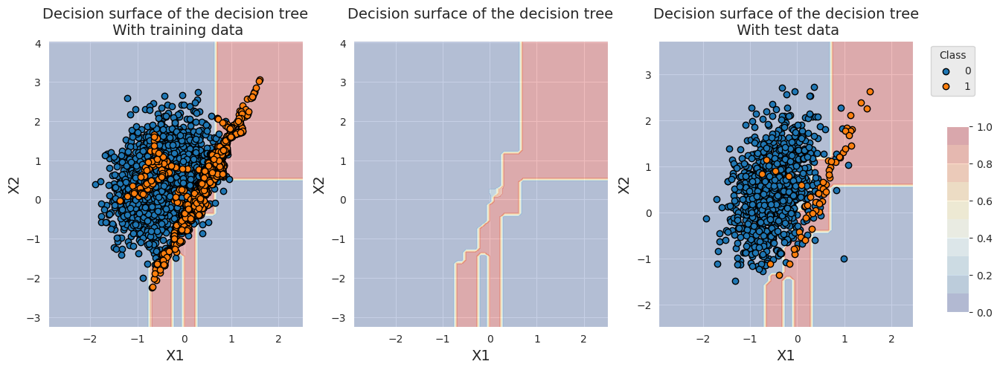

In [ ]:
fig_decision_boundary

In [ ]:
pd.concat([results_df_dt_baseline,
           results_df_ROS,
           results_df_SMOTE,
           results_df_RUS,
           results_df_ENN,
           results_df_combined])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.01+/-0.0,0.005+/-0.0,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046
Decision tree - ROS,0.015+/-0.002,0.007+/-0.001,0.88+/-0.038,0.456+/-0.062,0.888+/-0.03
Decision tree - SMOTE,0.023+/-0.005,0.007+/-0.001,0.913+/-0.032,0.499+/-0.056,0.91+/-0.019
Decision tree - RUS,0.007+/-0.002,0.01+/-0.004,0.913+/-0.02,0.408+/-0.058,0.896+/-0.023
Decision tree - ENN,0.022+/-0.002,0.007+/-0.001,0.879+/-0.038,0.474+/-0.08,0.857+/-0.041
Decision tree - Combined SMOTE and RUS,0.042+/-0.027,0.021+/-0.021,0.915+/-0.012,0.494+/-0.062,0.912+/-0.005


### <font color = "grey">8.2.4 Transaction data_Load data</font>



In [ ]:
# Load data from the 2018-07-11 to the 2018-09-14

DIR_INPUT = '2_Fraud-detection-handbook_simulated-data-transformed/data/'

BEGIN_DATE = "2018-06-11"
END_DATE = "2018-09-14"

print("Load  files")
%time transactions_df = read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))


# Number of folds for the prequential validation
n_folds = 4

# Set the starting day for the training period, and the deltas
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train = delta_delay = delta_test = delta_valid = delta_assessment = 7

start_date_training_for_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))
start_date_training_for_test = start_date_training+datetime.timedelta(days=(n_folds-1)*delta_test)

output_feature = "TX_FRAUD"

input_features = ['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']


# Only keep columns that are needed as argument to the custom scoring function
# (in order to reduce the serialization time of transaction dataset)
transactions_df_scorer = transactions_df[['CUSTOMER_ID', 'TX_FRAUD','TX_TIME_DAYS']]

card_precision_top_100 = sklearn.metrics.make_scorer(card_precision_top_k_custom,
                                                     response_method="predict_proba",
                                                     top_k=100,
                                                     transactions_df=transactions_df_scorer)

performance_metrics_list_grid = ['roc_auc', 'average_precision', 'card_precision@100']
performance_metrics_list = ['AUC ROC', 'Average precision', 'Card Precision@100']

scoring = {'roc_auc':'roc_auc',
           'average_precision': 'average_precision',
           'card_precision@100': card_precision_top_100,
           }

Load  files
CPU times: user 803 ms, sys: 431 ms, total: 1.23 s
Wall time: 4.07 s
919767 transactions loaded, containing 8195 fraudulent transactions


In [ ]:
# Define classifier
classifier = sklearn.tree.DecisionTreeClassifier()

# Set of parameters for which to assess model performances
parameters = {'clf__max_depth':[5], 'clf__random_state':[0]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper(transactions_df, classifier,
                                        input_features, output_feature,
                                        parameters, scoring,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train,
                                        delta_delay=delta_delay,
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=1)

execution_time_dt = time.time()-start_time

# Select parameter of interest (max_depth)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['clf__max_depth'] for i in range(len(parameters_dict))]

# Rename to performances_df_dt for model performance comparison at the end of this notebook
performances_df_dt=performances_df

In [ ]:
summary_performances_dt=get_summary_performances(performances_df_dt, parameter_column_name="Parameters summary")
summary_performances_dt

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,5,5,5
Validation performance,0.804+/-0.02,0.546+/-0.04,0.267+/-0.01
Test performance,0.81+/-0.01,0.6+/-0.02,0.284+/-0.0
Optimal parameter(s),5,5,5
Optimal test performance,0.81+/-0.01,0.6+/-0.02,0.284+/-0.0


### <font color = "grey">8.2.5 Transaction data_Prequential validation with resampling</font>



In [ ]:
def prequential_grid_search_with_sampler(transactions_df,
                                         classifier, sampler_list,
                                         input_features, output_feature,
                                         parameters, scoring,
                                         start_date_training,
                                         n_folds=4,
                                         expe_type='Test',
                                         delta_train=7,
                                         delta_delay=7,
                                         delta_assessment=7,
                                         performance_metrics_list_grid=['roc_auc'],
                                         performance_metrics_list=['AUC ROC'],
                                         n_jobs=-1):

    estimators = sampler_list.copy()
    estimators.extend([('clf', classifier)])

    pipe = imblearn.pipeline.Pipeline(estimators)

    prequential_split_indices = prequentialSplit(transactions_df,
                                                 start_date_training=start_date_training,
                                                 n_folds=n_folds,
                                                 delta_train=delta_train,
                                                 delta_delay=delta_delay,
                                                 delta_assessment=delta_assessment)

    grid_search = sklearn.model_selection.GridSearchCV(pipe, parameters, scoring=scoring, cv=prequential_split_indices, refit=False, n_jobs=n_jobs)

    X = transactions_df[input_features]
    y = transactions_df[output_feature]

    grid_search.fit(X, y)

    performances_df = pd.DataFrame()

    for i in range(len(performance_metrics_list_grid)):
        performances_df[performance_metrics_list[i]+' '+expe_type]=grid_search.cv_results_['mean_test_'+performance_metrics_list_grid[i]]
        performances_df[performance_metrics_list[i]+' '+expe_type+' Std']=grid_search.cv_results_['std_test_'+performance_metrics_list_grid[i]]

    performances_df['Parameters'] = grid_search.cv_results_['params']
    performances_df['Execution time'] = grid_search.cv_results_['mean_fit_time']

    return performances_df

In [ ]:
def model_selection_wrapper_with_sampler(transactions_df,
                                         classifier,
                                         sampler_list,
                                         input_features, output_feature,
                                         parameters,
                                         scoring,
                                         start_date_training_for_valid,
                                         start_date_training_for_test,
                                         n_folds=4,
                                         delta_train=7,
                                         delta_delay=7,
                                         delta_assessment=7,
                                         performance_metrics_list_grid=['roc_auc'],
                                         performance_metrics_list=['AUC ROC'],
                                         n_jobs=-1):

    # Get performances on the validation set using prequential validation
    performances_df_validation = prequential_grid_search_with_sampler(transactions_df, classifier, sampler_list,
                            input_features, output_feature,
                            parameters, scoring,
                            start_date_training=start_date_training_for_valid,
                            n_folds=n_folds,
                            expe_type='Validation',
                            delta_train=delta_train,
                            delta_delay=delta_delay,
                            delta_assessment=delta_assessment,
                            performance_metrics_list_grid=performance_metrics_list_grid,
                            performance_metrics_list=performance_metrics_list,
                            n_jobs=n_jobs)

    # Get performances on the test set using prequential validation
    performances_df_test = prequential_grid_search_with_sampler(transactions_df, classifier, sampler_list,
                            input_features, output_feature,
                            parameters, scoring,
                            start_date_training=start_date_training_for_test,
                            n_folds=n_folds,
                            expe_type='Test',
                            delta_train=delta_train,
                            delta_delay=delta_delay,
                            delta_assessment=delta_assessment,
                            performance_metrics_list_grid=performance_metrics_list_grid,
                            performance_metrics_list=performance_metrics_list,
                            n_jobs=n_jobs)

    # Bind the two resulting DataFrames
    performances_df_validation.drop(columns=['Parameters','Execution time'], inplace=True)
    performances_df = pd.concat([performances_df_test,performances_df_validation],axis=1)

    # And return as a single DataFrame
    return performances_df

### <font color = "grey">8.2.6 Transaction data_Oversampling</font>



In [ ]:
# Define classifier
classifier = sklearn.tree.DecisionTreeClassifier()

# Define sampling strategy
sampler_list = [('sampler', imblearn.over_sampling.SMOTE(random_state=0))]

# Set of parameters for which to assess model performances
parameters = {'clf__max_depth':[5], 'clf__random_state':[0],
              'sampler__sampling_strategy':[0.01, 0.05, 0.1, 0.5, 1], 'sampler__random_state':[0]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper_with_sampler(transactions_df, classifier, sampler_list,
                                                     input_features, output_feature,
                                                     parameters, scoring,
                                                     start_date_training_for_valid,
                                                     start_date_training_for_test,
                                                     n_folds=n_folds,
                                                     delta_train=delta_train,
                                                     delta_delay=delta_delay,
                                                     delta_assessment=delta_assessment,
                                                     performance_metrics_list_grid=performance_metrics_list_grid,
                                                     performance_metrics_list=performance_metrics_list,
                                                     n_jobs=1)

execution_time_dt_SMOTE = time.time()-start_time

In [ ]:
# Select parameter of interest (sampling_strategy)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['sampler__sampling_strategy'] for i in range(len(parameters_dict))]

# Rename to performances_df_SMOTE for model performance comparison at the end of this notebook
performances_df_SMOTE = performances_df

In [ ]:
performances_df_SMOTE

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.805165,0.005955,0.587136,0.010773,0.282500,0.006879,"{'clf__max_depth': 5, 'clf__random_state': 0, ...",0.419045,0.803468,0.014269,0.554155,0.032957,0.266786,0.012753,0.01
1,0.823732,0.006235,0.572835,0.024824,0.285357,0.009550,"{'clf__max_depth': 5, 'clf__random_state': 0, ...",1.042609,0.809590,0.018765,0.558479,0.027820,0.271429,0.009949,0.05
2,0.827219,0.010190,0.544275,0.037686,0.289286,0.010619,"{'clf__max_depth': 5, 'clf__random_state': 0, ...",1.064269,0.807543,0.016324,0.537672,0.040918,0.268571,0.012897,0.10
3,0.842985,0.018418,0.558118,0.033607,0.288571,0.017173,"{'clf__max_depth': 5, 'clf__random_state': 0, ...",1.185555,0.849501,0.015830,0.495635,0.052593,0.279643,0.017939,0.50
4,0.845270,0.008136,0.545954,0.031952,0.294643,0.011220,"{'clf__max_depth': 5, 'clf__random_state': 0, ...",1.703951,0.857367,0.012183,0.493752,0.049094,0.277500,0.015064,1.00


In [ ]:
summary_performances_SMOTE = get_summary_performances(performances_df_SMOTE, parameter_column_name="Parameters summary")
summary_performances_SMOTE

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,1.0,0.05,0.5
Validation performance,0.857+/-0.01,0.558+/-0.03,0.28+/-0.02
Test performance,0.845+/-0.01,0.573+/-0.02,0.289+/-0.02
Optimal parameter(s),1.0,0.01,1.0
Optimal test performance,0.845+/-0.01,0.587+/-0.01,0.295+/-0.01


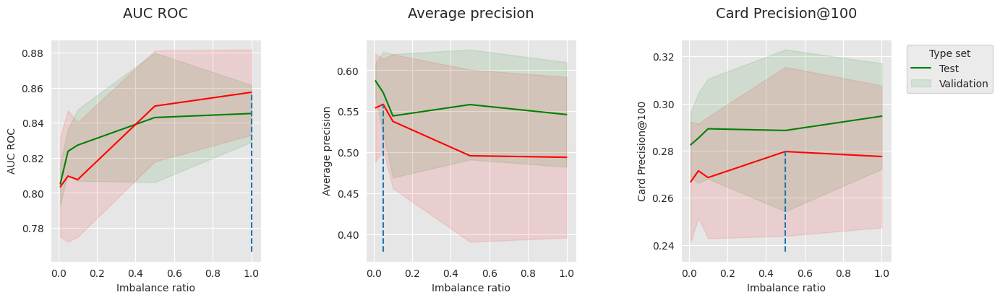

In [ ]:
get_performances_plots(performances_df_SMOTE,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Imbalance ratio",
                       summary_performances=summary_performances_SMOTE)

### <font color = "grey">8.2.7 Transaction data_Undersampling</font>



In [ ]:
# Define classifier
classifier = sklearn.tree.DecisionTreeClassifier()

# Define sampling strategy
sampler_list = [('sampler', imblearn.under_sampling.RandomUnderSampler())]

# Set of parameters for which to assess model performances
parameters = {'clf__max_depth':[5], 'clf__random_state':[0],
              'sampler__sampling_strategy':[0.01, 0.05, 0.1, 0.5, 1], 'sampler__random_state':[0]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper_with_sampler(transactions_df, classifier, sampler_list,
                                                     input_features, output_feature,
                                                     parameters, scoring,
                                                     start_date_training_for_valid,
                                                     start_date_training_for_test,
                                                     n_folds=n_folds,
                                                     delta_train=delta_train,
                                                     delta_delay=delta_delay,
                                                     delta_assessment=delta_assessment,
                                                     performance_metrics_list_grid=performance_metrics_list_grid,
                                                     performance_metrics_list=performance_metrics_list,
                                                     n_jobs=1)

execution_time_dt_RUS = time.time()-start_time

# Select parameter of interest (sampling_strategy)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['sampler__sampling_strategy'] for i in range(len(parameters_dict))]

# Rename to performances_df_RUS for model performance comparison at the end of this notebook
performances_df_RUS = performances_df

In [ ]:
summary_performances_RUS=get_summary_performances(performances_df_RUS, parameter_column_name="Parameters summary")
summary_performances_RUS

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,1.0,0.01,0.05
Validation performance,0.845+/-0.01,0.535+/-0.04,0.269+/-0.01
Test performance,0.83+/-0.01,0.594+/-0.02,0.274+/-0.02
Optimal parameter(s),1.0,0.01,0.5
Optimal test performance,0.83+/-0.01,0.594+/-0.02,0.292+/-0.01


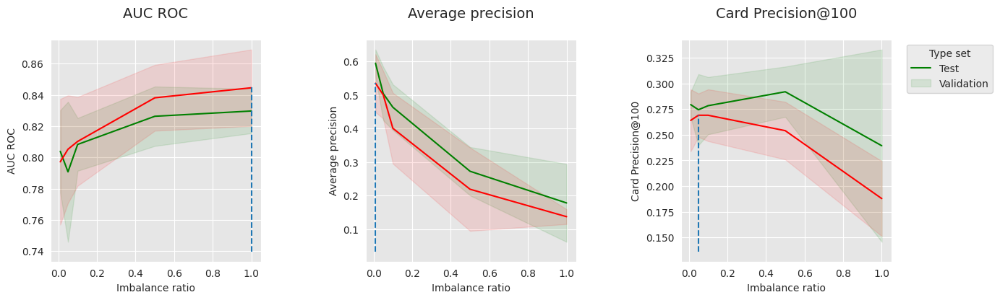

In [ ]:
get_performances_plots(performances_df_RUS,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Imbalance ratio",
                       summary_performances=summary_performances_RUS)

### <font color = "grey">8.2.8 Transaction data_Combining</font>



In [ ]:
# Define classifier
classifier = sklearn.tree.DecisionTreeClassifier()

# Define sampling strategy
sampler_list = [('sampler1', imblearn.over_sampling.SMOTE()),
                ('sampler2', imblearn.under_sampling.RandomUnderSampler())
               ]

# Set of parameters for which to assess model performances
parameters = {'clf__max_depth':[5], 'clf__random_state':[0],
              'sampler1__sampling_strategy':[0.1],
              'sampler2__sampling_strategy':[0.1, 0.5, 1],
              'sampler1__random_state':[0], 'sampler2__random_state':[0]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df = model_selection_wrapper_with_sampler(transactions_df, classifier, sampler_list,
                                                     input_features, output_feature,
                                                     parameters, scoring,
                                                     start_date_training_for_valid,
                                                     start_date_training_for_test,
                                                     n_folds=n_folds,
                                                     delta_train=delta_train,
                                                     delta_delay=delta_delay,
                                                     delta_assessment=delta_assessment,
                                                     performance_metrics_list_grid=performance_metrics_list_grid,
                                                     performance_metrics_list=performance_metrics_list,
                                                     n_jobs=1)

execution_time_dt_combined = time.time()-start_time

# Select parameter of interest (max_depth)
parameters_dict = dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['sampler2__sampling_strategy'] for i in range(len(parameters_dict))]

# Rename to performances_df_combined for model performance comparison at the end of this notebook
performances_df_combined = performances_df

In [ ]:
performances_df_combined

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.827219,0.010190,0.544275,0.037686,0.289286,0.010619,"{'clf__max_depth': 5, 'clf__random_state': 0, ...",0.625189,0.807543,0.016324,0.537672,0.040918,0.268571,0.012897,0.1
1,0.848464,0.008701,0.471467,0.010144,0.298929,0.010850,"{'clf__max_depth': 5, 'clf__random_state': 0, ...",0.349894,0.841237,0.015297,0.428576,0.050091,0.280357,0.011266,0.5
2,0.847110,0.010754,0.385133,0.064916,0.287143,0.017871,"{'clf__max_depth': 5, 'clf__random_state': 0, ...",0.542271,0.856399,0.012189,0.342964,0.020342,0.280357,0.017623,1.0


In [ ]:
summary_performances_combined = get_summary_performances(performances_df=performances_df_combined,
                                                         parameter_column_name="Parameters summary")
summary_performances_combined

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,1.0,0.1,0.5
Validation performance,0.856+/-0.01,0.538+/-0.04,0.28+/-0.01
Test performance,0.847+/-0.01,0.544+/-0.04,0.299+/-0.01
Optimal parameter(s),0.5,0.1,0.5
Optimal test performance,0.848+/-0.01,0.544+/-0.04,0.299+/-0.01


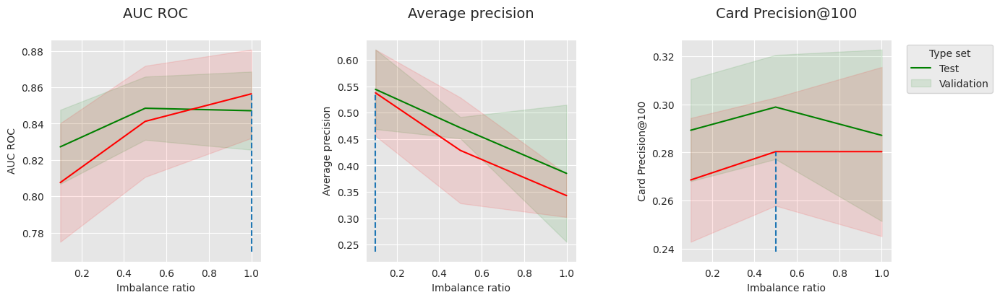

In [ ]:
get_performances_plots(performances_df_combined,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Imbalance ratio",
                       summary_performances=summary_performances_combined)

In [ ]:
summary_test_performances = pd.concat([summary_performances_dt.iloc[2,:],
                                       summary_performances_SMOTE.iloc[2,:],
                                       summary_performances_RUS.iloc[2,:],
                                       summary_performances_combined.iloc[2,:],
                                      ],axis=1)
summary_test_performances.columns=['Baseline', 'SMOTE', 'RUS', 'Combined']
summary_test_performances

,Baseline,SMOTE,RUS,Combined
AUC ROC,0.81+/-0.01,0.845+/-0.01,0.83+/-0.01,0.847+/-0.01
Average precision,0.6+/-0.02,0.573+/-0.02,0.594+/-0.02,0.544+/-0.04
Card Precision@100,0.284+/-0.0,0.289+/-0.02,0.274+/-0.02,0.299+/-0.01


### <font color = "grey">8.2.9 Transaction data_Saving of results</font>



In [ ]:
performances_df_dictionary={
    "SMOTE": performances_df_SMOTE,
    "RUS": performances_df_RUS,
    "Combined": performances_df_combined
}

execution_times=[execution_time_dt_SMOTE,
                 execution_time_dt_RUS,
                 execution_time_dt_combined,
                ]

In [ ]:
filehandler = open('performances_resampling.pkl', 'wb')
pickle.dump((performances_df_dictionary, execution_times), filehandler)
filehandler.close()

### <font color = "green">8.3 Ensemble methods</font>



### <font color = "grey">8.3.1 Illustrative example</font>



In [ ]:
X, y = sklearn.datasets.make_classification(n_samples=5000, n_features=2, n_informative=2,
                                            n_redundant=0, n_repeated=0, n_classes=2,
                                            n_clusters_per_class=1,
                                            weights=[0.95, 0.05],
                                            class_sep=0.5, random_state=0)

dataset_df = pd.DataFrame({'X1':X[:,0],'X2':X[:,1], 'Y':y})

In [ ]:
%%capture
fig_distribution, ax = plt.subplots(1, 1, figsize=(5,5))

groups = dataset_df.groupby('Y')
for name, group in groups:
    ax.scatter(group.X1, group.X2, edgecolors='k', label=name,alpha=1,marker='o')

ax.legend(loc='upper left',
          bbox_to_anchor=(1.05, 1),
          title="Class")

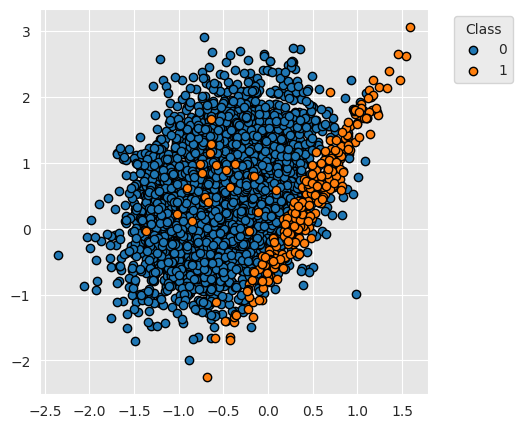

In [ ]:
fig_distribution

##### <font color = "black">8.3.1.1 Illustrative example_Bagging</font>



In [ ]:
%%capture
classifier = sklearn.ensemble.BaggingClassifier(estimator=sklearn.tree.DecisionTreeClassifier(max_depth=5,random_state=0),
                                                n_estimators=100,
                                                bootstrap=True,
                                                random_state=0)


(results_df_bagging, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier,
                                                                                 X, y,
                                                                                 n_splits=5,
                                                                                 strategy_name="Bagging")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
results_df_bagging

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Bagging,0.804+/-0.011,0.049+/-0.006,0.943+/-0.01,0.597+/-0.07,0.748+/-0.041


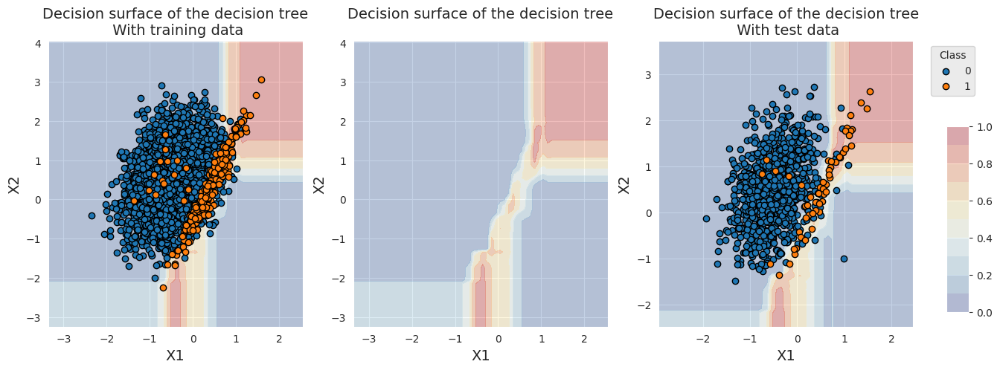

In [ ]:
fig_decision_boundary

###### <font color = "blue">8.3.1.1.1 Illustrative example_Bagging_Balanced Bagging</font>



In [ ]:
%%capture
classifier = imblearn.ensemble.BalancedBaggingClassifier(estimator=sklearn.tree.DecisionTreeClassifier(max_depth=5,random_state=0),
                                                         n_estimators=100,
                                                         sampling_strategy=1,
                                                         bootstrap=True,
                                                         sampler=imblearn.under_sampling.RandomUnderSampler(),
                                                         random_state=0)


(results_df_balanced_bagging, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier,
                                                                                          X, y,
                                                                                          n_splits=5,
                                                                                          strategy_name="Balanced bagging")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
pd.concat([results_df_bagging,
           results_df_balanced_bagging])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Bagging,0.804+/-0.011,0.049+/-0.006,0.943+/-0.01,0.597+/-0.07,0.748+/-0.041
Balanced bagging,0.574+/-0.125,0.113+/-0.021,0.947+/-0.01,0.586+/-0.058,0.92+/-0.013


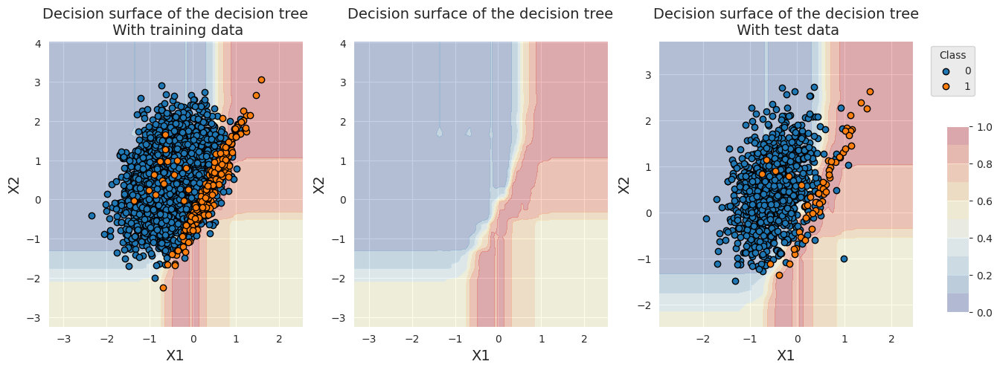

In [ ]:
fig_decision_boundary

##### <font color = "black">8.3.1.2 Illustrative example_Random forest</font>



In [ ]:
%%capture
classifier = sklearn.ensemble.RandomForestClassifier(n_estimators=100,
                                                     max_depth=5,
                                                     random_state=0)

(results_df_rf, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier,
                                                                            X, y,
                                                                            n_splits=5,
                                                                            strategy_name="Random forest")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
pd.concat([results_df_bagging,
           results_df_balanced_bagging,
           results_df_rf])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Bagging,0.804+/-0.011,0.049+/-0.006,0.943+/-0.01,0.597+/-0.07,0.748+/-0.041
Balanced bagging,0.574+/-0.125,0.113+/-0.021,0.947+/-0.01,0.586+/-0.058,0.92+/-0.013
Random forest,0.694+/-0.126,0.037+/-0.01,0.933+/-0.016,0.593+/-0.087,0.672+/-0.022


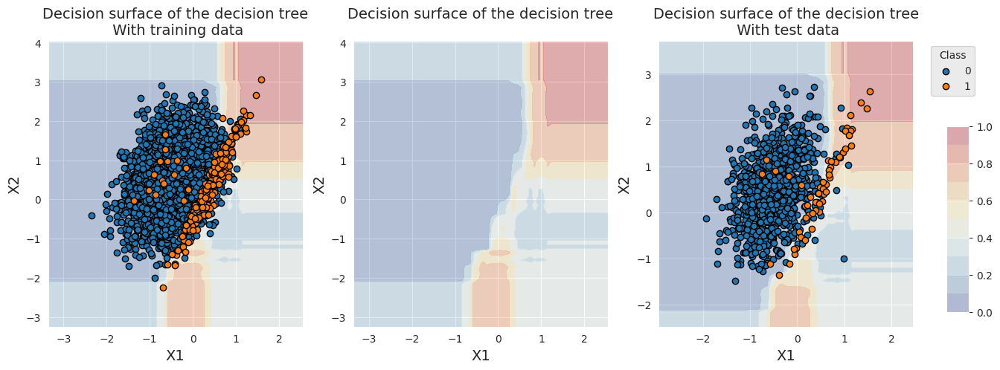

In [ ]:
fig_decision_boundary

###### <font color = "blue">8.3.1.2.1 Illustrative example_Random forest_Balanced random forest</font>



In [ ]:
%%capture
classifier = imblearn.ensemble.BalancedRandomForestClassifier(n_estimators=100,
                                                              sampling_strategy=1,
                                                              max_depth=5,
                                                              random_state=0)

(results_df_rf_balanced, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier,
                                                                                     X, y,
                                                                                     n_splits=5,
                                                                                     strategy_name="Balanced random forest")


fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
pd.concat([results_df_bagging,
           results_df_balanced_bagging,
           results_df_rf,
           results_df_rf_balanced])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Bagging,0.804+/-0.011,0.049+/-0.006,0.943+/-0.01,0.597+/-0.07,0.748+/-0.041
Balanced bagging,0.574+/-0.125,0.113+/-0.021,0.947+/-0.01,0.586+/-0.058,0.92+/-0.013
Random forest,0.694+/-0.126,0.037+/-0.01,0.933+/-0.016,0.593+/-0.087,0.672+/-0.022
Balanced random forest,0.332+/-0.01,0.029+/-0.003,0.943+/-0.01,0.586+/-0.062,0.916+/-0.014


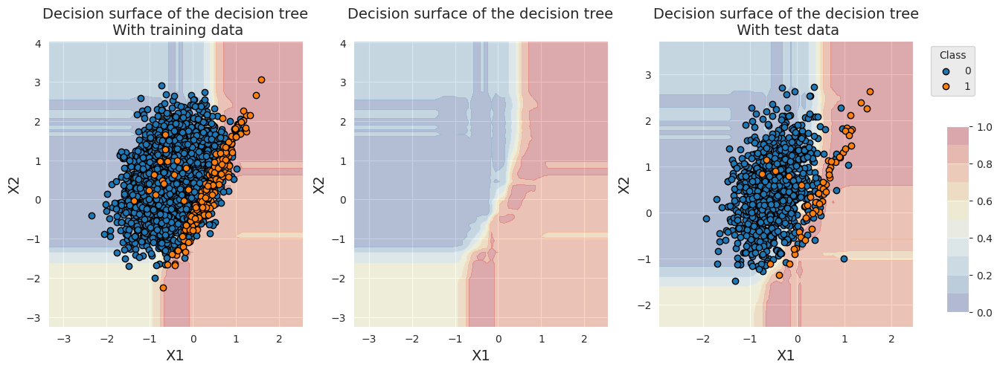

In [ ]:
fig_decision_boundary

##### <font color = "black">8.3.1.3 Illustrative example_XGBoost</font>



In [ ]:
%%capture
classifier = xgboost.XGBClassifier(n_estimators=100,
                                   max_depth=6,
                                   learning_rate=0.3,
                                   random_state=0)

(results_df_xgboost, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier,
                                                                                 X, y,
                                                                                 n_splits=5,
                                                                                 strategy_name="XGBoost")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
pd.concat([results_df_bagging,
           results_df_balanced_bagging,
           results_df_rf,
           results_df_rf_balanced,
           results_df_xgboost])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Bagging,0.804+/-0.011,0.049+/-0.006,0.943+/-0.01,0.597+/-0.07,0.748+/-0.041
Balanced bagging,0.574+/-0.125,0.113+/-0.021,0.947+/-0.01,0.586+/-0.058,0.92+/-0.013
Random forest,0.694+/-0.126,0.037+/-0.01,0.933+/-0.016,0.593+/-0.087,0.672+/-0.022
Balanced random forest,0.332+/-0.01,0.029+/-0.003,0.943+/-0.01,0.586+/-0.062,0.916+/-0.014
XGBoost,0.082+/-0.042,0.015+/-0.004,0.953+/-0.011,0.584+/-0.055,0.764+/-0.035


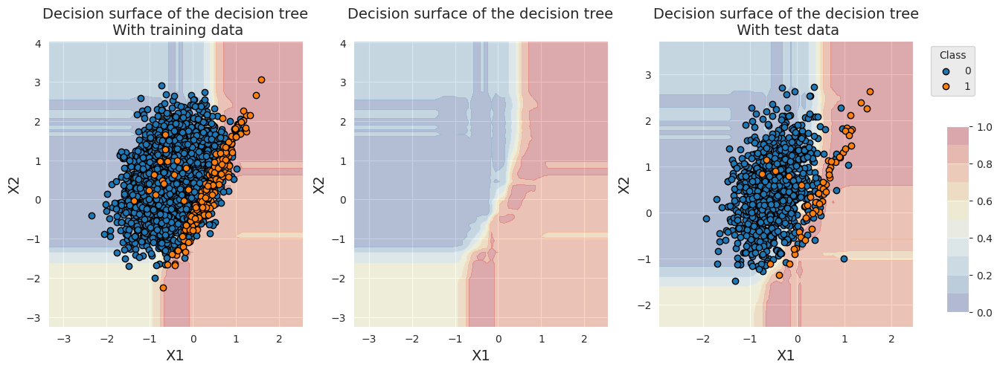

In [ ]:
fig_decision_boundary

###### <font color = "blue">8.3.1.3.1 Illustrative example_XGBoost_Weighted XGBoost</font>



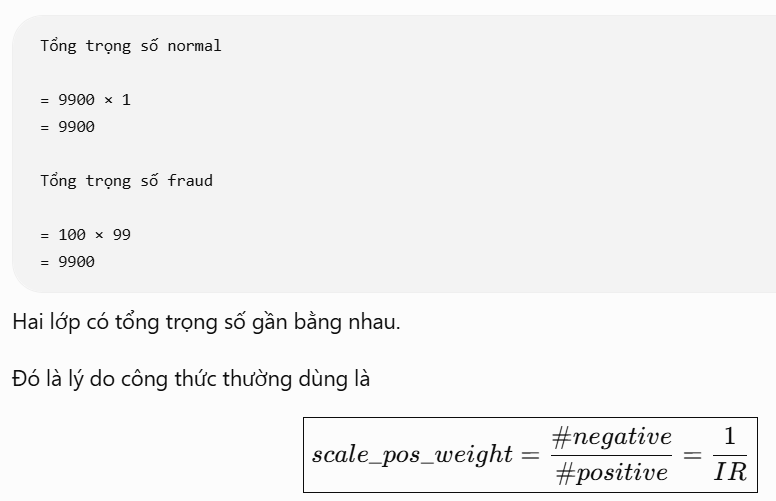

In [ ]:
IR=0.05/0.95
IR

0.052631578947368425

In [ ]:
%%capture
classifier = xgboost.XGBClassifier(n_estimators=100,
                                   max_depth=6,
                                   learning_rate=0.3,
                                   scale_pos_weight=1/IR,
                                   random_state=0)

(results_df_weighted_xgboost, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier,
                                                                                          X, y,
                                                                                          n_splits=5,
                                                                                          strategy_name="Weighted XGBoost")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
pd.concat([results_df_bagging,
           results_df_balanced_bagging,
           results_df_rf,
           results_df_rf_balanced,
           results_df_xgboost,
           results_df_weighted_xgboost])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Bagging,0.804+/-0.011,0.049+/-0.006,0.943+/-0.01,0.597+/-0.07,0.748+/-0.041
Balanced bagging,0.574+/-0.125,0.113+/-0.021,0.947+/-0.01,0.586+/-0.058,0.92+/-0.013
Random forest,0.694+/-0.126,0.037+/-0.01,0.933+/-0.016,0.593+/-0.087,0.672+/-0.022
Balanced random forest,0.332+/-0.01,0.029+/-0.003,0.943+/-0.01,0.586+/-0.062,0.916+/-0.014
XGBoost,0.082+/-0.042,0.015+/-0.004,0.953+/-0.011,0.584+/-0.055,0.764+/-0.035
Weighted XGBoost,0.52+/-0.299,0.045+/-0.045,0.953+/-0.006,0.583+/-0.044,0.869+/-0.021


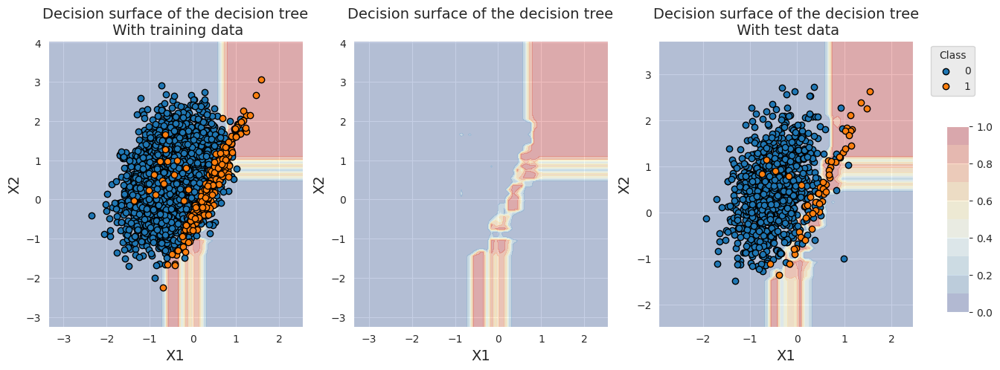

In [ ]:
fig_decision_boundary

### <font color = "grey">8.3.2 Transaction data</font>



##### <font color = "black">8.3.2.1 Transaction data_Load data</font>



In [ ]:
# Load data from the 2018-07-11 to the 2018-09-14

DIR_INPUT = '2_Fraud-detection-handbook_simulated-data-transformed/data/'

BEGIN_DATE = "2018-06-11"
END_DATE = "2018-09-14"

print("Load  files")
%time transactions_df = read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))


# Number of folds for the prequential validation
n_folds = 4

# Set the starting day for the training period, and the deltas
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train = delta_delay = delta_test = delta_valid = delta_assessment = 7

start_date_training_for_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))
start_date_training_for_test = start_date_training+datetime.timedelta(days=(n_folds-1)*delta_test)

output_feature = "TX_FRAUD"

input_features = ['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']


# Only keep columns that are needed as argument to the custom scoring function
# (in order to reduce the serialization time of transaction dataset)
transactions_df_scorer = transactions_df[['CUSTOMER_ID', 'TX_FRAUD','TX_TIME_DAYS']]

card_precision_top_100 = sklearn.metrics.make_scorer(card_precision_top_k_custom,
                                                     response_method="predict_proba",
                                                     top_k=100,
                                                     transactions_df=transactions_df_scorer)

performance_metrics_list_grid = ['roc_auc', 'average_precision', 'card_precision@100']
performance_metrics_list = ['AUC ROC', 'Average precision', 'Card Precision@100']

scoring = {'roc_auc':'roc_auc',
           'average_precision': 'average_precision',
           'card_precision@100': card_precision_top_100,
           }

Load  files
CPU times: user 669 ms, sys: 678 ms, total: 1.35 s
Wall time: 1.86 s
919767 transactions loaded, containing 8195 fraudulent transactions


##### <font color = "black">8.3.2.2 Transaction data_Baseline</font>



In [ ]:
#### Bagging
# Define classifier
classifier = sklearn.ensemble.BaggingClassifier()

# Set of parameters for which to assess model performances
parameters = {'clf__estimator':[sklearn.tree.DecisionTreeClassifier(max_depth=20,random_state=0)],
              'clf__bootstrap':[True],
              'clf__n_estimators':[100],
              'clf__random_state':[0],
              'clf__n_jobs':[-1]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper(transactions_df, classifier,
                                        input_features, output_feature,
                                        parameters, scoring,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train,
                                        delta_delay=delta_delay,
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_baseline_bagging = time.time()-start_time

# Select parameter of interest (n_estimators)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['clf__n_estimators'] for i in range(len(parameters_dict))]

# Rename to performances_df_baseline_bagging for model performance comparison later in this section
performances_df_baseline_bagging=performances_df

In [ ]:
summary_performances_baseline_bagging=get_summary_performances(performances_df_baseline_bagging, parameter_column_name="Parameters summary")
summary_performances_baseline_bagging

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,100,100,100
Validation performance,0.872+/-0.01,0.704+/-0.01,0.284+/-0.01
Test performance,0.856+/-0.02,0.678+/-0.01,0.293+/-0.01
Optimal parameter(s),100,100,100
Optimal test performance,0.856+/-0.02,0.678+/-0.01,0.293+/-0.01


In [ ]:
#### Random forest
# Define classifier
classifier = sklearn.ensemble.RandomForestClassifier()

parameters = {'clf__max_depth':[20],
              'clf__n_estimators':[100],
              'clf__random_state':[0],
              'clf__n_jobs':[-1]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper(transactions_df, classifier,
                                        input_features, output_feature,
                                        parameters, scoring,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train,
                                        delta_delay=delta_delay,
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_baseline_rf = time.time()-start_time

# Select parameter of interest (n_estimators)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['clf__n_estimators'] for i in range(len(parameters_dict))]

# Rename to performances_df_baseline_rf for model performance comparison later in this section
performances_df_baseline_rf=performances_df

In [ ]:
summary_performances_baseline_rf=get_summary_performances(performances_df_baseline_rf, parameter_column_name="Parameters summary")
summary_performances_baseline_rf

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,100,100,100
Validation performance,0.88+/-0.01,0.694+/-0.02,0.289+/-0.02
Test performance,0.87+/-0.02,0.678+/-0.01,0.299+/-0.01
Optimal parameter(s),100,100,100
Optimal test performance,0.87+/-0.02,0.678+/-0.01,0.299+/-0.01


In [ ]:
#### XGBoost
# Define classifier
classifier = xgboost.XGBClassifier()

parameters = {'clf__max_depth':[3],
              'clf__n_estimators':[50],
              'clf__learning_rate':[0.3],
              'clf__random_state':[0],
              'clf__n_jobs':[-1]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper(transactions_df, classifier,
                                        input_features, output_feature,
                                        parameters, scoring,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train,
                                        delta_delay=delta_delay,
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_baseline_xgboost = time.time()-start_time

# Select parameter of interest (n_estimators)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['clf__n_estimators'] for i in range(len(parameters_dict))]

# Rename to performances_df_baseline_xgboost for model performance comparison later in this section
performances_df_baseline_xgboost=performances_df

In [ ]:
summary_performances_baseline_xgboost=get_summary_performances(performances_df_baseline_xgboost, parameter_column_name="Parameters summary")
summary_performances_baseline_xgboost

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,50,50,50
Validation performance,0.87+/-0.01,0.641+/-0.02,0.28+/-0.01
Test performance,0.855+/-0.02,0.602+/-0.02,0.287+/-0.01
Optimal parameter(s),50,50,50
Optimal test performance,0.855+/-0.02,0.602+/-0.02,0.287+/-0.01


In [ ]:
summary_test_performances = pd.concat([summary_performances_baseline_bagging.iloc[2,:],
                                       summary_performances_baseline_rf.iloc[2,:],
                                       summary_performances_baseline_xgboost.iloc[2,:],
                                      ],axis=1)
summary_test_performances.columns=['Baseline Bagging', 'Baseline RF', 'Baseline XGBoost']
summary_test_performances

,Baseline Bagging,Baseline RF,Baseline XGBoost
AUC ROC,0.856+/-0.02,0.87+/-0.02,0.855+/-0.02
Average precision,0.678+/-0.01,0.678+/-0.01,0.602+/-0.02
Card Precision@100,0.293+/-0.01,0.299+/-0.01,0.287+/-0.01


##### <font color = "black">8.3.2.3 Transaction data_Balanced bagging</font>



In [ ]:
# Define classifier
classifier = imblearn.ensemble.BalancedBaggingClassifier()

# Set of parameters for which to assess model performances
parameters = {'clf__estimator':[sklearn.tree.DecisionTreeClassifier(max_depth=20,random_state=0)],
              'clf__n_estimators':[100],
              'clf__sampling_strategy':[0.02, 0.05, 0.1, 0.5, 1],
              'clf__bootstrap':[True],
              'clf__sampler':[imblearn.under_sampling.RandomUnderSampler()],
              'clf__random_state':[0],
              'clf__n_jobs':[-1]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper(transactions_df, classifier,
                                        input_features, output_feature,
                                        parameters, scoring,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train,
                                        delta_delay=delta_delay,
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=1)

execution_time_balanced_bagging = time.time()-start_time

In [ ]:
# Select parameter of interest (sampling_strategy)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['clf__sampling_strategy'] for i in range(len(parameters_dict))]

# Rename to performances_df_balanced_bagging for model performance comparison later in this section
performances_df_balanced_bagging=performances_df

In [ ]:
performances_df_balanced_bagging

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.869210,0.020009,0.679963,0.011158,0.298571,0.010051,"{'clf__bootstrap': True, 'clf__estimator': Dec...",56.382576,0.875647,0.009589,0.704491,0.014563,0.287143,0.014604,0.02
1,0.875633,0.018669,0.679319,0.007153,0.301071,0.010369,"{'clf__bootstrap': True, 'clf__estimator': Dec...",22.717731,0.877413,0.008182,0.700732,0.017898,0.286786,0.015856,0.05
2,0.876615,0.016223,0.676736,0.008302,0.304643,0.010369,"{'clf__bootstrap': True, 'clf__estimator': Dec...",12.379614,0.878204,0.002966,0.699331,0.018432,0.289286,0.015698,0.10
3,0.878820,0.013479,0.652480,0.021309,0.305357,0.012387,"{'clf__bootstrap': True, 'clf__estimator': Dec...",5.533061,0.880359,0.004692,0.657772,0.022306,0.287857,0.017800,0.50
4,0.877183,0.013837,0.631045,0.029855,0.301786,0.012592,"{'clf__bootstrap': True, 'clf__estimator': Dec...",4.396645,0.877335,0.003365,0.643261,0.022129,0.289286,0.017098,1.00


In [ ]:
summary_performances_balanced_bagging = get_summary_performances(performances_df_balanced_bagging, parameter_column_name="Parameters summary")
summary_performances_balanced_bagging

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.5,0.02,0.1
Validation performance,0.88+/-0.0,0.704+/-0.01,0.289+/-0.02
Test performance,0.879+/-0.01,0.68+/-0.01,0.305+/-0.01
Optimal parameter(s),0.5,0.02,0.5
Optimal test performance,0.879+/-0.01,0.68+/-0.01,0.305+/-0.01


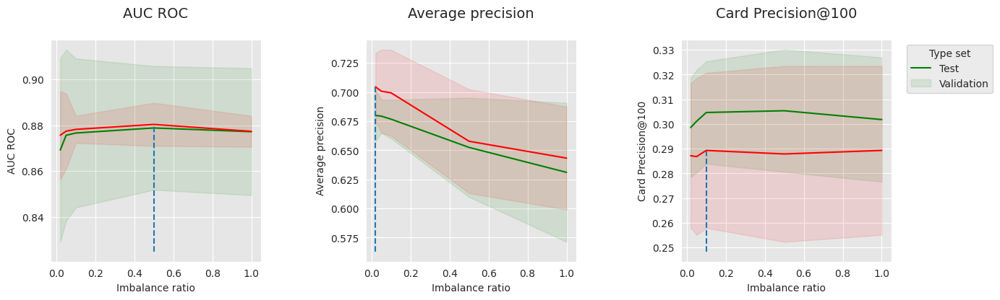

In [ ]:
get_performances_plots(performances_df_balanced_bagging,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Imbalance ratio",
                       summary_performances=summary_performances_balanced_bagging)

In [ ]:
summary_test_performances = pd.concat([summary_performances_baseline_bagging.iloc[2,:],
                                       summary_performances_balanced_bagging.iloc[2,:]
                                      ],axis=1)
summary_test_performances.columns=['Baseline Bagging', 'Balanced Bagging']
summary_test_performances

,Baseline Bagging,Balanced Bagging
AUC ROC,0.856+/-0.02,0.879+/-0.01
Average precision,0.678+/-0.01,0.68+/-0.01
Card Precision@100,0.293+/-0.01,0.305+/-0.01


##### <font color = "black">8.3.2.4 Transaction data_Balanced Random Forest</font>



In [ ]:
# Define classifier
classifier = imblearn.ensemble.BalancedRandomForestClassifier()

parameters = {'clf__max_depth':[20],
              'clf__n_estimators':[100],
              'clf__sampling_strategy':[0.01, 0.05, 0.1, 0.5, 1],
              'clf__random_state':[0],
              'clf__n_jobs':[-1]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper(transactions_df, classifier,
                                        input_features, output_feature,
                                        parameters, scoring,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train,
                                        delta_delay=delta_delay,
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_rf_balanced = time.time()-start_time

In [ ]:
# Select parameter of interest (sampling_strategy)
parameters_dict = dict(performances_df['Parameters'])
performances_df['Parameters summary'] = [parameters_dict[i]['clf__sampling_strategy'] for i in range(len(parameters_dict))]

# Rename to performances_df_balanced_rf for model performance comparison later in this section
performances_df_balanced_rf=performances_df

In [ ]:
performances_df_balanced_rf

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.877496,0.014800,0.676937,0.012308,0.302143,0.011888,"{'clf__max_depth': 20, 'clf__n_estimators': 10...",61.769912,0.879690,0.008709,0.686844,0.019423,0.288929,0.015064,0.01
1,0.874017,0.019024,0.659921,0.017151,0.303214,0.012469,"{'clf__max_depth': 20, 'clf__n_estimators': 10...",11.369115,0.880321,0.004822,0.677191,0.024793,0.288571,0.015485,0.05
2,0.878261,0.017870,0.644069,0.024449,0.301071,0.012912,"{'clf__max_depth': 20, 'clf__n_estimators': 10...",7.741065,0.880782,0.006029,0.666400,0.023806,0.290357,0.016456,0.10
3,0.878179,0.011872,0.608630,0.035814,0.302143,0.014932,"{'clf__max_depth': 20, 'clf__n_estimators': 10...",4.098496,0.876333,0.002774,0.609805,0.034219,0.288571,0.016382,0.50
4,0.874313,0.011885,0.574228,0.035818,0.299643,0.012792,"{'clf__max_depth': 20, 'clf__n_estimators': 10...",4.014982,0.875109,0.003654,0.577979,0.031552,0.285357,0.017565,1.00


In [ ]:
summary_performances_balanced_rf=get_summary_performances(performances_df=performances_df_balanced_rf, parameter_column_name="Parameters summary")
summary_performances_balanced_rf

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.1,0.01,0.1
Validation performance,0.881+/-0.01,0.687+/-0.02,0.29+/-0.02
Test performance,0.878+/-0.02,0.677+/-0.01,0.301+/-0.01
Optimal parameter(s),0.1,0.01,0.05
Optimal test performance,0.878+/-0.02,0.677+/-0.01,0.303+/-0.01


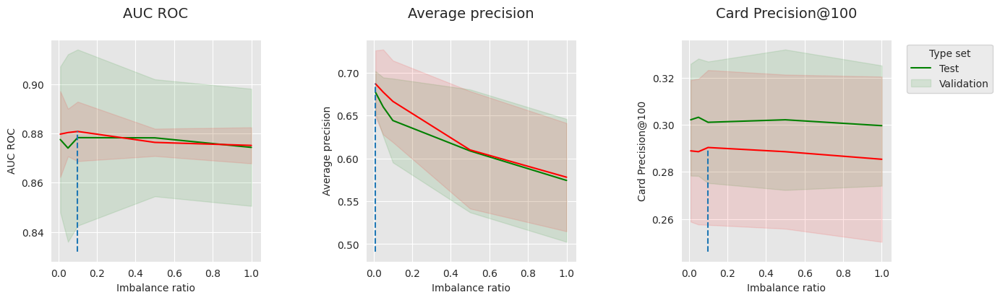

In [ ]:
get_performances_plots(performances_df_balanced_rf,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Imbalance ratio",
                       summary_performances=summary_performances_balanced_rf)

In [ ]:
summary_test_performances = pd.concat([summary_performances_baseline_rf.iloc[2,:],
                                       summary_performances_balanced_rf.iloc[2,:]
                                      ],axis=1)
summary_test_performances.columns=['Baseline RF', 'Balanced RF']
summary_test_performances

,Baseline RF,Balanced RF
AUC ROC,0.87+/-0.02,0.878+/-0.02
Average precision,0.678+/-0.01,0.677+/-0.01
Card Precision@100,0.299+/-0.01,0.301+/-0.01


##### <font color = "black">8.3.2.5 Transaction data_Weighted XGBoost</font>



In [ ]:
classifier = xgboost.XGBClassifier()

parameters = {'clf__max_depth':[3],
              'clf__n_estimators':[50],
              'clf__learning_rate':[0.3],
              'clf__scale_pos_weight':[1,5,10,50,100],
              'clf__random_state':[0],
              'clf__n_jobs':[-1]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper(transactions_df, classifier,
                                        input_features, output_feature,
                                        parameters, scoring,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train,
                                        delta_delay=delta_delay,
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_weighted_xgboost = time.time()-start_time

In [ ]:
# Select parameter of interest (scale_pos_weight)
parameters_dict = dict(performances_df['Parameters'])
performances_df['Parameters summary'] = [parameters_dict[i]['clf__scale_pos_weight'] for i in range(len(parameters_dict))]

# Rename to performances_df_weighted_xgboost for model performance comparison later in this section
performances_df_weighted_xgboost=performances_df

In [ ]:
performances_df_weighted_xgboost

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.855226,0.024465,0.602173,0.016975,0.287143,0.010152,"{'clf__learning_rate': 0.3, 'clf__max_depth': ...",0.644732,0.869906,0.007125,0.640816,0.018232,0.280357,0.011129,1
1,0.869050,0.012109,0.625999,0.007446,0.299643,0.012138,"{'clf__learning_rate': 0.3, 'clf__max_depth': ...",0.757344,0.881497,0.005405,0.652524,0.015811,0.287857,0.017098,5
2,0.868122,0.014129,0.617565,0.006551,0.296786,0.010708,"{'clf__learning_rate': 0.3, 'clf__max_depth': ...",1.156828,0.880041,0.008134,0.651929,0.013055,0.288214,0.017390,10
3,0.862813,0.011232,0.598287,0.006488,0.291786,0.008353,"{'clf__learning_rate': 0.3, 'clf__max_depth': ...",0.955441,0.880182,0.008964,0.626454,0.016093,0.287143,0.014812,50
4,0.859350,0.009817,0.590225,0.003143,0.291071,0.007240,"{'clf__learning_rate': 0.3, 'clf__max_depth': ...",0.657417,0.876493,0.007750,0.620413,0.014923,0.283214,0.013604,100


In [ ]:
summary_performances_weighted_xgboost=get_summary_performances(performances_df=performances_df_weighted_xgboost, parameter_column_name="Parameters summary")
summary_performances_weighted_xgboost

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,5,5,10
Validation performance,0.881+/-0.01,0.653+/-0.02,0.288+/-0.02
Test performance,0.869+/-0.01,0.626+/-0.01,0.297+/-0.01
Optimal parameter(s),5,5,5
Optimal test performance,0.869+/-0.01,0.626+/-0.01,0.3+/-0.01


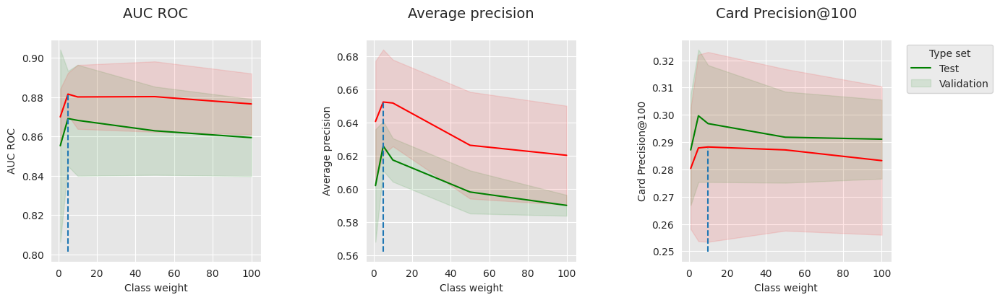

In [ ]:
get_performances_plots(performances_df_weighted_xgboost,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Class weight",
                       summary_performances=summary_performances_weighted_xgboost)

In [ ]:
summary_test_performances = pd.concat([summary_performances_baseline_xgboost.iloc[2,:],
                                       summary_performances_weighted_xgboost.iloc[2,:]
                                      ],axis=1)
summary_test_performances.columns=['Baseline XGBoost', 'Weighted XGBoost']
summary_test_performances

,Baseline XGBoost,Weighted XGBoost
AUC ROC,0.855+/-0.02,0.869+/-0.01
Average precision,0.602+/-0.02,0.626+/-0.01
Card Precision@100,0.287+/-0.01,0.297+/-0.01


### <font color = "grey">8.3.3 Summary</font>



In [ ]:
summary_test_performances = pd.concat([summary_performances_baseline_bagging.iloc[2,:],
                                       summary_performances_balanced_bagging.iloc[2,:],
                                       summary_performances_baseline_rf.iloc[2,:],
                                       summary_performances_balanced_rf.iloc[2,:],
                                       summary_performances_baseline_xgboost.iloc[2,:],
                                       summary_performances_weighted_xgboost.iloc[2,:],
                                      ],axis=1)
summary_test_performances.columns=['Baseline Bagging', 'Balanced Bagging',
                                   'Baseline RF', 'Balanced RF',
                                   'Baseline XGBoost', 'Weighted XGBoost']

In [ ]:
summary_test_performances

,Baseline Bagging,Balanced Bagging,Baseline RF,Balanced RF,Baseline XGBoost,Weighted XGBoost
AUC ROC,0.856+/-0.02,0.879+/-0.01,0.87+/-0.02,0.878+/-0.02,0.855+/-0.02,0.869+/-0.01
Average precision,0.678+/-0.01,0.68+/-0.01,0.678+/-0.01,0.677+/-0.01,0.602+/-0.02,0.626+/-0.01
Card Precision@100,0.293+/-0.01,0.305+/-0.01,0.299+/-0.01,0.301+/-0.01,0.287+/-0.01,0.297+/-0.01


### <font color = "grey">8.3.4 Saving of results</font>



In [ ]:
performances_df_dictionary={
    "Baseline Bagging": performances_df_baseline_bagging,
    "Baseline RF": performances_df_baseline_rf,
    "Baseline XGBoost": performances_df_baseline_xgboost,
    "Balanced Bagging": performances_df_balanced_bagging,
    "Balanced RF": performances_df_balanced_rf,
    "Weighted XGBoost": performances_df_weighted_xgboost
}

execution_times=[execution_time_baseline_bagging,
                 execution_time_baseline_rf,
                 execution_time_baseline_xgboost,
                 execution_time_balanced_bagging,
                 execution_time_rf_balanced,
                 execution_time_weighted_xgboost
                 ]

In [ ]:
filehandler = open('performances_ensembles.pkl', 'wb')
pickle.dump((performances_df_dictionary, execution_times), filehandler)
filehandler.close()

# <font color = "FF6666">9. Deep learning</font>

### <font color = "green">9.1 Feed-forward neural network</font>



### <font color = "grey">9.1.1 Data Loading</font>



In [ ]:
DIR_INPUT= '2_Fraud-detection-handbook_simulated-data-transformed/data/'

BEGIN_DATE = "2018-06-11"
END_DATE = "2018-09-14"

print("Load  files")
%time transactions_df=read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))

output_feature="TX_FRAUD"

input_features=['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']

Load  files
CPU times: user 355 ms, sys: 255 ms, total: 609 ms
Wall time: 929 ms
919767 transactions loaded, containing 8195 fraudulent transactions


In [ ]:
# Setting the starting day for the training period, and the deltas
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train=7
delta_delay=7
delta_test=7
(train_df, test_df)=get_train_test_set(transactions_df,start_date_training,
                                       delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_test)
# By default, scaling the input data
(train_df, test_df)=scaleData(train_df,test_df,input_features)

### <font color = "grey">9.1.2 Overview of the neural network pipeline</font>



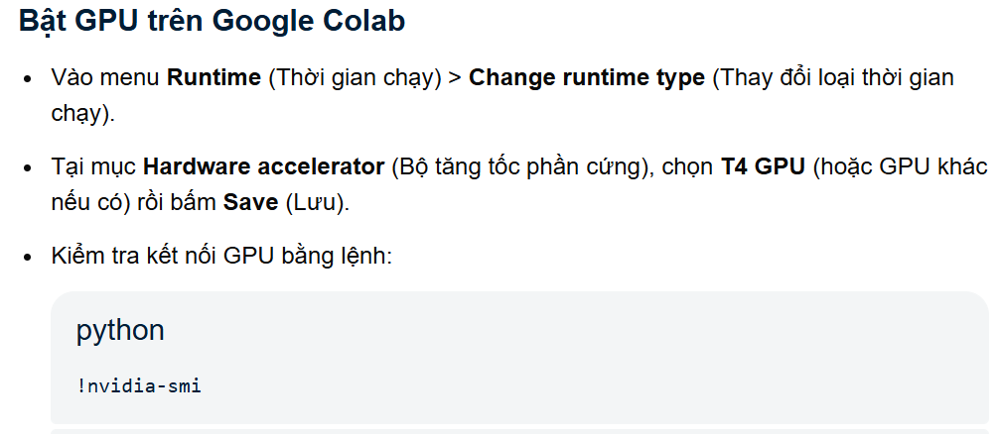

In [ ]:
!nvidia-smi

Wed Aug  5 07:16:34 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   57C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
if torch.cuda.is_available():
    DEVICE = "cuda"
else:
    DEVICE = "cpu"
print("Selected device is",DEVICE)

Selected device is cuda


In [ ]:
SEED = 42

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True

seed_everything(SEED)

##### <font color = "black">9.1.2.1 Overview of the neural network pipeline_Data management: Datasets and Dataloaders</font>



In [ ]:
x_train = torch.FloatTensor(train_df[input_features].values)
x_test = torch.FloatTensor(test_df[input_features].values)
y_train = torch.FloatTensor(train_df[output_feature].values)
y_test = torch.FloatTensor(test_df[output_feature].values)

In [ ]:
class FraudDataset(torch.utils.data.Dataset):

    def __init__(self, x, y):
        'Initialization'
        self.x = x
        self.y = y

    def __len__(self):
        'Returns the total number of samples'
        return len(self.x)

    def __getitem__(self, index):
        'Generates one sample of data'
        # Select sample index
        if self.y is not None:
            return self.x[index].to(DEVICE), self.y[index].to(DEVICE)
        else:
            return self.x[index].to(DEVICE)

In [ ]:
train_loader_params = {'batch_size': 64,
          'shuffle': True,
          'num_workers': 0}
test_loader_params = {'batch_size': 64,
          'num_workers': 0}

# Generators

training_set = FraudDataset(x_train, y_train)

testing_set = FraudDataset(x_test, y_test)


training_generator = torch.utils.data.DataLoader(training_set, **train_loader_params)
testing_generator = torch.utils.data.DataLoader(testing_set, **test_loader_params)

##### <font color = "black">9.1.2.2 Overview of the neural network pipeline_The model aka the module</font>



In [ ]:
%%capture

fig_activation, axs = plt.subplots(3, 2,figsize=(11, 13))

input_values = torch.arange(-5, 5, 0.05)

#linear activation
output_values = input_values
axs[0, 0].plot(input_values, output_values)
axs[0, 0].set_title('Linear')
axs[0, 0].set_ylim([-5.1,5.1])

#heavyside activation
output_values = input_values>0
axs[0, 1].plot(input_values, output_values)
axs[0, 1].set_title('Heavyside (perceptron)')
axs[0, 1].set_ylim([-0.1,1.1])

#sigmoid activation
activation = torch.nn.Sigmoid()
output_values = activation(input_values)
axs[1, 0].plot(input_values, output_values)
axs[1, 0].set_title('Sigmoid')
axs[1, 0].set_ylim([-1.1,1.1])

#tanh activation
activation = torch.nn.Tanh()
output_values = activation(input_values)
axs[1, 1].plot(input_values, output_values)
axs[1, 1].set_title('Tanh')
axs[1, 1].set_ylim([-1.1,1.1])

#relu activation
activation = torch.nn.ReLU()
output_values = activation(input_values)
axs[2, 0].plot(input_values, output_values)
axs[2, 0].set_title('ReLU')
axs[2, 0].set_ylim([-0.5,5.1])

#leaky relu activation
activation = torch.nn.LeakyReLU(negative_slope=0.05)
output_values = activation(input_values)
axs[2, 1].plot(input_values, output_values)
axs[2, 1].set_title('Leaky ReLU')
axs[2, 1].set_ylim([-0.5,5.1])

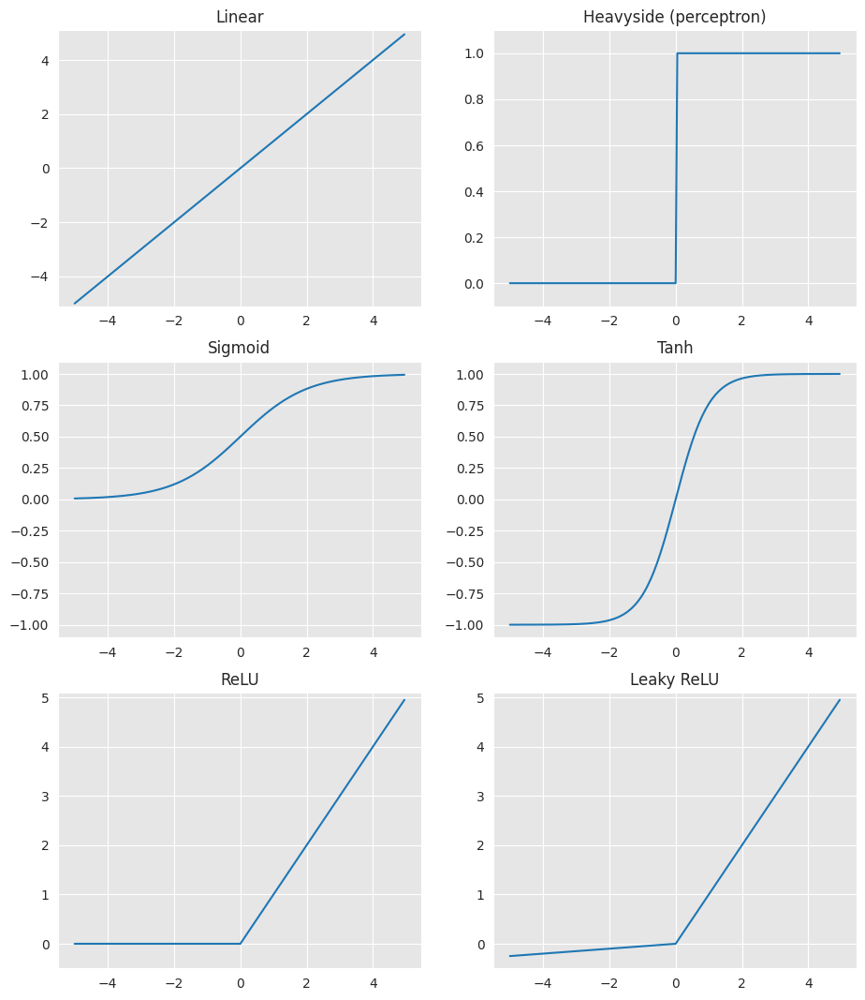

In [ ]:
fig_activation

In [ ]:
class SimpleFraudMLP(torch.nn.Module):

        def __init__(self, input_size, hidden_size):
            super(SimpleFraudMLP, self).__init__()
            # parameters
            self.input_size = input_size
            self.hidden_size  = hidden_size

            #input to hidden
            self.fc1 = torch.nn.Linear(self.input_size, self.hidden_size)
            self.relu = torch.nn.ReLU()
            #hidden to output
            self.fc2 = torch.nn.Linear(self.hidden_size, 1)
            self.sigmoid = torch.nn.Sigmoid()

        def forward(self, x):

            hidden = self.fc1(x)
            relu = self.relu(hidden)
            output = self.fc2(relu)
            output = self.sigmoid(output)

            return output

In [ ]:
model = SimpleFraudMLP(len(input_features), 1000).to(DEVICE)

##### <font color = "black">9.1.2.3 Overview of the neural network pipeline_The optimizer and the training loop</font>



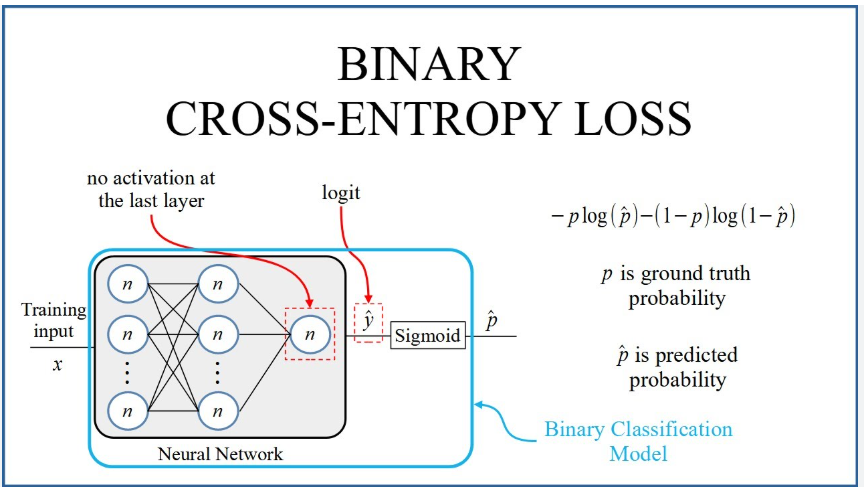

In [ ]:
criterion = torch.nn.BCELoss().to(DEVICE)

In [ ]:
model.eval()

SimpleFraudMLP(
  (fc1): Linear(in_features=15, out_features=1000, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=1000, out_features=1, bias=True)
  (sigmoid): Sigmoid()
)

In [ ]:
def evaluate_model(model,generator,criterion):
    model.eval()
    batch_losses = []
    for x_batch, y_batch in generator:
        # Forward pass
        y_pred = model(x_batch)
        # Compute Loss
        loss = criterion(y_pred.squeeze(), y_batch)
        batch_losses.append(loss.item())
    mean_loss = np.mean(batch_losses)
    return mean_loss

evaluate_model(model,testing_generator,criterion)

np.float64(0.6754083193748633)

In [ ]:
optimizer = torch.optim.SGD(model.parameters(), lr = 0.07)

In [ ]:
n_epochs = 150
#Setting the model in training mode
model.train()

#Training loop
start_time=time.time()
epochs_train_losses = []
epochs_test_losses = []
for epoch in range(n_epochs):
    model.train()
    train_loss=[]
    for x_batch, y_batch in training_generator:
        # Removing previously computed gradients
        optimizer.zero_grad()
        # Performing the forward pass on the current batch
        y_pred = model(x_batch)
        # Computing the loss given the current predictions
        loss = criterion(y_pred.squeeze(), y_batch)
        # Computing the gradients over the backward pass
        loss.backward()
        # Performing an optimization step from the current gradients
        optimizer.step()
        # Storing the current step's loss for display purposes
        train_loss.append(loss.item())

    #showing last training loss after each epoch
    epochs_train_losses.append(np.mean(train_loss))
    print('Epoch {}: train loss: {}'.format(epoch, np.mean(train_loss)))

    #evaluating the model on the test set after each epoch
    val_loss = evaluate_model(model,testing_generator,criterion)
    epochs_test_losses.append(val_loss)
    print('test loss: {}'.format(val_loss))
    print("")

training_execution_time=time.time()-start_time

Epoch 0: train loss: 0.035700161419197435
test loss: 0.022358749691564612

Epoch 1: train loss: 0.02628522449492926
test loss: 0.02114528402124872

Epoch 2: train loss: 0.0249354854019201
test loss: 0.021621913021700263

Epoch 3: train loss: 0.024153651537255807
test loss: 0.02016681444800012

Epoch 4: train loss: 0.023543032284646156
test loss: 0.020734393682804175

Epoch 5: train loss: 0.0231161036232458
test loss: 0.02028386024543535

Epoch 6: train loss: 0.022610568650023432
test loss: 0.01981479264453307

Epoch 7: train loss: 0.02242852954019382
test loss: 0.02150071828455371

Epoch 8: train loss: 0.021857453816544643
test loss: 0.022040685215038703

Epoch 9: train loss: 0.021729045292007233
test loss: 0.020336871479078717

Epoch 10: train loss: 0.02154080712012273
test loss: 0.01978718954328607

Epoch 11: train loss: 0.021363750544419205
test loss: 0.01933969370317957

Epoch 12: train loss: 0.021093989956922844
test loss: 0.02080311975863575

Epoch 13: train loss: 0.0208563650303

In [ ]:
ma_window = 10

plt.plot(np.arange(len(epochs_train_losses)-ma_window + 1)+1, np.convolve(epochs_train_losses, np.ones(ma_window)/ma_window, mode='valid'))
plt.plot(np.arange(len(epochs_test_losses)-ma_window + 1)+1, np.convolve(epochs_test_losses, np.ones(ma_window)/ma_window, mode='valid'))
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train','valid'])
#plt.ylim([0.01,0.06])

In [ ]:
print(training_execution_time)

In [ ]:
start_time=time.time()
predictions_test = model(x_test.to(DEVICE))
prediction_execution_time = time.time()-start_time
predictions_train = model(x_train.to(DEVICE))
print("Predictions took", prediction_execution_time,"seconds.")

In [ ]:
predictions_df=test_df
predictions_df['predictions']=predictions_test.detach().cpu().numpy()

performance_assessment(predictions_df, top_k_list=[100])

In [ ]:
delta_valid = delta_test

start_date_training_with_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))

(train_df, valid_df)=get_train_test_set(transactions_df,start_date_training_with_valid,
                                       delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_test)

# By default, scales input data
(train_df, valid_df)=scaleData(train_df, valid_df, input_features)

In [ ]:
class EarlyStopping:

    def __init__(self, patience=2, verbose=False):
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = np.inf

    def continue_training(self,current_score):
        if self.best_score > current_score:
            self.best_score = current_score
            self.counter = 0
            if self.verbose:
                print("New best score:", current_score)
        else:
            self.counter+=1
            if self.verbose:
                print(self.counter, " iterations since best score.")

        return self.counter <= self.patience

In [ ]:
seed_everything(SEED)

model = SimpleFraudMLP(len(input_features), 1000).to(DEVICE)

def prepare_generators(train_df,valid_df,batch_size=64):
    x_train = torch.FloatTensor(train_df[input_features].values)
    x_valid = torch.FloatTensor(valid_df[input_features].values)
    y_train = torch.FloatTensor(train_df[output_feature].values)
    y_valid = torch.FloatTensor(valid_df[output_feature].values)
    train_loader_params = {'batch_size': batch_size,
              'shuffle': True,
              'num_workers': 0}
    valid_loader_params = {'batch_size': batch_size,
              'num_workers': 0}
    # Generators

    training_set = FraudDataset(x_train, y_train)
    valid_set = FraudDataset(x_valid, y_valid)

    training_generator = torch.utils.data.DataLoader(training_set, **train_loader_params)
    valid_generator = torch.utils.data.DataLoader(valid_set, **valid_loader_params)

    return training_generator,valid_generator

training_generator,valid_generator = prepare_generators(train_df,valid_df,batch_size=64)

criterion = torch.nn.BCELoss().to(DEVICE)
optimizer = torch.optim.SGD(model.parameters(), lr = 0.0005)

In [ ]:
def training_loop(model,training_generator,valid_generator,optimizer,criterion,max_epochs=100,apply_early_stopping=True,patience=2,verbose=False):
    #Setting the model in training mode
    model.train()

    if apply_early_stopping:
        early_stopping = EarlyStopping(verbose=verbose,patience=patience)

    all_train_losses = []
    all_valid_losses = []

    #Training loop
    start_time=time.time()
    for epoch in range(max_epochs):
        model.train()
        train_loss=[]
        for x_batch, y_batch in training_generator:
            optimizer.zero_grad()
            y_pred = model(x_batch)
            loss = criterion(y_pred.squeeze(), y_batch)
            loss.backward()
            optimizer.step()
            train_loss.append(loss.item())

        #showing last training loss after each epoch
        all_train_losses.append(np.mean(train_loss))
        if verbose:
            print('')
            print('Epoch {}: train loss: {}'.format(epoch, np.mean(train_loss)))
        #evaluating the model on the test set after each epoch
        valid_loss = evaluate_model(model,valid_generator,criterion)
        all_valid_losses.append(valid_loss)
        if verbose:
            print('valid loss: {}'.format(valid_loss))
        if apply_early_stopping:
            if not early_stopping.continue_training(valid_loss):
                if verbose:
                    print("Early stopping")
                break

    training_execution_time=time.time()-start_time
    return model,training_execution_time,all_train_losses,all_valid_losses

model,training_execution_time,train_losses,valid_losses = training_loop(model,training_generator,valid_generator,optimizer,criterion,max_epochs=500,verbose=True)

In [ ]:
seed_everything(SEED)
model = SimpleFraudMLP(len(input_features), 1000).to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr = 0.0005)
model,training_execution_time,train_losses_adam,valid_losses_adam = training_loop(model,training_generator,valid_generator,optimizer,criterion,verbose=True)

In [ ]:
plt.subplot(1, 2, 1)
plt.plot(np.arange(len(train_losses))+1, train_losses)
plt.plot(np.arange(len(valid_losses))+1, valid_losses)
plt.title("SGD")
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train','valid'])
plt.ylim([0.01,0.06])

plt.subplot(1, 2, 2)
plt.plot(np.arange(len(train_losses_adam))+1, train_losses_adam)
plt.plot(np.arange(len(valid_losses_adam))+1, valid_losses_adam)
plt.title("ADAM")
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train','valid'])
plt.ylim([0.01,0.06])

### <font color = "grey">9.1.3 Regularization</font>



In [ ]:
class SimpleFraudMLPWithDropout(torch.nn.Module):

        def __init__(self, input_size, hidden_size,p):
            super(SimpleFraudMLPWithDropout, self).__init__()
            # parameters
            self.input_size = input_size
            self.hidden_size  = hidden_size
            self.p = p

            #input to hidden
            self.fc1 = torch.nn.Linear(self.input_size, self.hidden_size)
            self.relu = torch.nn.ReLU()
            #hidden to output
            self.fc2 = torch.nn.Linear(self.hidden_size, 1)
            self.sigmoid = torch.nn.Sigmoid()

            self.dropout = torch.nn.Dropout(self.p)

        def forward(self, x):

            hidden = self.fc1(x)
            hidden = self.relu(hidden)

            hidden = self.dropout(hidden)

            output = self.fc2(hidden)
            output = self.sigmoid(output)

            return output

In [ ]:
seed_everything(SEED)
model = SimpleFraudMLPWithDropout(len(input_features), 1000,0.2).to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr = 0.0005)
model,training_execution_time,train_losses_dropout,valid_losses_dropout = training_loop(model,training_generator,valid_generator,optimizer,criterion,verbose=False)

In [ ]:
plt.plot(np.arange(len(train_losses_adam))+1, train_losses_adam)
plt.plot(np.arange(len(valid_losses_adam))+1, valid_losses_adam)
plt.plot(np.arange(len(train_losses_dropout))+1, train_losses_dropout)
plt.plot(np.arange(len(valid_losses_dropout))+1, valid_losses_dropout)
plt.title("Dropout effect")
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train w/o dropout','valid w/o dropout','train w/ dropout','valid w/ dropout'])

### <font color = "grey">9.1.4 Scaling the inputs</font>



In [ ]:
(train_df, valid_df)=get_train_test_set(transactions_df,start_date_training_with_valid,
                                       delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_test)

In [ ]:
_ = plt.hist(train_df['TX_AMOUNT'].values,bins=20)

In [ ]:
_ = plt.hist(sklearn.preprocessing.StandardScaler().fit_transform(np.log1p(train_df['TX_AMOUNT'].values).reshape(-1, 1)),bins=20)

In [ ]:
#we did not call the function scaleData this time
seed_everything(SEED)
training_generator,valid_generator = prepare_generators(train_df,valid_df,batch_size=64)

model = SimpleFraudMLPWithDropout(len(input_features), 1000,0.2).to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr = 0.0001)
model,training_execution_time,train_losses_without_scaling,valid_losses_without_scaling = training_loop(model,training_generator,valid_generator,optimizer,criterion,verbose=False)

In [ ]:
plt.plot(np.arange(len(train_losses_without_scaling))+1, train_losses_without_scaling)
plt.plot(np.arange(len(valid_losses_without_scaling))+1, valid_losses_without_scaling)
plt.plot(np.arange(len(train_losses_dropout))+1, train_losses_dropout)
plt.plot(np.arange(len(valid_losses_dropout))+1, valid_losses_dropout)
plt.title('Scaling effect')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train w/o scaling','valid w/o scaling','train w/ scaling','valid w/ scaling'])

In [ ]:
# Let us rescale data for the next parts
(train_df, valid_df)=scaleData(train_df, valid_df,input_features)

### <font color = "grey">9.1.5 Embeddings</font>



In [ ]:
input_features

In [ ]:
def weekday(tx_datetime):

    # Transform date into weekday (0 is Monday, 6 is Sunday)
    weekday = tx_datetime.weekday()

    return int(weekday)

In [ ]:
train_df['TX_WEEKDAY'] = train_df.TX_DATETIME.apply(weekday)
valid_df['TX_WEEKDAY'] = valid_df.TX_DATETIME.apply(weekday)
input_categorical_features = ['TX_WEEKDAY','TERMINAL_ID']

In [ ]:
print(train_df[input_categorical_features].head())

In [ ]:
class FraudMLPWithEmbedding(torch.nn.Module):

        def __init__(self, categorical_inputs_modalities,numerical_inputs_size,embedding_sizes, hidden_size,p):
            super(FraudMLPWithEmbedding, self).__init__()
            # parameters
            self.categorical_inputs_modalities = categorical_inputs_modalities
            self.numerical_inputs_size = numerical_inputs_size
            self.embedding_sizes = embedding_sizes
            self.hidden_size  = hidden_size
            self.p = p

            assert len(categorical_inputs_modalities)==len(embedding_sizes), 'categorical_inputs_modalities and embedding_sizes must have the same length'

            #embedding layers
            self.emb = []
            for i in range(len(categorical_inputs_modalities)):
                self.emb.append(torch.nn.Embedding(int(categorical_inputs_modalities[i]), int(embedding_sizes[i])).to(DEVICE))


            #contenated inputs to hidden
            self.fc1 = torch.nn.Linear(self.numerical_inputs_size+int(np.sum(embedding_sizes)), self.hidden_size)
            self.relu = torch.nn.ReLU()
            #hidden to output
            self.fc2 = torch.nn.Linear(self.hidden_size, 1)
            self.sigmoid = torch.nn.Sigmoid()

            self.dropout = torch.nn.Dropout(self.p)

        def forward(self, x):
            #we assume that x start with numerical features then categorical features
            inputs = [x[:,:self.numerical_inputs_size]]
            for i in range(len(self.categorical_inputs_modalities)):
                inputs.append(self.emb[i](x[:,self.numerical_inputs_size+i].to(torch.int64)))

            x = torch.cat(inputs,axis=1)


            hidden = self.fc1(x)
            hidden = self.relu(hidden)

            hidden = self.dropout(hidden)

            output = self.fc2(hidden)
            output = self.sigmoid(output)

            return output

In [ ]:
def prepare_generators_with_categorical_features(train_df,valid_df,input_categorical_features,batch_size=64):
    x_train = torch.FloatTensor(train_df[input_features].values)
    x_valid = torch.FloatTensor(valid_df[input_features].values)
    y_train = torch.FloatTensor(train_df[output_feature].values)
    y_valid = torch.FloatTensor(valid_df[output_feature].values)

    #categorical variables : encoding valid according to train
    encoder = sklearn.preprocessing.OrdinalEncoder(handle_unknown='use_encoded_value',unknown_value=-1)
    x_train_cat = encoder.fit_transform(train_df[input_categorical_features].values) + 1
    categorical_inputs_modalities = np.max(x_train_cat,axis=0)+1

    x_train_cat = torch.IntTensor(x_train_cat)
    x_valid_cat = torch.IntTensor(encoder.transform(valid_df[input_categorical_features].values) + 1)

    x_train = torch.cat([x_train,x_train_cat],axis=1)
    x_valid = torch.cat([x_valid,x_valid_cat],axis=1)

    train_loader_params = {'batch_size': batch_size,
              'shuffle': True,
              'num_workers': 0}
    valid_loader_params = {'batch_size': batch_size,
              'num_workers': 0}

    # Generators
    training_set = FraudDataset(x_train, y_train)
    valid_set = FraudDataset(x_valid, y_valid)

    training_generator = torch.utils.data.DataLoader(training_set, **train_loader_params)
    valid_generator = torch.utils.data.DataLoader(valid_set, **valid_loader_params)

    return training_generator,valid_generator, categorical_inputs_modalities

In [ ]:
seed_everything(SEED)
training_generator,valid_generator,categorical_inputs_modalities = prepare_generators_with_categorical_features(train_df,valid_df,input_categorical_features,batch_size=64)

embedding_sizes = [10]*len(categorical_inputs_modalities)

model = FraudMLPWithEmbedding(categorical_inputs_modalities,len(input_features),embedding_sizes, 1000,0.2).to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr = 0.0001)
model,training_execution_time,train_losses_embedding,valid_losses_embedding = training_loop(model,training_generator,valid_generator,optimizer,criterion,verbose=False)

In [ ]:
plt.plot(np.arange(len(train_losses_embedding))+1, train_losses_embedding)
plt.plot(np.arange(len(valid_losses_embedding))+1, valid_losses_embedding)
plt.plot(np.arange(len(train_losses_dropout))+1, train_losses_dropout)
plt.plot(np.arange(len(valid_losses_dropout))+1, valid_losses_dropout)
plt.title('Use of categorical features')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train w/ cat','valid w/ cat','train w/o cat','valid w/o cat'])

### <font color = "grey">9.1.6 Prequential grid search</font>



In [ ]:
!pip install skorch

In [ ]:
from skorch import NeuralNetClassifier

In [ ]:
class FraudMLP(torch.nn.Module):

        def __init__(self, hidden_size=100,num_layers=1,p=0, input_size=len(input_features)):
            super(FraudMLP, self).__init__()
            # parameters
            self.input_size = input_size
            self.hidden_size  = hidden_size
            self.p = p

            #input to hidden
            self.fc1 = torch.nn.Linear(self.input_size, self.hidden_size)
            self.relu = torch.nn.ReLU()

            self.fc_hidden=[]
            for i in range(num_layers-1):
                self.fc_hidden.append(torch.nn.Linear(self.hidden_size, self.hidden_size))
                self.fc_hidden.append(torch.nn.ReLU())

            #hidden to output
            self.fc2 = torch.nn.Linear(self.hidden_size, 2)
            self.softmax = torch.nn.Softmax()

            self.dropout = torch.nn.Dropout(self.p)

        def forward(self, x):

            hidden = self.fc1(x)
            hidden = self.relu(hidden)
            hidden = self.dropout(hidden)

            for layer in self.fc_hidden:
                hidden=layer(hidden)
                hidden = self.dropout(hidden)

            output = self.fc2(hidden)
            output = self.softmax(output)

            return output

In [ ]:
class FraudDatasetForPipe(torch.utils.data.Dataset):

    def __init__(self, x, y):
        'Initialization'
        self.x = torch.FloatTensor(x)
        self.y = None
        if y is not None:
            self.y = torch.LongTensor(y.values)


    def __len__(self):
        'Returns the total number of samples'
        return len(self.x)

    def __getitem__(self, index):
        'Generates one sample of data'
        # Select sample index
        if self.y is not None:
            return self.x[index], self.y[index]
        else:
            return self.x[index], -1

In [ ]:
net = NeuralNetClassifier(
    FraudMLP,
    max_epochs=2,
    lr=0.001,
    optimizer=torch.optim.Adam,
    batch_size=64,
    dataset=FraudDatasetForPipe,
    iterator_train__shuffle=True
)
net.set_params(train_split=False, verbose=0)

In [ ]:
# Testing the wrapper

#X=train_df[input_features].values
#y=train_df[output_feature]
#
#net.fit(X, y)
#net.predict_proba(X)

In [ ]:
# Only keep columns that are needed as argument to custom scoring function
# to reduce serialization time of transaction dataset
transactions_df_scorer=transactions_df[['CUSTOMER_ID', 'TX_FRAUD','TX_TIME_DAYS']]

# Make scorer using card_precision_top_k_custom
card_precision_top_100 = sklearn.metrics.make_scorer(card_precision_top_k_custom,
                                                     needs_proba=True,
                                                     top_k=100,
                                                     transactions_df=transactions_df_scorer)

n_folds=4
start_date_training_for_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))
start_date_training_for_test = start_date_training+datetime.timedelta(days=(n_folds-1)*delta_test)
delta_assessment = delta_valid

In [ ]:
seed_everything(SEED)
start_time=time.time()

parameters = {
    'clf__lr': [0.001 ],
    'clf__batch_size': [64],
    'clf__max_epochs': [10, 20],
    'clf__module__hidden_size': [100],
    'clf__module__num_layers': [1,2],
    'clf__module__p': [0],
}

scoring = {'roc_auc':'roc_auc',
           'average_precision': 'average_precision',
           'card_precision@100': card_precision_top_100,
           }


performance_metrics_list_grid=['roc_auc', 'average_precision', 'card_precision@100']
performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100']

performances_df_validation=prequential_grid_search(
    transactions_df, net,
    input_features, output_feature,
    parameters, scoring,
    start_date_training=start_date_training_with_valid,
    n_folds=n_folds,
    expe_type='Validation',
    delta_train=delta_train,
    delta_delay=delta_delay,
    delta_assessment=delta_valid,
    performance_metrics_list_grid=performance_metrics_list_grid,
    performance_metrics_list=performance_metrics_list)

print("Validation: Total execution time: "+str(round(time.time()-start_time,2))+"s")

In [ ]:
performances_df_validation

In [ ]:
seed_everything(SEED)


parameters = {
    'clf__lr': [0.001 , 0.0001, 0.0002],
    'clf__batch_size': [64,128,256],
    'clf__max_epochs': [10,20,40],
    'clf__module__hidden_size': [500],
    'clf__module__num_layers': [1,2],
    'clf__module__p': [0,0.2,0.4],
    'clf__module__input_size': [int(len(input_features))],
}

start_time=time.time()

performances_df=model_selection_wrapper(transactions_df, net,
                                        input_features, output_feature,
                                        parameters, scoring,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train,
                                        delta_delay=delta_delay,
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=10)


execution_time_nn = time.time()-start_time

parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[str(parameters_dict[i]['clf__lr'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__batch_size'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__max_epochs'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__p'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__num_layers'])
                                   for i in range(len(parameters_dict))]

performances_df_nn=performances_df

In [ ]:
performances_df_nn

In [ ]:
execution_time_nn

In [ ]:
summary_performances_nn=get_summary_performances(performances_df_nn, parameter_column_name="Parameters summary")
summary_performances_nn

In [ ]:
parameters_dict=dict(performances_df_nn['Parameters'])
performances_df_nn['Parameters summary']=[
                                   str(parameters_dict[i]['clf__batch_size'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__max_epochs'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__p'])

                                   for i in range(len(parameters_dict))]

In [ ]:
performances_df_nn_subset = performances_df_nn[performances_df_nn['Parameters'].apply(lambda x:x['clf__lr']== 0.001 and x['clf__module__hidden_size']==500 and x['clf__module__num_layers']==2 and x['clf__module__p']==0.2 and x['clf__max_epochs']==20).values]
summary_performances_nn_subset=get_summary_performances(performances_df_nn_subset, parameter_column_name="Parameters summary")
indexes_summary = summary_performances_nn_subset.index.values
indexes_summary[0] = 'Best estimated parameters'
summary_performances_nn_subset.rename(index = dict(zip(np.arange(len(indexes_summary)),indexes_summary)))
get_performances_plots(performances_df_nn_subset,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="batch size",
                       summary_performances=summary_performances_nn_subset)

trực quan hóa các biểu đồ tương tự nhưng với số lượng epoch là 40

In [ ]:
performances_df_nn_subset = performances_df_nn[performances_df_nn['Parameters'].apply(lambda x:x['clf__lr']== 0.001 and x['clf__module__hidden_size']==500 and x['clf__module__num_layers']==2 and x['clf__module__p']==0.2 and x['clf__max_epochs']==40).values]
summary_performances_nn_subset=get_summary_performances(performances_df_nn_subset, parameter_column_name="Parameters summary")
indexes_summary = summary_performances_nn_subset.index.values
indexes_summary[0] = 'Best estimated parameters'
summary_performances_nn_subset.rename(index = dict(zip(np.arange(len(indexes_summary)),indexes_summary)))
get_performances_plots(performances_df_nn_subset,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="batch size",
                       summary_performances=summary_performances_nn_subset)

cố định kích thước batch size và hình dung tác động của số lượng epoch.

In [ ]:
performances_df_nn_subset = performances_df_nn[performances_df_nn['Parameters'].apply(lambda x:x['clf__lr']== 0.001 and x['clf__module__hidden_size']==500 and x['clf__module__num_layers']==2 and x['clf__module__p']==0.2 and x['clf__batch_size']==64).values]
summary_performances_nn_subset=get_summary_performances(performances_df_nn_subset, parameter_column_name="Parameters summary")
indexes_summary = summary_performances_nn_subset.index.values
indexes_summary[0] = 'Best estimated parameters'
summary_performances_nn_subset.rename(index = dict(zip(np.arange(len(indexes_summary)),indexes_summary)))
get_performances_plots(performances_df_nn_subset,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Epochs",
                       summary_performances=summary_performances_nn_subset)

Số lượng epoch tối ưu cũng phụ thuộc vào metric và lựa chọn các siêu tham số (hyperparameters) khác.

In [ ]:
performances_df_nn_subset = performances_df_nn[performances_df_nn['Parameters'].apply(lambda x:x['clf__lr']== 0.001 and x['clf__module__hidden_size']==500 and x['clf__module__num_layers']==2 and x['clf__max_epochs']==20 and x['clf__batch_size']==64).values]
summary_performances_nn_subset=get_summary_performances(performances_df_nn_subset, parameter_column_name="Parameters summary")
indexes_summary = summary_performances_nn_subset.index.values
indexes_summary[0] = 'Best estimated parameters'
summary_performances_nn_subset.rename(index = dict(zip(np.arange(len(indexes_summary)),indexes_summary)))
get_performances_plots(performances_df_nn_subset,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Dropout",
                       summary_performances=summary_performances_nn_subset)

parameters_dict=dict(performances_df_nn['Parameters'])
performances_df_nn['Parameters summary']=[str(parameters_dict[i]['clf__lr'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__batch_size'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__max_epochs'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__p'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__num_layers'])
                                   for i in range(len(parameters_dict))]

### <font color = "grey">9.1.7 Saving of results</font>



In [ ]:
performances_df_dictionary={
    "Neural Network": performances_df_nn
}

execution_times=[execution_time_nn]

filehandler = open('performances_model_selection_nn.pkl', 'wb')
pickle.dump((performances_df_dictionary, execution_times), filehandler)
filehandler.close()

### <font color = "grey">9.1.8 Benchmark summary</font>



In [ ]:
# Load performance results for decision tree, logistic regression, random forest and XGBoost
filehandler = open('../Chapter_5_ModelValidationAndSelection/performances_model_selection.pkl', 'rb')
(performances_df_dictionary, execution_times) = pickle.load(filehandler)

# Load performance results for feed-forward neural network
filehandler = open('performances_model_selection_nn.pkl', 'rb')
(performances_df_dictionary_nn, execution_times_nn) = pickle.load(filehandler)

In [ ]:
performances_df_dt=performances_df_dictionary['Decision Tree']
summary_performances_dt=get_summary_performances(performances_df_dt, parameter_column_name="Parameters summary")

performances_df_lr=performances_df_dictionary['Logistic Regression']
summary_performances_lr=get_summary_performances(performances_df_lr, parameter_column_name="Parameters summary")

performances_df_rf=performances_df_dictionary['Random Forest']
summary_performances_rf=get_summary_performances(performances_df_rf, parameter_column_name="Parameters summary")

performances_df_xgboost=performances_df_dictionary['XGBoost']
summary_performances_xgboost=get_summary_performances(performances_df_xgboost, parameter_column_name="Parameters summary")

performances_df_nn=performances_df_dictionary_nn['Neural Network']
summary_performances_nn=get_summary_performances(performances_df_nn, parameter_column_name="Parameters summary")

summary_test_performances = pd.concat([summary_performances_dt.iloc[2,:],
                                       summary_performances_lr.iloc[2,:],
                                       summary_performances_rf.iloc[2,:],
                                       summary_performances_xgboost.iloc[2,:],
                                       summary_performances_nn.iloc[2,:],
                                      ],axis=1)

summary_test_performances.columns=['Decision Tree', 'Logistic Regression', 'Random Forest', 'XGBoost', 'Neural Network']

In [ ]:
summary_test_performances

### <font color = "green">9.2 Autoencoders and anomaly detection</font>



### <font color = "grey">9.2.1 Data Loading</font>



In [ ]:
DIR_INPUT='2_Fraud-detection-handbook_simulated-data-transformed/data/'

BEGIN_DATE = "2018-06-11"
END_DATE = "2018-09-14"

print("Load  files")
%time transactions_df=read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))

output_feature="TX_FRAUD"

input_features=['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']

In [ ]:
# Set the starting day for the training period, and the deltas
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train=7
delta_delay=7
delta_test=7


delta_valid = delta_test

start_date_training_with_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))

(train_df, valid_df)=get_train_test_set(transactions_df,start_date_training_with_valid,
                                       delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_test)

# By default, scales input data
(train_df, valid_df)=scaleData(train_df, valid_df,input_features)

### <font color = "grey">9.2.2 Autoencoder implementation</font>



In [ ]:
SEED = 42

if torch.cuda.is_available():
    DEVICE = "cuda"
else:
    DEVICE = "cpu"
print("Selected device is",DEVICE)

seed_everything(SEED)

NameError: name 'torch' is not defined

In [ ]:
x_train = torch.FloatTensor(train_df[input_features].values)
x_valid = torch.FloatTensor(valid_df[input_features].values)
y_train = torch.FloatTensor(train_df[output_feature].values)
y_valid = torch.FloatTensor(valid_df[output_feature].values)

In [ ]:
class FraudDatasetUnsupervised(torch.utils.data.Dataset):

    def __init__(self, x,output=True):
        'Initialization'
        self.x = x
        self.output = output

    def __len__(self):
        'Returns the total number of samples'
        return len(self.x)

    def __getitem__(self, index):
        'Generates one sample of data'
        # Select sample index
        item = self.x[index].to(DEVICE)
        if self.output:
            return item, item
        else:
            return item

In [ ]:
training_set = FraudDatasetUnsupervised(x_train)
valid_set = FraudDatasetUnsupervised(x_valid)

In [ ]:
training_generator,valid_generator = prepare_generators(training_set, valid_set, batch_size = 64)

In [ ]:
class SimpleAutoencoder(torch.nn.Module):

        def __init__(self, input_size, intermediate_size, code_size):
            super(SimpleAutoencoder, self).__init__()
            # parameters
            self.input_size = input_size
            self.intermediate_size = intermediate_size
            self.code_size  = code_size

            self.relu = torch.nn.ReLU()

            #encoder
            self.fc1 = torch.nn.Linear(self.input_size, self.intermediate_size)
            self.fc2 = torch.nn.Linear(self.intermediate_size, self.code_size)

            #decoder
            self.fc3 = torch.nn.Linear(self.code_size, self.intermediate_size)
            self.fc4 = torch.nn.Linear(self.intermediate_size, self.input_size)


        def forward(self, x):

            hidden = self.fc1(x)
            hidden = self.relu(hidden)

            code = self.fc2(hidden)
            code = self.relu(code)

            hidden = self.fc3(code)
            hidden = self.relu(hidden)

            output = self.fc4(hidden)
            #linear activation in final layer)

            return output

In [ ]:
criterion = torch.nn.MSELoss().to(DEVICE)

### <font color = "grey">9.2.3 Using the autoencoder for unsupervised fraud detection</font>



In [ ]:
def per_sample_mse(model, generator):

    model.eval()
    criterion = torch.nn.MSELoss(reduction="none")
    batch_losses = []

    for x_batch, y_batch in generator:
        # Forward pass
        y_pred = model(x_batch)
        # Compute Loss
        loss = criterion(y_pred.squeeze(), y_batch)
        loss_app = list(torch.mean(loss,axis=1).detach().cpu().numpy())
        batch_losses.extend(loss_app)

    return batch_losses

In [ ]:
seed_everything(SEED)
model = SimpleAutoencoder(x_train.shape[1], 100, 20).to(DEVICE)
losses = per_sample_mse(model, valid_generator)

In [ ]:
print(losses[0:5])
print(np.mean(losses))

In [ ]:
seed_everything(SEED)

training_generator,valid_generator = prepare_generators(training_set, valid_set, batch_size = 64)

criterion = torch.nn.MSELoss().to(DEVICE)

model = SimpleAutoencoder(len(input_features), 100,20).to(DEVICE)

optimizer = torch.optim.Adam(model.parameters(), lr = 0.0001)

In [ ]:
model,training_execution_time,train_losses,valid_losses = training_loop(model,
                                                                        training_generator,
                                                                        valid_generator,
                                                                        optimizer,
                                                                        criterion,
                                                                        max_epochs=500,
                                                                        verbose=True)

In [ ]:
losses = per_sample_mse(model, valid_generator)
print(losses[0:5])
print(np.mean(losses))

In [ ]:
print(x_train[0])
print(model(x_train[0].to(DEVICE)))

In [ ]:
genuine_losses = np.array(losses)[y_valid.cpu().numpy() == 0]
fraud_losses = np.array(losses)[y_valid.cpu().numpy() == 1]
print("Average fraud reconstruction error:", np.mean(fraud_losses))
print("Average genuine reconstruction error:", np.mean(genuine_losses))

In [ ]:
predictions_df=valid_df
predictions_df['predictions']=losses

performance_assessment(predictions_df, top_k_list=[100])

### <font color = "grey">9.2.4 Comparison with another unsupervised baseline: Isolation Forest</font>



In [ ]:
from sklearn.ensemble import IsolationForest

anomalyclassifier = IsolationForest(random_state=SEED, n_estimators=10)
anomalyclassifier.fit(train_df[input_features])

In [ ]:
predictions_df = valid_df
predictions_df['predictions'] = -anomalyclassifier.score_samples(valid_df[input_features])

performance_assessment(predictions_df, top_k_list=[100])

### <font color = "grey">9.2.5 Transactions representation, visualization and clustering</font>



In [ ]:
seed_everything(SEED)

training_generator,valid_generator = prepare_generators(training_set, valid_set, batch_size = 64)
criterion = torch.nn.MSELoss().to(DEVICE)
small_model = SimpleAutoencoder(len(input_features), 100,2).to(DEVICE)
optimizer = torch.optim.Adam(small_model.parameters(), lr = 0.0001)

small_model,training_execution_time,train_losses,valid_losses = training_loop(small_model,
                                                                              training_generator,
                                                                              valid_generator,
                                                                              optimizer,
                                                                              criterion,
                                                                              max_epochs=500,
                                                                              verbose=True)

In [ ]:
def compute_representation(x,model):
    x_representation = model.fc1(x)
    x_representation = model.relu(x_representation)
    x_representation = model.fc2(x_representation)
    x_representation = model.relu(x_representation)
    return x_representation

In [ ]:
x_train_representation = []
for x_batch, y_batch in training_generator:
    x_train_representation.append(compute_representation(x_batch, small_model).detach().cpu().numpy())

In [ ]:
x_train_representation = np.vstack(x_train_representation)

In [ ]:
print(x_train.shape)
print(x_train_representation.shape)

In [ ]:
plt.scatter(x_train_representation[:, 0], x_train_representation[:, 1], c=y_train.numpy(), s=50, cmap='viridis')

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=10, random_state=SEED)
kmeans.fit(x_train_representation)
y_kmeans = kmeans.predict(x_train_representation)

In [ ]:
plt.scatter(x_train_representation[:, 0], x_train_representation[:, 1], c=y_kmeans, s=50, cmap='viridis')

centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)

### <font color = "grey">9.2.6 Semi-supervised fraud detection</font>



In [ ]:
seed_everything(SEED)

training_set_supervised = FraudDataset(x_train.to(DEVICE), y_train.to(DEVICE))
valid_set_supervised = FraudDataset(x_valid.to(DEVICE), y_valid.to(DEVICE))

training_generator_supervised,valid_generator_supervised = prepare_generators(training_set_supervised,
                                                                              valid_set_supervised,
                                                                              batch_size=64)

model_supervised = SimpleFraudMLPWithDropout(len(input_features), 1000, 0.2).to(DEVICE)
optimizer = torch.optim.Adam(model_supervised.parameters(), lr = 0.0001)
criterion = torch.nn.BCELoss().to(DEVICE)

model_supervised,training_execution_time,train_losses_dropout,valid_losses_dropout =\
    training_loop(model_supervised,
                  training_generator_supervised,
                  valid_generator_supervised,
                  optimizer,
                  criterion,
                  verbose=True)

In [ ]:
predictions = []

for x_batch, y_batch in valid_generator_supervised:
    predictions.append(model_supervised(x_batch.to(DEVICE)).detach().cpu().numpy())

predictions_df=valid_df
predictions_df['predictions']=np.vstack(predictions)

performance_assessment(predictions_df, top_k_list=[100])

In [ ]:
loader_params = {'batch_size': 64,
                 'num_workers': 0}

training_generator = torch.utils.data.DataLoader(training_set, **loader_params)
valid_generator = torch.utils.data.DataLoader(valid_set, **loader_params)

train_reconstruction = per_sample_mse(model, training_generator)
valid_reconstruction = per_sample_mse(model, valid_generator)

train_df["reconstruction_error"] = train_reconstruction
valid_df["reconstruction_error"] = valid_reconstruction

In [ ]:
seed_everything(SEED)

input_features_new = input_features + ["reconstruction_error"]

# Rescale the reconstruction error
(train_df, valid_df)=scaleData(train_df, valid_df, ["reconstruction_error"])

x_train_new = torch.FloatTensor(train_df[input_features_new].values)
x_valid_new = torch.FloatTensor(valid_df[input_features_new].values)

training_set_supervised_new = FraudDataset(x_train_new.to(DEVICE), y_train.to(DEVICE))
valid_set_supervised_new = FraudDataset(x_valid_new.to(DEVICE), y_valid.to(DEVICE))

training_generator_supervised,valid_generator_supervised = prepare_generators(training_set_supervised_new,
                                                                              valid_set_supervised_new,
                                                                              batch_size=64)

model_supervised = SimpleFraudMLPWithDropout(len(input_features_new), 100, 0.2).to(DEVICE)
optimizer = torch.optim.Adam(model_supervised.parameters(), lr = 0.0001)
criterion = torch.nn.BCELoss().to(DEVICE)

model_supervised,training_execution_time,train_losses_dropout,valid_losses_dropout = \
    training_loop(model_supervised,
                  training_generator_supervised,
                  valid_generator_supervised,
                  optimizer,
                  criterion,
                  verbose=True)

predictions = []
for x_batch, y_batch in valid_generator_supervised:
    predictions.append(model_supervised(x_batch).detach().cpu().numpy())

In [ ]:
predictions_df=valid_df
predictions_df['predictions']=np.vstack(predictions)

performance_assessment(predictions_df, top_k_list=[100])

### <font color = "green">9.3 Sequential models and representation learning</font>



### <font color = "grey">9.3.1 Data processing</font>



In [ ]:
DIR_INPUT='2_Fraud-detection-handbook_simulated-data-transformed/data/'

BEGIN_DATE = "2018-06-11"
END_DATE = "2018-09-14"

print("Load  files")
%time transactions_df=read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))

output_feature="TX_FRAUD"

input_features=['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']

Load  files
CPU times: user 643 ms, sys: 330 ms, total: 973 ms
Wall time: 1.96 s
919767 transactions loaded, containing 8195 fraudulent transactions


In [ ]:
# Set the starting day for the training period, and the deltas
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train=7
delta_delay=7
delta_test=7


delta_valid = delta_test

start_date_training_with_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))

(train_df, valid_df)=get_train_test_set(transactions_df,start_date_training_with_valid,
                                       delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_test)

# By default, scales input data
(train_df, valid_df)=scaleData(train_df, valid_df,input_features)

In [ ]:
input_features

['TX_AMOUNT',
 'TX_DURING_WEEKEND',
 'TX_DURING_NIGHT',
 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
 'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW',
 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
 'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW',
 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
 'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW',
 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
 'TERMINAL_ID_RISK_1DAY_WINDOW',
 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
 'TERMINAL_ID_RISK_7DAY_WINDOW',
 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
 'TERMINAL_ID_RISK_30DAY_WINDOW']

In [ ]:
dates = train_df['TX_DATETIME'].values

In [ ]:
customer_ids = train_df['CUSTOMER_ID'].values

##### <font color = "black">9.3.1.1 Data processing_Setting the sequence length</font>



In [ ]:
seq_len = 5

##### <font color = "black">9.3.1.2 Data processing_Ordering elements chronologically</font>



In [ ]:
indices_sort = np.argsort(dates)
sorted_dates = dates[indices_sort]
sorted_ids = customer_ids[indices_sort]

##### <font color = "black">9.3.1.3 Data processing_Separating data according to the landmark variable (Customer ID)</font>



In [ ]:
unique_customer_ids = np.unique(sorted_ids)

In [ ]:
unique_customer_ids[0:10]

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [ ]:
idx = 0
current_customer_id = unique_customer_ids[idx]
customer_mask = sorted_ids == current_customer_id
# this is the full sequence of transaction indices (after sort) for customer 0
customer_full_seq = np.where(customer_mask)[0]
# this is the full sequence of transaction indices (before sort) for customer 0
customer_full_seq_original_indices = indices_sort[customer_full_seq]
customer_full_seq_original_indices

array([ 1888, 10080, 12847, 15627, 18908, 22842, 37972, 42529, 44495,
       48980, 58692, 63977])

##### <font color = "black">9.3.1.4 Data processing_Turning a customer sequence into fixed size sequences</font>



In [ ]:
def rolling_window(array, window):
    a = np.concatenate([np.ones((window-1,))*-1,array])
    shape = a.shape[:-1] + (a.shape[-1] - window + 1, window)
    strides = a.strides + (a.strides[-1],)
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides).astype(int)

In [ ]:
customer_all_seqs = rolling_window(customer_full_seq_original_indices,seq_len)

In [ ]:
customer_all_seqs = rolling_window(customer_full_seq_original_indices,seq_len)

##### <font color = "black">9.3.1.5 Data processing_Generating the sequences of transaction features on the fly from the sequences of indices</font>



In [ ]:
customer_all_seqs[5]

array([10080, 12847, 15627, 18908, 22842])

In [ ]:
x_train = torch.FloatTensor(train_df[input_features].values)

In [ ]:
sixth_sequence = x_train[customer_all_seqs[5],:]

In [ ]:
sixth_sequence

tensor([[ 0.6965, -0.6306,  2.1808, -0.8466,  0.0336, -1.1665,  0.0176, -0.9341,
          0.2310, -0.9810, -0.0816, -0.3445, -0.1231, -0.2491, -0.1436],
        [ 0.0358, -0.6306, -0.4586, -0.8466,  0.4450, -1.1665,  0.1112, -0.8994,
          0.2278,  0.0028, -0.0816,  0.6425, -0.1231, -0.0082, -0.1436],
        [ 1.1437, -0.6306, -0.4586, -0.3003,  0.7595, -1.0352,  0.2462, -0.8994,
          0.2458,  1.9702, -0.0816,  1.3005, -0.1231,  1.7989, -0.1436],
        [ 0.3645, -0.6306, -0.4586,  0.2461,  0.6804, -1.0352,  0.3186, -0.8647,
          0.2514,  1.9702, -0.0816,  0.3135, -0.1231, -0.8514, -0.1436],
        [ 0.3348, -0.6306, -0.4586, -0.3003,  0.7462, -1.1665,  0.2494, -0.8994,
          0.2262, -0.9810, -0.0816, -2.3185, -0.1231, -1.5743, -0.1436]])

In [ ]:
sixth_sequence.shape

torch.Size([5, 15])

##### <font color = "black">9.3.1.6 Data processing_Efficient implementation with pandas and groupby</font>



In [ ]:
df_ids_dates = pd.DataFrame({'CUSTOMER_ID': customer_ids,
        'TX_DATETIME': dates})

#checking if the transaction are chronologically ordered
datetime_diff = (df_ids_dates["TX_DATETIME"] - df_ids_dates["TX_DATETIME"].shift(1)).iloc[1:].dt.total_seconds()
assert (datetime_diff >= 0).all()

In [ ]:
df_ids_dates["tmp_index"]  = np.arange(len(df_ids_dates))

In [ ]:
df_ids_dates.head()

,CUSTOMER_ID,TX_DATETIME,tmp_index
0,579,2018-07-11 00:00:54,0
1,181,2018-07-11 00:01:59,1
2,4386,2018-07-11 00:03:39,2
3,4599,2018-07-11 00:05:50,3
4,4784,2018-07-11 00:06:04,4


In [ ]:
df_groupby_customer_id = df_ids_dates.groupby("CUSTOMER_ID")

In [ ]:
df_groupby_customer_id["tmp_index"].shift(0)

,tmp_index
0,0
1,1
2,2
3,3
4,4
...,...
66923,66923
66924,66924
66925,66925
66926,66926


In [ ]:
df_groupby_customer_id["tmp_index"].shift(1)

,tmp_index
0,NaN
1,NaN
2,NaN
3,NaN
4,NaN
...,...
66923,66805.0
66924,64441.0
66925,66777.0
66926,63338.0


In [ ]:
sequence_indices = pd.DataFrame(
            {
                "tx_{}".format(n): df_groupby_customer_id["tmp_index"].shift(seq_len - n - 1)
                for n in range(seq_len)
            }
        )

sequence_indices = sequence_indices.fillna(-1).astype(int)

In [ ]:
sequence_indices.head()

,tx_0,tx_1,tx_2,tx_3,tx_4
0,-1,-1,-1,-1,0
1,-1,-1,-1,-1,1
2,-1,-1,-1,-1,2
3,-1,-1,-1,-1,3
4,-1,-1,-1,-1,4


In [ ]:
print(sequence_indices.loc[12847].values)
print(sequence_indices.loc[15627].values)
print(sequence_indices.loc[18908].values)

[   -1    -1  1888 10080 12847]
[   -1  1888 10080 12847 15627]
[ 1888 10080 12847 15627 18908]


##### <font color = "black">9.3.1.7 Data processing_Managing sequence creation into a torch Dataset</font>



In [ ]:
if torch.cuda.is_available():
    DEVICE = "cuda"
else:
    DEVICE = "cpu"
print("Selected device is",DEVICE)

Selected device is cpu


In [ ]:
class FraudSequenceDataset(torch.utils.data.Dataset):

    def __init__(self, x,y,customer_ids, dates, seq_len, padding_mode = 'zeros', output=True):
        'Initialization'

        # x,y,customer_ids, and dates must have the same length

        # storing the features x in self.features and adding the "padding" transaction at the end
        if padding_mode == "mean":
            self.features = torch.vstack([x, x.mean(axis=0)])
        elif padding_mode == "zeros":
            self.features = torch.vstack([x, torch.zeros(x[0,:].shape)])
        else:
            raise ValueError('padding_mode must be "mean" or "zeros"')
        self.y = y
        self.customer_ids = customer_ids
        self.dates = dates
        self.seq_len = seq_len
        self.output = output

        #===== computing sequences ids =====


        df_ids_dates = pd.DataFrame({'CUSTOMER_ID':customer_ids,
        'TX_DATETIME':dates})

        df_ids_dates["tmp_index"]  = np.arange(len(df_ids_dates))
        df_groupby_customer_id = df_ids_dates.groupby("CUSTOMER_ID")
        sequence_indices = pd.DataFrame(
            {
                "tx_{}".format(n): df_groupby_customer_id["tmp_index"].shift(seq_len - n - 1)
                for n in range(seq_len)
            }
        )

        #replaces -1 (padding) with the index of the padding transaction (last index of self.features)
        self.sequences_ids = sequence_indices.fillna(len(self.features) - 1).values.astype(int)


    def __len__(self):
        'Denotes the total number of samples'
        # not len(self.features) because of the added padding transaction
        return len(self.customer_ids)

    def __getitem__(self, index):
        'Generates one sample of data'
        # Select sample index

        tx_ids = self.sequences_ids[index]

        if self.output:
            #transposing because the CNN considers the channel dimension before the sequence dimension
            return self.features[tx_ids,:].transpose(0,1).to(DEVICE), self.y[index].to(DEVICE)
        else:
            return self.features[tx_ids,:].transpose(0,1).to(DEVICE)

In [ ]:
x_train = torch.FloatTensor(train_df[input_features].values)
x_valid = torch.FloatTensor(valid_df[input_features].values)
y_train = torch.FloatTensor(train_df[output_feature].values)
y_valid = torch.FloatTensor(valid_df[output_feature].values)

In [ ]:
SEED = 42
seed_everything(SEED)

In [ ]:
train_loader_params = {'batch_size': 64,
          'shuffle': True,
          'num_workers': 0}


# Generators

training_set = FraudSequenceDataset(x_train, y_train,train_df['CUSTOMER_ID'].values, train_df['TX_DATETIME'].values,seq_len,padding_mode = "zeros")
training_generator = torch.utils.data.DataLoader(training_set, **train_loader_params)

In [ ]:
x_batch, y_batch = next(iter(training_generator))

In [ ]:
x_batch.shape

torch.Size([64, 15, 5])

In [ ]:
y_batch.shape

torch.Size([64])

### <font color = "grey">9.3.2 Convolutional neural network for fraud detection</font>



##### <font color = "black">9.3.2.1 Convolutional neural network for fraud detection_Implementation</font>



In [ ]:
class FraudConvNet(torch.nn.Module):

        def __init__(self,
                     num_features,
                     seq_len,hidden_size = 100,
                     conv1_params = (100,2),
                     conv2_params = None,
                     max_pooling = True):

            super(FraudConvNet, self).__init__()

            # parameters
            self.num_features = num_features
            self.hidden_size = hidden_size

            # representation learning part
            self.conv1_num_filters  = conv1_params[0]
            self.conv1_filter_size  = conv1_params[1]
            self.padding1 = torch.nn.ConstantPad1d((self.conv1_filter_size - 1,0),0)
            self.conv1 = torch.nn.Conv1d(num_features, self.conv1_num_filters, self.conv1_filter_size)
            self.representation_size = self.conv1_num_filters

            self.conv2_params = conv2_params
            if conv2_params:
                self.conv2_num_filters  = conv2_params[0]
                self.conv2_filter_size  = conv2_params[1]
                self.padding2 = torch.nn.ConstantPad1d((self.conv2_filter_size - 1,0),0)
                self.conv2 = torch.nn.Conv1d(self.conv1_num_filters, self.conv2_num_filters, self.conv2_filter_size)
                self.representation_size = self.conv2_num_filters

            self.max_pooling = max_pooling
            if max_pooling:
                self.pooling = torch.nn.MaxPool1d(seq_len)
            else:
                self.representation_size = self.representation_size*seq_len

            # feed forward part at the end
            self.flatten = torch.nn.Flatten()

            #representation to hidden
            self.fc1 = torch.nn.Linear(self.representation_size, self.hidden_size)
            self.relu = torch.nn.ReLU()

            #hidden to output
            self.fc2 = torch.nn.Linear(self.hidden_size, 1)
            self.sigmoid = torch.nn.Sigmoid()

        def forward(self, x):

            representation = self.conv1(self.padding1(x))

            if self.conv2_params:
                representation = self.conv2(self.padding2(representation))

            if self.max_pooling:
                representation = self.pooling(representation)

            representation = self.flatten(representation)

            hidden = self.fc1(representation)
            relu = self.relu(hidden)

            output = self.fc2(relu)
            output = self.sigmoid(output)

            return output

##### <font color = "black">9.3.2.2 Convolutional neural network for fraud detection_Training the 1D convolutional neural etwork</font>



In [ ]:
seed_everything(SEED)

training_set = FraudSequenceDataset(x_train,
                                    y_train,train_df['CUSTOMER_ID'].values,
                                    train_df['TX_DATETIME'].values,
                                    seq_len,
                                    padding_mode = "zeros")

valid_set = FraudSequenceDataset(x_valid,
                                 y_valid,
                                 valid_df['CUSTOMER_ID'].values,
                                 valid_df['TX_DATETIME'].values,
                                 seq_len,
                                 padding_mode = "zeros")

training_generator,valid_generator = prepare_generators(training_set, valid_set, batch_size=64)
cnn = FraudConvNet(x_train.shape[1], seq_len).to(DEVICE)
cnn

FraudConvNet(
  (padding1): ConstantPad1d(padding=(1, 0), value=0)
  (conv1): Conv1d(15, 100, kernel_size=(2,), stride=(1,))
  (pooling): MaxPool1d(kernel_size=5, stride=5, padding=0, dilation=1, ceil_mode=False)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=100, out_features=100, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=100, out_features=1, bias=True)
  (sigmoid): Sigmoid()
)

In [ ]:
optimizer = torch.optim.Adam(cnn.parameters(), lr = 0.0001)
criterion = torch.nn.BCELoss().to(DEVICE)
cnn,training_execution_time,train_losses_dropout,valid_losses_dropout = \
    training_loop(cnn,
                  training_generator,
                  valid_generator,
                  optimizer,
                  criterion,
                  verbose=True)


Epoch 0: train loss: 0.11351003411473497
valid loss: 0.04332778114072287
New best score: 0.04332778114072287

Epoch 1: train loss: 0.046227191367861506
valid loss: 0.030074937107255225
New best score: 0.030074937107255225

Epoch 2: train loss: 0.036142869865838756
valid loss: 0.026291074641964965
New best score: 0.026291074641964965

Epoch 3: train loss: 0.032907249696461936
valid loss: 0.024908897803607777
New best score: 0.024908897803607777

Epoch 4: train loss: 0.030797889175465113
valid loss: 0.02411509204981594
New best score: 0.02411509204981594

Epoch 5: train loss: 0.029297231364662245
valid loss: 0.023190245940731685
New best score: 0.023190245940731685

Epoch 6: train loss: 0.027992570273939657
valid loss: 0.02239207341284822
New best score: 0.02239207341284822

Epoch 7: train loss: 0.026991108110544927
valid loss: 0.022147605361676485
New best score: 0.022147605361676485

Epoch 8: train loss: 0.026262713340022042
valid loss: 0.02172634511170756
New best score: 0.0217263451

##### <font color = "black">9.3.2.3 Convolutional neural network for fraud detection_Evaluation</font>



In [ ]:
def get_all_predictions(model, generator):
    model.eval()
    all_preds = []
    for x_batch, y_batch in generator:
        # Forward pass
        y_pred = model(x_batch)
        # append to all preds
        all_preds.append(y_pred.detach().cpu().numpy())
    return np.vstack(all_preds)

In [ ]:
valid_predictions = get_all_predictions(cnn, valid_generator)

In [ ]:
predictions_df = valid_df
predictions_df['predictions'] = valid_predictions[:,0]

performance_assessment(predictions_df, top_k_list=[100])

,AUC ROC,Average precision,Card Precision@100
0,0.85,0.566,0.264


### <font color = "grey">9.3.3 Long Short-Term Memory network</font>



##### <font color = "black">9.3.3.1 Long Short-Term Memory network_Implementation</font>



In [ ]:
class FraudLSTM(torch.nn.Module):

        def __init__(self,
                     num_features,
                     hidden_size = 100,
                     hidden_size_lstm = 100,
                     num_layers_lstm = 1,
                     dropout_lstm = 0):

            super(FraudLSTM, self).__init__()
            # parameters
            self.num_features = num_features
            self.hidden_size = hidden_size

            # representation learning part
            self.lstm = torch.nn.LSTM(self.num_features,
                                      hidden_size_lstm,
                                      num_layers_lstm,
                                      batch_first = True,
                                      dropout = dropout_lstm)


            #representation to hidden
            self.fc1 = torch.nn.Linear(hidden_size_lstm, self.hidden_size)
            self.relu = torch.nn.ReLU()

            #hidden to output
            self.fc2 = torch.nn.Linear(self.hidden_size, 1)
            self.sigmoid = torch.nn.Sigmoid()

        def forward(self, x):

            #transposing sequence length and number of features before applying the LSTM
            representation = self.lstm(x.transpose(1,2))

            #the second element of representation is a tuple with (final_hidden_states,final_cell_states)
            #since the LSTM has 1 layer and is unidirectional, final_hidden_states has a single element
            hidden = self.fc1(representation[1][0][0])
            relu = self.relu(hidden)

            output = self.fc2(relu)
            output = self.sigmoid(output)

            return output

##### <font color = "black">9.3.3.2 Long Short-Term Memory network_Training the LSTM</font>



In [ ]:
seed_everything(SEED)

training_generator,valid_generator = prepare_generators(training_set, valid_set,batch_size=64)

lstm = FraudLSTM(x_train.shape[1]).to(DEVICE)
optimizer = torch.optim.Adam(lstm.parameters(), lr = 0.0001)
criterion = torch.nn.BCELoss()

lstm,training_execution_time,train_losses_dropout,valid_losses_dropout = \
    training_loop(lstm,
                  training_generator,
                  valid_generator,
                  optimizer,
                  criterion,
                  verbose=True)


Epoch 0: train loss: 0.13896270113842238
valid loss: 0.026357999581925043
New best score: 0.026357999581925043

Epoch 1: train loss: 0.031485167594651475
valid loss: 0.022884409143360422
New best score: 0.022884409143360422

Epoch 2: train loss: 0.027601495694015602
valid loss: 0.02143215597276398
New best score: 0.02143215597276398

Epoch 3: train loss: 0.025375821378707964
valid loss: 0.0206243532674153
New best score: 0.0206243532674153

Epoch 4: train loss: 0.02411612052210904
valid loss: 0.020167330062637726
New best score: 0.020167330062637726

Epoch 5: train loss: 0.023354154161398386
valid loss: 0.019643527376745407
New best score: 0.019643527376745407

Epoch 6: train loss: 0.02287262818200895
valid loss: 0.019940599023690192
1  iterations since best score.

Epoch 7: train loss: 0.02243762718888452
valid loss: 0.020230533144452043
2  iterations since best score.

Epoch 8: train loss: 0.022016323587468096
valid loss: 0.019123681602729842
New best score: 0.019123681602729842

Ep

##### <font color = "black">9.3.3.3 Long Short-Term Memory network_Evaluation</font>



In [ ]:
valid_predictions = get_all_predictions(lstm, valid_generator)

In [ ]:
predictions_df = valid_df
predictions_df['predictions'] = valid_predictions[:,0]

performance_assessment(predictions_df, top_k_list=[100])

,AUC ROC,Average precision,Card Precision@100
0,0.859,0.653,0.276


### <font color = "grey">9.3.4 Towards more advanced modeling with Attention</font>



##### <font color = "black">9.3.4.1 Towards more advanced modeling with Attention_Implementation</font>





In [ ]:
# source : https://github.com/IBM/pytorch-seq2seq/blob/master/seq2seq/models/attention.py

import torch.nn.functional as F


class Attention(torch.nn.Module):
    r"""
    Applies an attention mechanism on the output features from the decoder.
    .. math::
            \begin{array}{ll}
            x = context*output \\
            attn = exp(x_i) / sum_j exp(x_j) \\
            output = \tanh(w * (attn * context) + b * output)
            \end{array}
    Args:
        dim(int): The number of expected features in the output
    Inputs: output, context
        - **output** (batch, output_len, dimensions): tensor containing the output features from the decoder.
        - **context** (batch, input_len, dimensions): tensor containing features of the encoded input sequence.
    Outputs: output, attn
        - **output** (batch, output_len, dimensions): tensor containing the attended output features from the decoder.
        - **attn** (batch, output_len, input_len): tensor containing attention weights.
    Attributes:
        linear_out (torch.nn.Linear): applies a linear transformation to the incoming data: :math:`y = Ax + b`.
        mask (torch.Tensor, optional): applies a :math:`-inf` to the indices specified in the `Tensor`.
    Examples::
         >>> attention = seq2seq.models.Attention(256)
         >>> context = Variable(torch.randn(5, 3, 256))
         >>> output = Variable(torch.randn(5, 5, 256))
         >>> output, attn = attention(output, context)
    """
    def __init__(self, dim):
        super(Attention, self).__init__()
        self.linear_out = torch.nn.Linear(dim*2, dim)
        self.mask = None

    def set_mask(self, mask):
        """
        Sets indices to be masked
        Args:
            mask (torch.Tensor): tensor containing indices to be masked
        """
        self.mask = mask

    def forward(self, output, context):
        batch_size = output.size(0)
        hidden_size = output.size(2)
        input_size = context.size(1)
        # (batch, out_len, dim) * (batch, in_len, dim) -> (batch, out_len, in_len)
        attn = torch.bmm(output, context.transpose(1, 2))
        if self.mask is not None:
            attn.data.masked_fill_(self.mask, -float('inf'))
        attn = F.softmax(attn.view(-1, input_size), dim=1).view(batch_size, -1, input_size)

        # (batch, out_len, in_len) * (batch, in_len, dim) -> (batch, out_len, dim)
        mix = torch.bmm(attn, context)

        # concat -> (batch, out_len, 2*dim)
        combined = torch.cat((mix, output), dim=2)
        # output -> (batch, out_len, dim)
        output = F.tanh(self.linear_out(combined.view(-1, 2 * hidden_size))).view(batch_size, -1, hidden_size)

        return output, attn

##### <font color = "black">9.3.4.2 Towards more advanced modeling with Attention_How does it work?</font>





In [ ]:
x_batch, y_batch = next(iter(training_generator))

In [ ]:
out_seq, (last_hidden,last_cell) = lstm.lstm(x_batch.transpose(1,2))

In [ ]:
last_hidden.shape

torch.Size([1, 64, 100])

In [ ]:
out_seq.shape

torch.Size([64, 5, 100])

In [ ]:
test_hidden_states_seq = out_seq

In [ ]:
test_context_projector = torch.nn.Linear(x_batch.shape[1], out_seq.shape[2]).to(DEVICE)

In [ ]:
test_context_vector = test_context_projector(x_batch[:,:,-1:].transpose(1,2))

In [ ]:
test_hidden_states_seq.shape

torch.Size([64, 5, 100])

In [ ]:
test_context_vector.shape

torch.Size([64, 1, 100])

In [ ]:
seed_everything(SEED)
test_attention = Attention(100).to(DEVICE)

In [ ]:
output_state, attn = test_attention(test_context_vector,test_hidden_states_seq)

In [ ]:
output_state.shape

torch.Size([64, 1, 100])

In [ ]:
attn[0,0]

tensor([0.1507, 0.1598, 0.1940, 0.2643, 0.2312], grad_fn=<SelectBackward0>)

In [ ]:
output, attn = test_attention(test_hidden_states_seq[:,4:,:],test_hidden_states_seq)

In [ ]:
attn[0,0]

tensor([6.0818e-08, 3.0144e-06, 8.8897e-05, 8.1353e-03, 9.9177e-01],
       grad_fn=<SelectBackward0>)

In [ ]:
class FraudLSTMWithAttention(torch.nn.Module):

        def __init__(self,
                     num_features,
                     hidden_size = 100,
                     hidden_size_lstm = 100,
                     num_layers_lstm = 1,
                     dropout_lstm = 0,
                     attention_out_dim = 100):

            super(FraudLSTMWithAttention, self).__init__()
            # parameters
            self.num_features = num_features
            self.hidden_size = hidden_size

            # sequence representation
            self.lstm = torch.nn.LSTM(self.num_features,
                                      hidden_size_lstm,
                                      num_layers_lstm,
                                      batch_first = True,
                                      dropout = dropout_lstm)

            # layer that will project the last transaction of the sequence into a context vector
            self.ff = torch.nn.Linear(self.num_features, hidden_size_lstm)

            # attention layer
            self.attention = Attention(attention_out_dim)

            #representation to hidden
            self.fc1 = torch.nn.Linear(hidden_size_lstm, self.hidden_size)
            self.relu = torch.nn.ReLU()

            #hidden to output
            self.fc2 = torch.nn.Linear(self.hidden_size, 1)
            self.sigmoid = torch.nn.Sigmoid()

        def forward(self, x):

            #computing the sequence of hidden states from the sequence of transactions
            hidden_states, _ = self.lstm(x.transpose(1,2))

            #computing the context vector from the last transaction
            context_vector = self.ff(x[:,:,-1:].transpose(1,2))

            combined_state, attn = self.attention(context_vector, hidden_states)


            hidden = self.fc1(combined_state[:,0,:])
            relu = self.relu(hidden)

            output = self.fc2(relu)
            output = self.sigmoid(output)

            return output

##### <font color = "black">9.3.4.3 Towards more advanced modeling with Attention_Training the LSTM with Attention</font>





In [ ]:
seed_everything(SEED)

lstm_attn = FraudLSTMWithAttention(x_train.shape[1]).to(DEVICE)
lstm_attn

FraudLSTMWithAttention(
  (lstm): LSTM(15, 100, batch_first=True)
  (ff): Linear(in_features=15, out_features=100, bias=True)
  (attention): Attention(
    (linear_out): Linear(in_features=200, out_features=100, bias=True)
  )
  (fc1): Linear(in_features=100, out_features=100, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=100, out_features=1, bias=True)
  (sigmoid): Sigmoid()
)

In [ ]:
training_generator,valid_generator = prepare_generators(training_set,valid_set,batch_size=64)

optimizer = torch.optim.Adam(lstm_attn.parameters(), lr = 0.00008)
criterion = torch.nn.BCELoss().to(DEVICE)

lstm_attn,training_execution_time,train_losses_dropout,valid_losses_dropout = \
    training_loop(lstm_attn,
                  training_generator,
                  valid_generator,
                  optimizer,
                  criterion,
                  verbose=True)


Epoch 0: train loss: 0.10345628302892489
valid loss: 0.021702168609366797
New best score: 0.021702168609366797

Epoch 1: train loss: 0.026198113508999747
valid loss: 0.020528789030774777
New best score: 0.020528789030774777

Epoch 2: train loss: 0.024406647935142852
valid loss: 0.01964796919597038
New best score: 0.01964796919597038

Epoch 3: train loss: 0.02337973705218236
valid loss: 0.01951067566266029
New best score: 0.01951067566266029

Epoch 4: train loss: 0.02279390878467883
valid loss: 0.01904716972704427
New best score: 0.01904716972704427

Epoch 5: train loss: 0.022291946048464583
valid loss: 0.0188962607766639
New best score: 0.0188962607766639

Epoch 6: train loss: 0.021782336576510554
valid loss: 0.018766292182428385
New best score: 0.018766292182428385

Epoch 7: train loss: 0.021481877948218923
valid loss: 0.018841431910665757
1  iterations since best score.

Epoch 8: train loss: 0.020978714460524843
valid loss: 0.01868619998201952
New best score: 0.01868619998201952

Ep

##### <font color = "black">9.3.4.4 Towards more advanced modeling with Attention_Validation</font>





In [ ]:
valid_predictions = get_all_predictions(lstm_attn, valid_generator)

predictions_df = valid_df
predictions_df['predictions'] = valid_predictions[:,0]

performance_assessment(predictions_df, top_k_list=[100])

,AUC ROC,Average precision,Card Precision@100
0,0.862,0.658,0.273


### <font color = "grey">9.3.5 Prequential grid search</font>



In [ ]:
class FraudSequenceDatasetForPipe(torch.utils.data.Dataset):

    def __init__(self, x,y):
        'Initialization'
        seq_len=5

        # lets us assume that x[:,-1] are the dates, and x[:,-2] are customer ids, padding_mode is "mean"
        customer_ids = x[:,-2]
        dates  = x[:,-1]

        # storing the features x in self.feature and adding the "padding" transaction at the end
        self.features = torch.FloatTensor(x[:,:-2])

        self.features = torch.vstack([self.features, self.features.mean(axis=0)])

        self.y = None
        if y is not None:
            self.y = torch.LongTensor(y.values)

        self.customer_ids = customer_ids
        self.dates = dates
        self.seq_len = seq_len

        #===== computing sequences ids =====


        df_ids_dates_cpy = pd.DataFrame({'CUSTOMER_ID':customer_ids,
        'TX_DATETIME':dates})

        df_ids_dates_cpy["tmp_index"]  = np.arange(len(df_ids_dates_cpy))
        df_groupby_customer_id = df_ids_dates_cpy.groupby("CUSTOMER_ID")
        sequence_indices = pd.DataFrame(
            {
                "tx_{}".format(n): df_groupby_customer_id["tmp_index"].shift(seq_len - n - 1)
                for n in range(seq_len)
            }
        )
        self.sequences_ids = sequence_indices.fillna(len(self.features) - 1).values.astype(int)

        df_ids_dates_cpy = df_ids_dates_cpy.drop("tmp_index", axis=1)



    def __len__(self):
        'Denotes the total number of samples'
        # not len(self.features) because of the added padding transaction
        return len(self.customer_ids)

    def __getitem__(self, index):
        'Generates one sample of data'
        # Select sample index

        tx_ids = self.sequences_ids[index]

        if self.y is not None:
            #transposing because the CNN considers the channel dimension before the sequence dimension
            return self.features[tx_ids,:].transpose(0,1), self.y[index]
        else:
            return self.features[tx_ids,:].transpose(0,1), -1

##### <font color = "black">9.3.5.1 Prequential grid search_Grid search on the 1-D Convolutional Neural Network</font>





In [ ]:
class FraudCNN(torch.nn.Module):

    def __init__(self, num_features, seq_len=5,hidden_size = 100, num_filters = 100, filter_size = 2, num_conv=1, max_pooling = True,p=0):
        super(FraudCNN, self).__init__()
        # parameters
        self.num_features = num_features
        self.hidden_size = hidden_size
        self.p = p

        # representation learning part
        self.num_filters  = num_filters
        self.filter_size  = filter_size
        self.padding1 = torch.nn.ConstantPad1d((filter_size - 1,0),0)
        self.conv1 = torch.nn.Conv1d(num_features,self.num_filters,self.filter_size)
        self.representation_size = self.num_filters

        self.num_conv=num_conv

        if self.num_conv==2:
            self.padding2 = torch.nn.ConstantPad1d((filter_size - 1,0),0)
            self.conv2 = torch.nn.Conv1d(self.num_filters,self.num_filters,self.filter_size)
            self.representation_size = self.num_filters

        self.max_pooling = max_pooling
        if max_pooling:
            self.pooling = torch.nn.MaxPool1d(seq_len)
        else:
            self.representation_size = self.representation_size*seq_len

        # feed forward part at the end
        self.flatten = torch.nn.Flatten()

        #representation to hidden
        self.fc1 = torch.nn.Linear(self.representation_size, self.hidden_size)
        self.relu = torch.nn.ReLU()

        #hidden to output
        self.fc2 = torch.nn.Linear(self.hidden_size, 2)
        self.softmax = torch.nn.Softmax()

        self.dropout = torch.nn.Dropout(self.p)

    def forward(self, x):

        representation = self.conv1(self.padding1(x))
        representation = self.dropout(representation)
        if self.num_conv==2:
            representation = self.conv2(self.padding2(representation))
            representation = self.dropout(representation)

        if self.max_pooling:
            representation = self.pooling(representation)

        representation = self.flatten(representation)

        hidden = self.fc1(representation)
        relu = self.relu(hidden)
        relu = self.dropout(relu)

        output = self.fc2(relu)
        output = self.softmax(output)

        return output

In [ ]:
transactions_df['TX_DATETIME_TIMESTAMP'] = transactions_df['TX_DATETIME'].apply(lambda x:datetime.datetime.timestamp(x))

input_features_new = input_features + ['CUSTOMER_ID','TX_DATETIME_TIMESTAMP']

In [ ]:
!pip install skorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 271.6/271.6 kB 6.3 MB/s eta 0:00:00


In [ ]:
from skorch import NeuralNetClassifier

# Only keep columns that are needed as argument to custome scoring function
# to reduce serialisation time of transaction dataset
transactions_df_scorer = transactions_df[['CUSTOMER_ID', 'TX_FRAUD','TX_TIME_DAYS']]

card_precision_top_100 = sklearn.metrics.make_scorer(card_precision_top_k_custom,
                                                     needs_proba=True,
                                                     top_k=100,
                                                     transactions_df=transactions_df_scorer)

performance_metrics_list_grid = ['roc_auc', 'average_precision', 'card_precision@100']
performance_metrics_list = ['AUC ROC', 'Average precision', 'Card Precision@100']

scoring = {'roc_auc':'roc_auc',
           'average_precision': 'average_precision',
           'card_precision@100': card_precision_top_100,
           }

n_folds=4
start_date_training_for_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))
start_date_training_for_test = start_date_training+datetime.timedelta(days=(n_folds-1)*delta_test)
delta_assessment = delta_valid

In [ ]:
seed_everything(42)
classifier = NeuralNetClassifier(
    FraudCNN,
    max_epochs=2,
    lr=0.001,
    optimizer=torch.optim.Adam,
    batch_size=64,
    dataset=FraudSequenceDatasetForPipe,
    iterator_train__shuffle=True
)
classifier.set_params(train_split=False, verbose=0)

parameters = {
    'clf__lr': [0.0001,0.0002,0.001],
    'clf__batch_size': [64,128,256],
    'clf__max_epochs': [10,20,40],
    'clf__module__hidden_size': [500],
    'clf__module__num_conv': [1,2],
    'clf__module__p': [0,0.2],
    'clf__module__num_features': [int(len(input_features))],
    'clf__module__num_filters': [100,200],
}

start_time=time.time()

performances_df=model_selection_wrapper(transactions_df, classifier,
                                        input_features_new, output_feature,
                                        parameters, scoring,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train,
                                        delta_delay=delta_delay,
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=10)

execution_time_cnn = time.time()-start_time

parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[str(parameters_dict[i]['clf__max_epochs'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__num_conv'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__batch_size'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__num_filters'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__p'])
                                   for i in range(len(parameters_dict))]

performances_df_cnn=performances_df

In [ ]:
print(execution_time_cnn)

In [ ]:
summary_performances_cnn=get_summary_performances(performances_df_cnn, parameter_column_name="Parameters summary")
summary_performances_cnn

In [ ]:
parameters_dict=dict(performances_df_cnn['Parameters'])
performances_df_cnn['Parameters summary']=[str(parameters_dict[i]['clf__max_epochs'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__batch_size'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__num_filters'])
                                   for i in range(len(parameters_dict))]

performances_df_cnn_subset = performances_df_cnn[performances_df_cnn['Parameters'].apply(lambda x:x['clf__lr']== 0.001 and x['clf__module__num_filters']==100 and x['clf__max_epochs']==20 and x['clf__module__num_conv']==2 and x['clf__module__p']==0.2).values]
summary_performances_cnn_subset=get_summary_performances(performances_df_cnn_subset, parameter_column_name="Parameters summary")
indexes_summary = summary_performances_cnn_subset.index.values
indexes_summary[0] = 'Best estimated parameters'
summary_performances_cnn_subset.rename(index = dict(zip(np.arange(len(indexes_summary)),indexes_summary)))
get_performances_plots(performances_df_cnn_subset,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="batch size",
                       summary_performances=summary_performances_cnn_subset)

performances_df_cnn_subset = performances_df_cnn[performances_df_cnn['Parameters'].apply(lambda x:x['clf__lr']== 0.001 and x['clf__module__num_filters']==100 and x['clf__batch_size']==64 and x['clf__module__num_conv']==2 and x['clf__module__p']==0.2).values]
summary_performances_cnn_subset=get_summary_performances(performances_df_cnn_subset, parameter_column_name="Parameters summary")
indexes_summary = summary_performances_cnn_subset.index.values
indexes_summary[0] = 'Best estimated parameters'
summary_performances_cnn_subset.rename(index = dict(zip(np.arange(len(indexes_summary)),indexes_summary)))
get_performances_plots(performances_df_cnn_subset,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="epochs",
                       summary_performances=summary_performances_cnn_subset)

performances_df_cnn_subset = performances_df_cnn[performances_df_cnn['Parameters'].apply(lambda x:x['clf__lr']== 0.001 and x['clf__max_epochs']==20 and x['clf__batch_size']==64 and x['clf__module__num_conv']==2 and x['clf__module__p']==0.2).values]
summary_performances_cnn_subset=get_summary_performances(performances_df_cnn_subset, parameter_column_name="Parameters summary")
indexes_summary = summary_performances_cnn_subset.index.values
indexes_summary[0] = 'Best estimated parameters'
summary_performances_cnn_subset.rename(index = dict(zip(np.arange(len(indexes_summary)),indexes_summary)))
get_performances_plots(performances_df_cnn_subset,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="num filters",
                       summary_performances=summary_performances_cnn_subset)


parameters_dict=dict(performances_df_cnn['Parameters'])
performances_df_cnn['Parameters summary']=[str(parameters_dict[i]['clf__max_epochs'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__num_conv'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__batch_size'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__num_filters'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__p'])
                                   for i in range(len(parameters_dict))]

##### <font color = "black">9.3.5.2 Prequential grid search_Grid search on the Long Short Term Memory</font>





In [ ]:
class FraudLSTM(torch.nn.Module):

    def __init__(self, num_features,hidden_size = 100, hidden_size_lstm = 100, num_layers_lstm = 1,p = 0):
        super(FraudLSTM, self).__init__()
        # parameters
        self.num_features = num_features
        self.hidden_size = hidden_size

        # representation learning part
        self.lstm = torch.nn.LSTM(self.num_features, hidden_size_lstm, num_layers_lstm, batch_first = True, dropout = p)


        #representation to hidden
        self.fc1 = torch.nn.Linear(hidden_size_lstm, self.hidden_size)
        self.relu = torch.nn.ReLU()

        #hidden to output
        self.fc2 = torch.nn.Linear(self.hidden_size, 2)
        self.softmax = torch.nn.Softmax()

        self.dropout = torch.nn.Dropout(p)

    def forward(self, x):

        representation = self.lstm(x.transpose(1,2))


        hidden = self.fc1(representation[1][0][0])
        relu = self.relu(hidden)
        relu = self.dropout(relu)

        output = self.fc2(relu)
        output = self.softmax(output)

        return output

In [ ]:
seed_everything(42)
classifier = NeuralNetClassifier(
    FraudLSTM,
    max_epochs=2,
    lr=0.001,
    optimizer=torch.optim.Adam,
    batch_size=64,
    dataset=FraudSequenceDatasetForPipe,
    iterator_train__shuffle=True,
)
classifier.set_params(train_split=False, verbose=0)

parameters = {
    'clf__lr': [0.0001,0.0002,0.001],
    'clf__batch_size': [64,128,256],
    'clf__max_epochs': [5,10,20],
    'clf__module__hidden_size': [500],
    'clf__module__p': [0,0.2,0.4],
    'clf__module__num_features': [int(len(input_features))],
    'clf__module__hidden_size_lstm': [100,200],
}

start_time=time.time()

#these will get normalized but it should still work
input_features_new = input_features + ['CUSTOMER_ID','TX_DATETIME_TIMESTAMP']

performances_df=model_selection_wrapper(transactions_df, classifier,
                                        input_features_new, output_feature,
                                        parameters, scoring,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train,
                                        delta_delay=delta_delay,
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=10)

execution_time_lstm = time.time()-start_time

parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[str(parameters_dict[i]['clf__max_epochs'])+
                                   '/'+
                                    str(parameters_dict[i]['clf__batch_size'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__hidden_size_lstm'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__p'])
                                   for i in range(len(parameters_dict))]

# Rename to performances_df_lstm for model performance comparison at the end of this notebook
performances_df_lstm=performances_df

In [ ]:
print(execution_time_lstm)

In [ ]:
summary_performances_lstm=get_summary_performances(performances_df_lstm, parameter_column_name="Parameters summary")
summary_performances_lstm

In [ ]:
parameters_dict=dict(performances_df_lstm['Parameters'])
performances_df_lstm['Parameters summary']=[str(parameters_dict[i]['clf__max_epochs'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__hidden_size_lstm'])
                                   for i in range(len(parameters_dict))]

performances_df_lstm_subset = performances_df_lstm[performances_df_lstm['Parameters'].apply(lambda x:x['clf__lr']== 0.0001 and x['clf__batch_size']==128 and x['clf__max_epochs']==10 and x['clf__module__p']==0.2).values]
summary_performances_lstm_subset=get_summary_performances(performances_df_lstm_subset, parameter_column_name="Parameters summary")
indexes_summary = summary_performances_lstm_subset.index.values
indexes_summary[0] = 'Best estimated parameters'
summary_performances_lstm_subset.rename(index = dict(zip(np.arange(len(indexes_summary)),indexes_summary)))
get_performances_plots(performances_df_lstm_subset,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="hidden states size",
                       summary_performances=summary_performances_lstm_subset)

performances_df_lstm_subset = performances_df_lstm[performances_df_lstm['Parameters'].apply(lambda x:x['clf__lr']== 0.0001 and x['clf__batch_size']==128 and x['clf__module__hidden_size_lstm']==100 and x['clf__module__p']==0.2).values]
summary_performances_lstm_subset=get_summary_performances(performances_df_lstm_subset, parameter_column_name="Parameters summary")
indexes_summary = summary_performances_lstm_subset.index.values
indexes_summary[0] = 'Best estimated parameters'
summary_performances_lstm_subset.rename(index = dict(zip(np.arange(len(indexes_summary)),indexes_summary)))
get_performances_plots(performances_df_lstm_subset,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="epochs",
                       summary_performances=summary_performances_lstm_subset)

parameters_dict=dict(performances_df_lstm['Parameters'])
performances_df_lstm['Parameters summary']=[str(parameters_dict[i]['clf__max_epochs'])+
                                   '/'+
                                    str(parameters_dict[i]['clf__batch_size'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__hidden_size_lstm'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__p'])
                                   for i in range(len(parameters_dict))]

##### <font color = "black">9.3.5.3 Prequential grid search_Grid search on the LSTM with Attention</font>





In [ ]:
class FraudLSTMWithAttention(torch.nn.Module):

    def __init__(self, num_features,hidden_size = 100, hidden_size_lstm = 100, num_layers_lstm = 1,p = 0):
        super(FraudLSTMWithAttention, self).__init__()
        # parameters
        self.num_features = num_features
        self.hidden_size = hidden_size

        # representation learning part
        self.lstm = torch.nn.LSTM(self.num_features, hidden_size_lstm, num_layers_lstm, batch_first = True, dropout = p)

        # last sequence represenation
        self.ff = torch.nn.Linear(self.num_features,hidden_size_lstm)

        attention_out_dim = hidden_size_lstm

        # attention layer
        self.attention = Attention(attention_out_dim)

        #representation to hidden
        self.fc1 = torch.nn.Linear(hidden_size_lstm, self.hidden_size)
        self.relu = torch.nn.ReLU()

        #hidden to output
        self.fc2 = torch.nn.Linear(self.hidden_size, 2)
        self.softmax = torch.nn.Softmax()

        self.dropout = torch.nn.Dropout(p)

    def forward(self, x):

        representation_seq, _ = self.lstm(x.transpose(1,2))

        representation_last = self.ff(x[:,:,-1:].transpose(1,2))

        representation, attn = self.attention(representation_last,representation_seq)


        hidden = self.fc1(representation[:,0,:])
        relu = self.relu(hidden)
        relu = self.dropout(relu)

        output = self.fc2(relu)
        output = self.softmax(output)

        return output

In [ ]:
seed_everything(42)
classifier = NeuralNetClassifier(
    FraudLSTMWithAttention,
    max_epochs=2,
    lr=0.001,
    optimizer=torch.optim.Adam,
    batch_size=64,
    dataset=FraudSequenceDatasetForPipe,
    iterator_train__shuffle=True,
)
classifier.set_params(train_split=False, verbose=0)

parameters = {
    'clf__lr': [0.0001,0.0002,0.001],
    'clf__batch_size': [64,128,256],
    'clf__max_epochs': [5,10,20],
    'clf__module__hidden_size': [500],
    'clf__module__p': [0,0.2,0.4],
    'clf__module__num_features': [int(len(input_features))],
    'clf__module__hidden_size_lstm': [100,200],
}

start_time=time.time()

#these will get normalized but it should still work
input_features_new = input_features + ['CUSTOMER_ID','TX_DATETIME_TIMESTAMP']

performances_df=model_selection_wrapper(transactions_df, classifier,
                                        input_features_new, output_feature,
                                        parameters, scoring,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train,
                                        delta_delay=delta_delay,
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=10)

execution_time_lstm_attn = time.time()-start_time

parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[str(parameters_dict[i]['clf__max_epochs'])+
                                   '/'+
                                    str(parameters_dict[i]['clf__batch_size'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__hidden_size_lstm'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__p'])
                                   for i in range(len(parameters_dict))]

# Rename to performances_df_lstm for model performance comparison at the end of this notebook
performances_df_lstm_attn=performances_df

In [ ]:
print(execution_time_lstm_attn)

In [ ]:
summary_performances_lstm_attn=get_summary_performances(performances_df_lstm_attn, parameter_column_name="Parameters summary")
summary_performances_lstm_attn

In [ ]:
parameters_dict=dict(performances_df_lstm_attn['Parameters'])
performances_df_lstm_attn['Parameters summary']=[str(parameters_dict[i]['clf__max_epochs'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__hidden_size_lstm'])
                                   for i in range(len(parameters_dict))]

performances_df_lstm_attn_subset = performances_df_lstm_attn[performances_df_lstm_attn['Parameters'].apply(lambda x:x['clf__lr']== 0.0001 and x['clf__batch_size']==128 and x['clf__max_epochs']==10 and x['clf__module__p']==0.2).values]
summary_performances_lstm_attn_subset=get_summary_performances(performances_df_lstm_attn_subset, parameter_column_name="Parameters summary")
indexes_summary = summary_performances_lstm_attn_subset.index.values
indexes_summary[0] = 'Best estimated parameters'
summary_performances_lstm_attn_subset.rename(index = dict(zip(np.arange(len(indexes_summary)),indexes_summary)))
get_performances_plots(performances_df_lstm_attn_subset,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="hidden states size",
                       summary_performances=summary_performances_lstm_attn_subset)

performances_df_lstm_attn_subset = performances_df_lstm_attn[performances_df_lstm_attn['Parameters'].apply(lambda x:x['clf__lr']== 0.0001 and x['clf__batch_size']==128 and x['clf__module__hidden_size_lstm']==100 and x['clf__module__p']==0.2).values]
summary_performances_lstm_attn_subset=get_summary_performances(performances_df_lstm_attn_subset, parameter_column_name="Parameters summary")
indexes_summary = summary_performances_lstm_attn_subset.index.values
indexes_summary[0] = 'Best estimated parameters'
summary_performances_lstm_attn_subset.rename(index = dict(zip(np.arange(len(indexes_summary)),indexes_summary)))
get_performances_plots(performances_df_lstm_attn_subset,
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="epochs",
                       summary_performances=summary_performances_lstm_attn_subset)

parameters_dict=dict(performances_df_lstm_attn['Parameters'])
performances_df_lstm_attn['Parameters summary']=[str(parameters_dict[i]['clf__max_epochs'])+
                                   '/'+
                                    str(parameters_dict[i]['clf__batch_size'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__hidden_size_lstm'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__p'])
                                   for i in range(len(parameters_dict))]

### <font color = "grey">9.3.6 Saving of results</font>



In [ ]:
performances_df_dictionary={
    "CNN": performances_df_cnn,
    "LSTM": performances_df_lstm,
    "LSTM_Attention": performances_df_lstm_attn,
}

execution_times=[execution_time_cnn,execution_time_lstm,execution_time_lstm_attn]

filehandler = open('performances_model_selection_seq_model.pkl', 'wb')
pickle.dump((performances_df_dictionary, execution_times), filehandler)
filehandler.close()

### <font color = "grey">9.3.7 Benchmark summary</font>



In [ ]:
# Load performance results for decision tree, logistic regression, random forest and XGBoost
filehandler = open('../Chapter_5_ModelValidationAndSelection/performances_model_selection.pkl', 'rb')
(performances_df_dictionary, execution_times) = pickle.load(filehandler)

# Load performance results for feed-forward neural network
filehandler = open('performances_model_selection_nn.pkl', 'rb')
(performances_df_dictionary_nn, execution_times_nn) = pickle.load(filehandler)

# Load performance results for CNN, LSTM and LSTM with Attention
filehandler = open('performances_model_selection_seq_model.pkl', 'rb')
(performances_df_dictionary_seq_model, execution_times_seq_model) = pickle.load(filehandler)

In [ ]:
performances_df_dt=performances_df_dictionary['Decision Tree']
summary_performances_dt=get_summary_performances(performances_df_dt, parameter_column_name="Parameters summary")

performances_df_lr=performances_df_dictionary['Logistic Regression']
summary_performances_lr=get_summary_performances(performances_df_lr, parameter_column_name="Parameters summary")

performances_df_rf=performances_df_dictionary['Random Forest']
summary_performances_rf=get_summary_performances(performances_df_rf, parameter_column_name="Parameters summary")

performances_df_xgboost=performances_df_dictionary['XGBoost']
summary_performances_xgboost=get_summary_performances(performances_df_xgboost, parameter_column_name="Parameters summary")

performances_df_nn=performances_df_dictionary_nn['Neural Network']
summary_performances_nn=get_summary_performances(performances_df_nn, parameter_column_name="Parameters summary")

performances_df_cnn=performances_df_dictionary_seq_model['CNN']
summary_performances_cnn=get_summary_performances(performances_df_cnn, parameter_column_name="Parameters summary")

performances_df_lstm=performances_df_dictionary_seq_model['LSTM']
summary_performances_lstm=get_summary_performances(performances_df_lstm, parameter_column_name="Parameters summary")

performances_df_lstm_attention=performances_df_dictionary_seq_model['LSTM_Attention']
summary_performances_lstm_attention=get_summary_performances(performances_df_lstm_attention, parameter_column_name="Parameters summary")

summary_test_performances = pd.concat([summary_performances_dt.iloc[2,:],
                                       summary_performances_lr.iloc[2,:],
                                       summary_performances_rf.iloc[2,:],
                                       summary_performances_xgboost.iloc[2,:],
                                       summary_performances_nn.iloc[2,:],
                                       summary_performances_cnn.iloc[2,:],
                                       summary_performances_lstm.iloc[2,:],
                                       summary_performances_lstm_attention.iloc[2,:],
                                      ],axis=1)
summary_test_performances.columns=['Decision Tree', 'Logistic Regression', 'Random Forest', 'XGBoost',
                                   'Neural Network', 'CNN', 'LSTM', 'LSTM with Attention']

In [ ]:
summary_test_performances